### Introduction to Feature Relationships in Cycling Data Analysis

In data analysis, understanding the relationships between features is crucial to gain insights and make informed decisions. In this project, we are working with a dataset related to professional cycling races, containing information on both cyclists and races.

The task of analyzing feature relationships involves identifying patterns, dependencies, and correlations between the various features in the dataset. This analysis helps in understanding how certain variables, such as a cyclist's performance, are influenced by race characteristics or personal attributes like weight and height.

#### Objectives:
- **Explore and analyze relationships** between features, both categorical and numerical.
- **Identify patterns, dependencies, and correlations** to uncover potential trends and insights.
- Provide valuable context for subsequent tasks such as **feature engineering** and **clustering**.

By focusing on these objectives, we aim to gain a deeper understanding of the dataset, which will inform our analysis and decision-making processes.

In [2]:
import sys
import subprocess

# Check if running in a virtual environment


if sys.prefix != sys.base_prefix:
    print("Running in a virtual environment.")

print("Python version: ", sys.version)
print("Python prefix: ", sys.prefix)

result = subprocess.run(['pip', '-V'], stdout=subprocess.PIPE, text=True)

if "envs" in result.stdout:
    print("Running in a virtual environment.")
else:
    print("Not running in a virtual environment.")
    print("Are you sure you want to continue?")

Python version:  3.13.0 | packaged by conda-forge | (main, Oct  8 2024, 20:04:32) [GCC 13.3.0]
Python prefix:  /home/lesi-nedo/miniforge3/envs/DM
Running in a virtual environment.


In [3]:
import subprocess
import sys

# Function to install a package
def install(package):
    subprocess.check_call([sys.executable, "-m", "pip", "install", package])

# Check if pandas is installed
try:
    import pandas as pd
    print("pandas is already installed")
except ImportError:
    print("pandas not found, installing...")
    install("pandas")
    print("pandas has been installed")
    import pandas as pd

try:
    import matplotlib.pyplot as plt
    print("matplotlib is already installed")
except ImportError:
    print("matplotlib not found, installing...")
    install("matplotlib")
    print("matplotlib has been installed")
    import matplotlib.pyplot as plt

try:
    import seaborn as sns
    print("seaborn is already installed")
except ImportError:
    print("seaborn not found, installing...")
    install("seaborn")
    print("seaborn has been installed")
    import seaborn as sns


try:
    from scipy import stats
    print("scipy is already installed")
except ImportError:
    print("scipy not found, installing...")
    install("scipy")
    print("scipy has been installed")
    from scipy import stats

try:
    import plotly.graph_objects as go
    print("plotly is already installed")

except ImportError:
    print("plotly not found, installing...")
    install("plotly")
    print("plotly has been installed")
    import plotly.graph_objects as go

try:
    import numpy as np
    print("numpy is already installed")
except ImportError:
    print("numpy not found, installing...")
    install("numpy")
    print("numpy has been installed")
    import numpy as np

try:
    import sklearn
    from sklearn.preprocessing import MinMaxScaler
    print("sklearn is already installed")
except ImportError:
    print("sklearn not found, installing...")
    install("scikit-learn")
    print("sklearn has been installed")
    import sklearn
    from sklearn.preprocessing import MinMaxScaler



pandas is already installed
matplotlib is already installed
seaborn is already installed
scipy is already installed
plotly is already installed
numpy is already installed
sklearn is already installed


### Importing the Dataset

To begin our analysis, we need to import the dataset into a pandas DataFrame. This will allow us to manipulate and analyze the data efficiently using pandas' powerful data handling capabilities.

In [4]:
import pandas as pd

# Assuming the dataset is in a CSV file named 'cycling_data.csv'
cyclists = pd.read_csv('dataset/cyclists.csv')

# The dataset contains information about cyclists, including their name, birth year, weight, height, and nationality.
# Print the information about the cyclists dataframe
print("The cyclists dataframe contains information about cyclists, including their name, birth year, weight, height, and nationality.")


# Print the summary information of the cyclists dataframe
cyclists.info()

# Explanation of the dataframe content
print("""
The cyclists dataframe contains 6134 entries and 6 columns. 
The columns are:
- _url: URL of the cyclist's profile (non-null object)
- name: Name of the cyclist (non-null object)
- birth_year: Birth year of the cyclist (float, some missing values)
- weight: Weight of the cyclist in kg (float, many missing values)
- height: Height of the cyclist in cm (float, many missing values)
- nationality: Nationality of the cyclist (non-null object)
""")
cyclists.head()
cyclists[cyclists['birth_year'] == 1970]

The cyclists dataframe contains information about cyclists, including their name, birth year, weight, height, and nationality.
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6134 entries, 0 to 6133
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   _url         6134 non-null   object 
 1   name         6134 non-null   object 
 2   birth_year   6121 non-null   float64
 3   weight       3078 non-null   float64
 4   height       3143 non-null   float64
 5   nationality  6133 non-null   object 
dtypes: float64(3), object(3)
memory usage: 287.7+ KB

The cyclists dataframe contains 6134 entries and 6 columns. 
The columns are:
- _url: URL of the cyclist's profile (non-null object)
- name: Name of the cyclist (non-null object)
- birth_year: Birth year of the cyclist (float, some missing values)
- weight: Weight of the cyclist in kg (float, many missing values)
- height: Height of the cyclist in cm (float, many missing va

,_url,name,birth_year,weight,height,nationality
12,giuseppe-guerini,Giuseppe Guerini,1970.0,65.0,178.0,Italy
13,evgueny-anachkine,Evgueny Anachkine,1970.0,NaN,NaN,Russia
152,claudio-camin,Claudio Camin,1970.0,NaN,NaN,Italy
168,miguel-angel-pena,Miguel Ángel Peña,1970.0,NaN,NaN,Spain
210,eladio-ambite,Eladio Ambite,1970.0,NaN,NaN,Spain
...,...,...,...,...,...,...
5949,enrico-bonetti,Enrico Bonetti,1970.0,NaN,NaN,Italy
5993,jo-planckaert,Jo Planckaert,1970.0,70.0,180.0,Belgium
6021,stephane-goubert,Stéphane Goubert,1970.0,62.0,178.0,France
6081,carlo-bianchi,Carlo Bianchi,1970.0,NaN,NaN,Italy


In [5]:
# Assuming the dataset is in a CSV file named 'races.csv'
races = pd.read_csv('dataset/races.csv')

# The dataset contains information about races, including race name, date, distance, and location.
# Print the information about the races dataframe
print("The races dataframe contains information about races, including race name, date, distance, and location.")


# Print the summary information of the races dataframe
races.info()

# Explanation of the dataframe content
print("""
The races dataframe contains 589865 entries and 18 columns.
The columns are:
- _url: URL of the race's profile (non-null object)
- name: Name of the race (non-null object)
- points: Points awarded in the race (float, some missing values)
- uci_points: UCI points awarded in the race (float, many missing values)
- length: Length of the race in meters (non-null float)
- climb_total: Total climb in the race in meters (float, many missing values)
- profile: Profile of the race (float, many missing values)
- startlist_quality: Quality of the startlist (non-null int)
- average_temperature: Average temperature during the race (float, many missing values)
- date: Date of the race (non-null object)
- position: Position of the cyclist in the race (non-null int)
- cyclist: Name of the cyclist (non-null object)
- cyclist_age: Age of the cyclist during the race (float, some missing values)
- is_tarmac: Whether the race is on tarmac (non-null bool)
- is_cobbled: Whether the race is on cobbled roads (non-null bool)
- is_gravel: Whether the race is on gravel roads (non-null bool)
- cyclist_team: Team of the cyclist (object, many missing values)
- delta: Time delta from the winner (non-null float)
""")
races.head()


The races dataframe contains information about races, including race name, date, distance, and location.
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 589865 entries, 0 to 589864
Data columns (total 18 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   _url                 589865 non-null  object 
 1   name                 589865 non-null  object 
 2   points               589388 non-null  float64
 3   uci_points           251086 non-null  float64
 4   length               589865 non-null  float64
 5   climb_total          442820 non-null  float64
 6   profile              441671 non-null  float64
 7   startlist_quality    589865 non-null  int64  
 8   average_temperature  29933 non-null   float64
 9   date                 589865 non-null  object 
 10  position             589865 non-null  int64  
 11  cyclist              589865 non-null  object 
 12  cyclist_age          589752 non-null  float64
 13  is_tarmac     

,_url,name,points,uci_points,length,climb_total,profile,startlist_quality,average_temperature,date,position,cyclist,cyclist_age,is_tarmac,is_cobbled,is_gravel,cyclist_team,delta
0,tour-de-france/1978/stage-6,Tour de France,100.0,NaN,162000.0,1101.0,1.0,1241,NaN,1978-07-05 04:02:24,0,sean-kelly,22.0,True,False,False,vini-ricordi-pinarello-sidermec-1986,0.0
1,tour-de-france/1978/stage-6,Tour de France,100.0,NaN,162000.0,1101.0,1.0,1241,NaN,1978-07-05 04:02:24,1,gerrie-knetemann,27.0,True,False,False,norway-1987,0.0
2,tour-de-france/1978/stage-6,Tour de France,100.0,NaN,162000.0,1101.0,1.0,1241,NaN,1978-07-05 04:02:24,2,rene-bittinger,24.0,True,False,False,NaN,0.0
3,tour-de-france/1978/stage-6,Tour de France,100.0,NaN,162000.0,1101.0,1.0,1241,NaN,1978-07-05 04:02:24,3,joseph-bruyere,30.0,True,False,False,navigare-blue-storm-1993,0.0
4,tour-de-france/1978/stage-6,Tour de France,100.0,NaN,162000.0,1101.0,1.0,1241,NaN,1978-07-05 04:02:24,4,sven-ake-nilsson,27.0,True,False,False,spain-1991,0.0


In [6]:
print("Merge the two dataframes on the 'name' column to create a new dataframe named 'merged_df'.")

# Merge cyclists and races dataframes on the '_url' column and drop rows with null values
merged_df = pd.merge(cyclists, races, left_on='_url', right_on="cyclist")

merged_df.info()

Merge the two dataframes on the 'name' column to create a new dataframe named 'merged_df'.
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 589865 entries, 0 to 589864
Data columns (total 24 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   _url_x               589865 non-null  object 
 1   name_x               589865 non-null  object 
 2   birth_year           589752 non-null  float64
 3   weight               478431 non-null  float64
 4   height               479746 non-null  float64
 5   nationality          589813 non-null  object 
 6   _url_y               589865 non-null  object 
 7   name_y               589865 non-null  object 
 8   points               589388 non-null  float64
 9   uci_points           251086 non-null  float64
 10  length               589865 non-null  float64
 11  climb_total          442820 non-null  float64
 12  profile              441671 non-null  float64
 13  startlist_quality    589865 

851      NaN
1667     NaN
2212     NaN
2745     NaN
3541     NaN
          ..
578650   NaN
579499   NaN
582110   NaN
583669   NaN
585516   NaN
Name: uci_points, Length: 477, dtype: float64

## Analysis of the difference between Points and UCI Points

The following cells contain analyses of the `points` and `uci_points` variables. These analyses include visualizations and statistical evaluations to understand the relationships and distributions of these key performance metrics in the dataset.

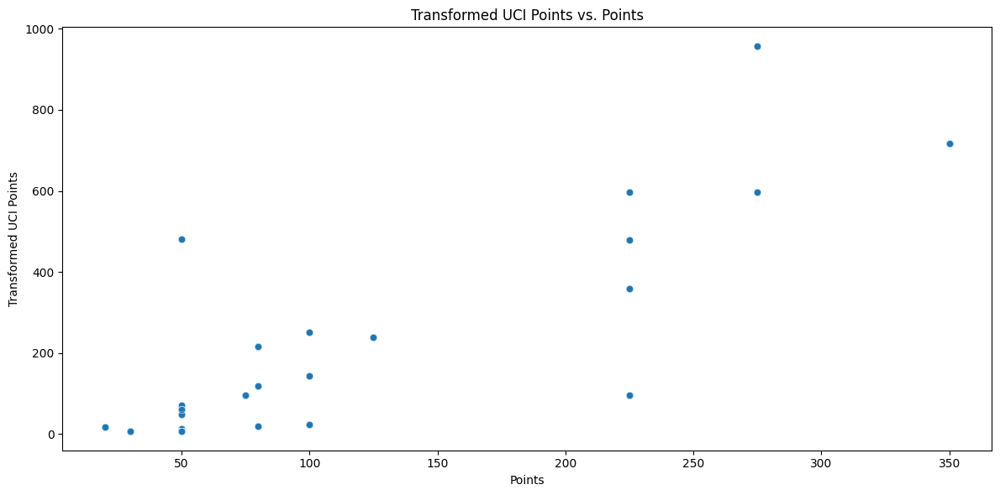

In [16]:
# Calculate the scaling factor using the ratio of the means
mean_points = merged_df['points'].mean()
mean_uci_points = merged_df['uci_points'].mean()

# Transform UCI points to match the scale of points
merged_df['uci_points_transformed'] = merged_df['uci_points'] * (mean_points / mean_uci_points)

# Optionally, you can standardize both columns to have the same mean and variance
merged_df['points_standardized'] = (merged_df['points'] - merged_df['points'].mean()) / merged_df['points'].std()
merged_df['uci_points_standardized'] = (merged_df['uci_points_transformed'] - merged_df['uci_points_transformed'].mean()) / merged_df['uci_points_transformed'].std()

# Now, you can visualize the relationship between the original points and the transformed UCI points
plt.figure(figsize=(12, 6))
sns.scatterplot(x='points', y='uci_points_transformed', data=merged_df, alpha=0.5)
plt.title('Transformed UCI Points vs. Points')
plt.xlabel('Points')
plt.ylabel('Transformed UCI Points')
plt.tight_layout()
plt.show()

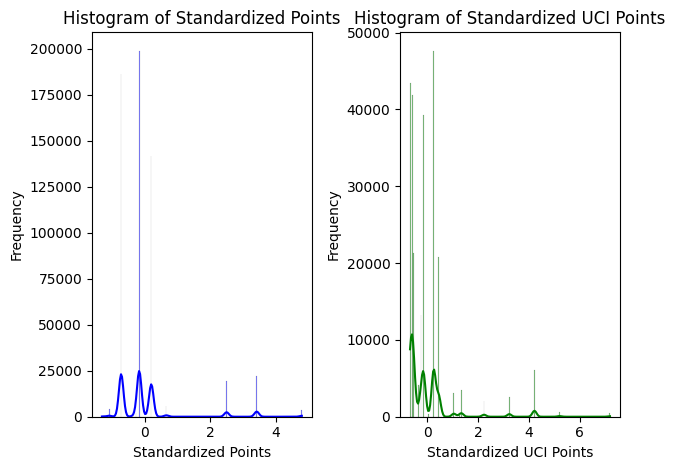

In [101]:
plt.subplot(1, 2, 1)
sns.histplot(merged_df['points_standardized'], bins='auto', color='blue', kde=True)
plt.title('Histogram of Standardized Points')
plt.xlabel('Standardized Points')
plt.ylabel('Frequency')

# Histogram for standardized uci_points
plt.subplot(1, 2, 2)
sns.histplot(merged_df['uci_points_standardized'], bins='auto', color='green', kde=True)
plt.title('Histogram of Standardized UCI Points')
plt.xlabel('Standardized UCI Points')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

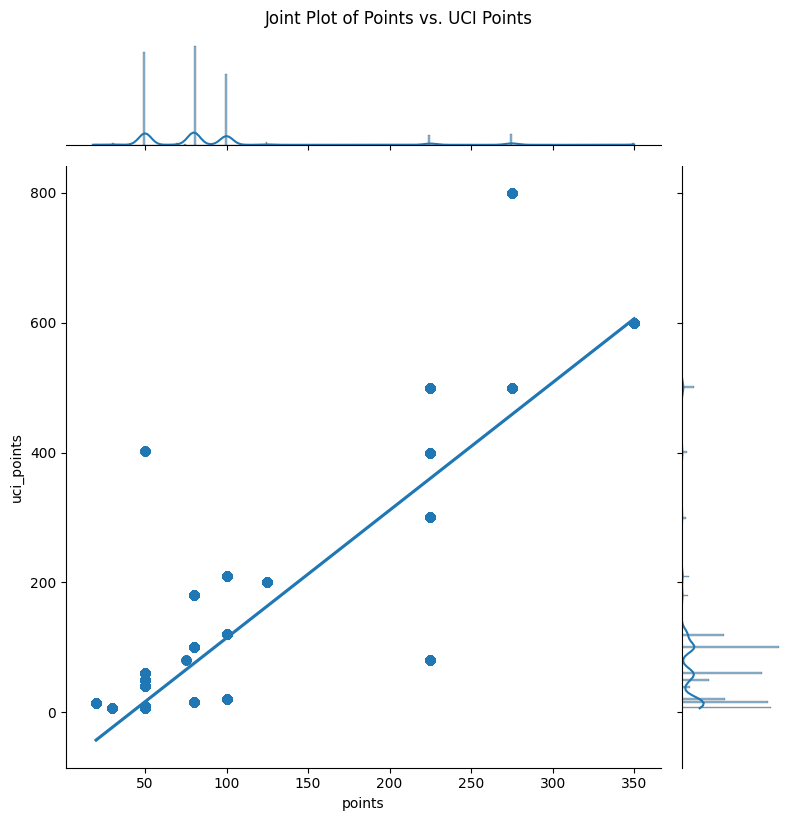

In [52]:
sns.jointplot(x='points', y='uci_points', data=merged_df, kind='reg', height=8)
plt.suptitle('Joint Plot of Points vs. UCI Points', y=1.02)
plt.show()

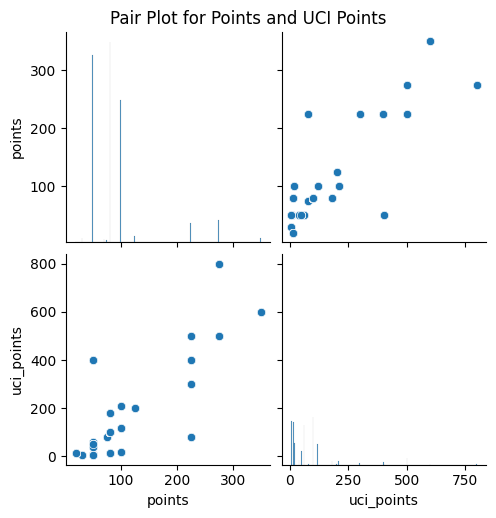

In [53]:
sns.pairplot(merged_df[['points', 'uci_points']])
plt.suptitle('Pair Plot for Points and UCI Points', y=1.02)
plt.show()

### Observations from the Scatter Plot of Transformed UCI Points vs. Points

The scatter plot shows a general positive relationship between "Transformed UCI Points" and "Points." This means that as "Points" increase, "Transformed UCI Points" tend to increase as well. However, the relationship is not perfectly linear, as there is some scatter around the trendline.

#### Key Observations:
- **Clustering**: There are two distinct clusters of points: a group of points with lower "Points" values and a group with higher "Points" values. This suggests that there might be two different groups or categories of cyclists or races.
- **Outliers**: There are a few outliers, especially in the group with higher "Points" values. These outliers might have a significant impact on the correlation coefficient.
- **Spread**: The spread of the points around the trendline is relatively large, indicating that there is some variability in the relationship between the two variables.

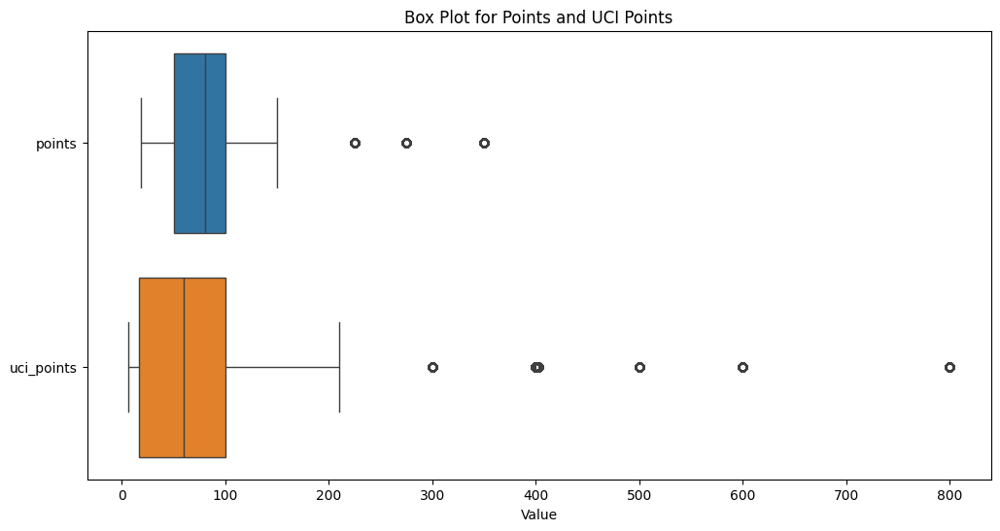

In [54]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=merged_df[['points', 'uci_points']], orient='h')
plt.title('Box Plot for Points and UCI Points')
plt.xlabel('Value')
plt.show()

### Observations from the Box Plot for Points and UCI Points

The box plot provides a visual comparison of the distributions of "points" and "uci_points." Here's what we can observe:

#### Median and Interquartile Range:
- **Median**: The median "points" value is significantly higher than the median "uci_points" value. This indicates that the typical "points" value is much larger than the typical "uci_points" value.
- **Interquartile Range (IQR)**: The IQR for "points" is much smaller than the IQR for "uci_points." This suggests that the middle 50% of "points" values are more tightly clustered together compared to "uci_points."

#### Outliers:
- **Points**: There are a few outliers on the high end of the "points" distribution, indicating that there are some exceptionally high values.
- **UCI Points**: There are also a few outliers on the high end of the "uci_points" distribution, but they are less prominent than the outliers in "points."

#### Overall Distribution:
- **Points**: The "points" distribution is highly skewed to the right, with a long tail on the right side. This suggests that there are some very high "points" values that are pulling the mean to the right.
- **UCI Points**: The "uci_points" distribution is also skewed to the right, but to a lesser extent than "points." This indicates that there are some high "uci_points" values, but they are not as extreme as the high "points" values.

#### Relationship:
Based on the box plot, we can say that there is a general positive relationship between "points" and "uci_points," as the median and IQR of "points" are both higher than those of "uci_points." However, the relationship is not perfectly linear, as there are some outliers and differences in the distributions.

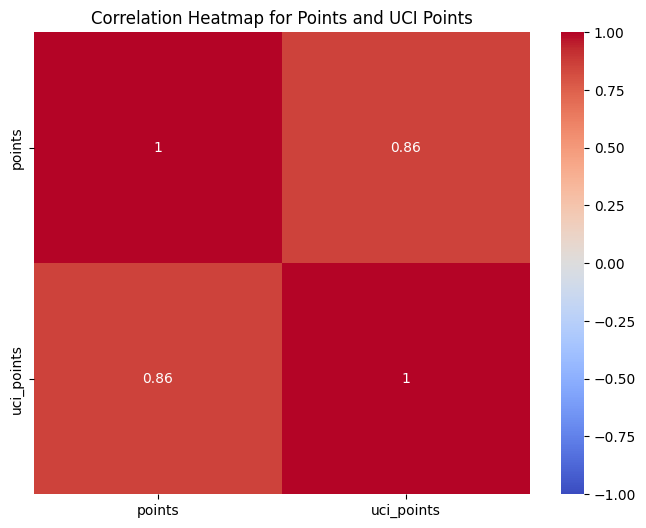

In [55]:
correlation_matrix = merged_df[['points', 'uci_points']].corr()
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Heatmap for Points and UCI Points')
plt.show()

### Observations from the Correlation Heatmap

The value of 0.86 in the heatmap indicates a strong positive correlation between the two variables. This confirms the observations we made from the scatter plot and box plot:

- **Positive correlation**: As "points" increase, "uci_points" tend to increase as well.
- **Strength**: The correlation coefficient of 0.86 suggests a strong, almost linear relationship between the two variables.

This high correlation suggests that "points" and "uci_points" are closely related and that changes in one variable are likely to be accompanied by changes in the other. However, it's important to remember that correlation does not imply causation. Further analysis would be needed to establish a causal relationship between the two variables.

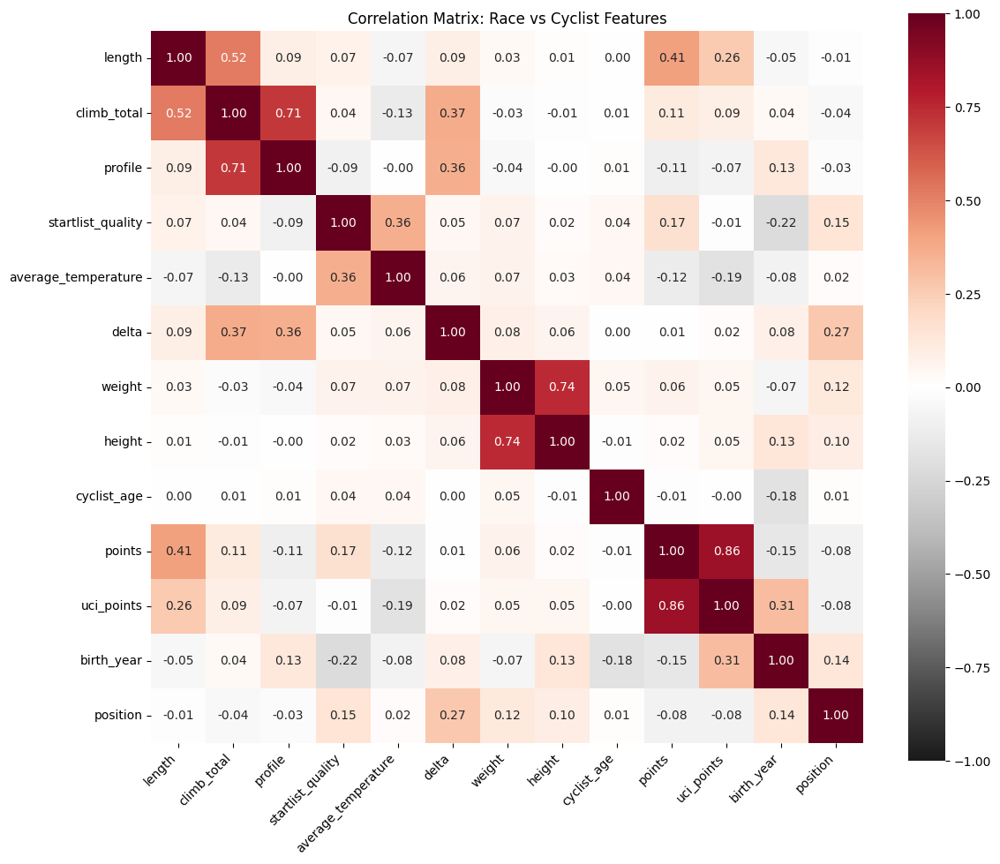


Top 6 Strongest Correlations:
points vs uci_points: 0.856
weight vs height: 0.742
climb_total vs profile: 0.708
length vs climb_total: 0.521
length vs points: 0.407
climb_total vs delta: 0.371


In [16]:
columns_of_interest = [
        'length', 'climb_total', 'profile', 'startlist_quality', 
        'average_temperature', 'delta', 'weight', 'height', 
        'cyclist_age', 'points', 'uci_points', 'birth_year', 'position'
]

def create_correlation_matrix(merged_df, columns_of_interest=columns_of_interest):
    # Select the relevant columns from the correlation matrix shown in the image
    
    
    # Create a copy of races dataframe with selected columns
    race_data = merged_df[columns_of_interest].copy()
    
    # Calculate correlation matrix
    corr_matrix = race_data.corr(method='pearson')
    
    # Create the visualization
    plt.figure(figsize=(12, 10))
    
    # Create heatmap
    sns.heatmap(corr_matrix, 
                annot=True,  # Show correlation values
                fmt='.2f',   # Format to 2 decimal places
                cmap='RdGy_r',  # Red-Grey-Blue colormap reversed
                vmin=-1,     # Minimum correlation value
                vmax=1,      # Maximum correlation value
                center=0,    # Center the colormap at 0
                square=True) # Make the plot square-shaped
    
    # Rotate x-axis labels
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    
    # Add title
    plt.title('Correlation Matrix: Race vs Cyclist Features')
    
    # Adjust layout to prevent label cutoff
    plt.tight_layout()
    
    return plt.gcf()

# Function to display top correlations
def display_top_correlations(corr_matrix, n=6):
    # Get upper triangle of correlation matrix
    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    
    # Stack the correlations and sort by absolute value
    stacked = upper.stack()
    sorted_corr = stacked.loc[np.abs(stacked).sort_values(ascending=False).index]
    print(f"\nTop {n} Strongest Correlations:")
    for i in range(min(n, len(sorted_corr))):
        pair = sorted_corr.index[i]
        value = sorted_corr.iloc[i]
        print(f"{pair[0]} vs {pair[1]}: {value:.3f}")

# Usage example:
fig = create_correlation_matrix(merged_df=merged_df)
plt.show()

corr_matrix = merged_df[columns_of_interest].corr()
display_top_correlations(corr_matrix)

In [52]:
races['date'] = pd.to_datetime(races['date'])
cyclists['birth_year'] = pd.to_datetime(cyclists['birth_year'])

# Merge races with cyclists on the '_url' column to bring cyclist birth years into the races DataFrame
merged_df = races.merge(cyclists[['_url', 'birth_year']], left_on='cyclist', right_on='_url', how='left')

# Calculate cyclist's age at the time of the race
merged_df['cyclist_age'] = merged_df['date'].dt.year - merged_df['birth_year'].dt.year
# merged_df.head(10)
# races[races['cyclist_age'] < 10]
len(cyclists[cyclists['birth_year'].dt.year == 1970])

print(len(cyclists))
len(cyclists[cyclists['birth_year'].dt.year == 1970])

6134


6121

## Weight vs. Race Position 
In the next cell, we implement the scatter plot between weight and race position. This visualization will help us understand if there is any relationship between a cyclist's weight and their finishing position in races.

### Key Points:
- **Objective**: To visualize the relationship between cyclist weight and race position.
- **Data Source**: The merged dataframe `merged_df` which combines cyclist and race data.
- **Expected Outcome**: Identify any trends or patterns that suggest how weight influences race outcomes.


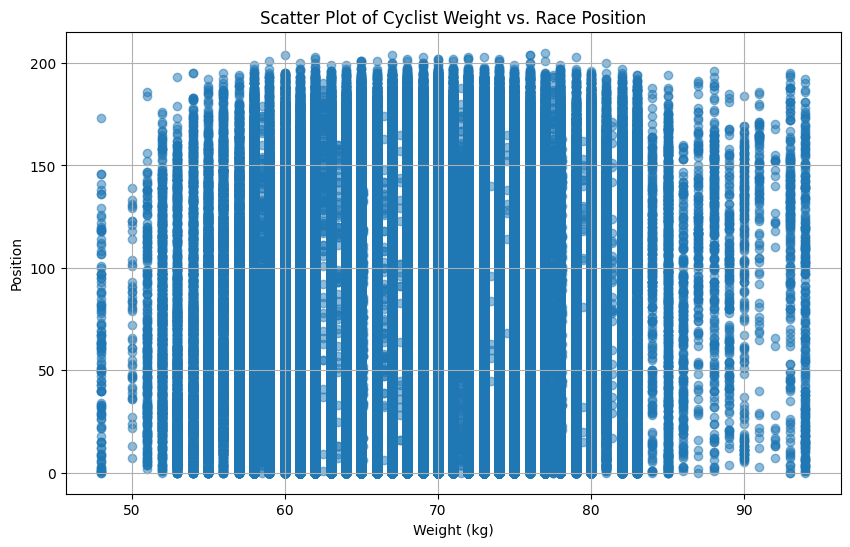

In [56]:


# Scatter plot for weight and position
plt.figure(figsize=(10, 6))
plt.scatter(merged_df['weight'], merged_df['position'], alpha=0.5)
plt.title('Scatter Plot of Cyclist Weight vs. Race Position')
plt.xlabel('Weight (kg)')
plt.ylabel('Position')
plt.grid(True)
plt.show()

### Analysis of Scatter Plot for Weight and Position

The scatter plot of cyclist weight versus race position does not show a clear correlation between these two variables. Cyclists with different weights finish at various positions, indicating that weight alone is not a strong predictor of race outcomes.

#### Key Observations:
- **No Clear Trend**: There is no evident trend or pattern that suggests a direct relationship between a cyclist's weight and their finishing position.
- **Outliers**: We observe a few outliers in the data:
    - Cyclists weighing above 85kg.
    - Cyclists weighing below 55kg.
- **Outliers and Race Outcomes**: For these outliers, the probability of winning a race is very low. This suggests that extreme weights, either very high or very low, might be disadvantageous in professional cycling races.

These observations highlight the complexity of factors influencing race outcomes and suggest that other variables, such as race profile, cyclist's team, and race conditions, might play a more significant role.

## Scatter Plot for Height and Race Position

In the next cell, we will visualize the relationship between a cyclist's height and their finishing position in races. This scatter plot will help us understand if there is any correlation between these two variables.

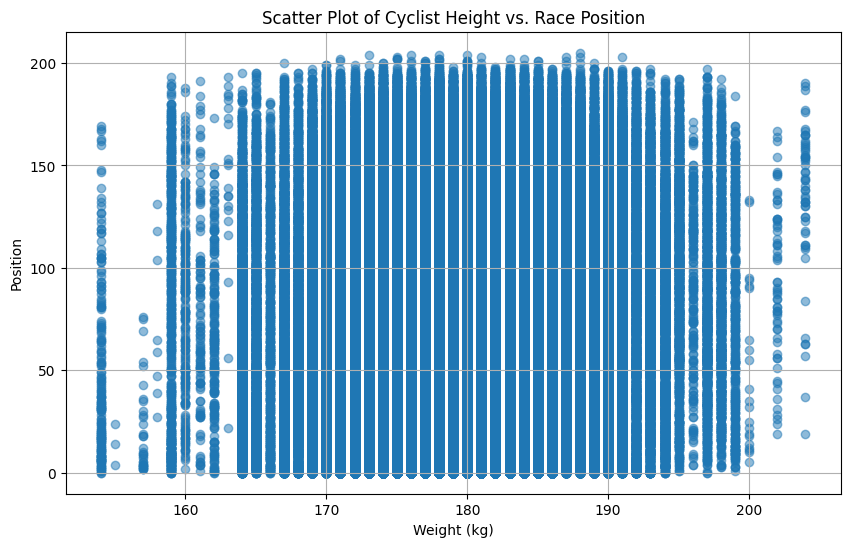

In [57]:


# Merge cyclists and races dataframes on the '_url' column and drop rows with null values
temp = merged_df.dropna(subset=['height', 'position'])
# Scatter plot for weight and position
plt.figure(figsize=(10, 6))
plt.scatter(temp['height'], temp['position'], alpha=0.5)
plt.title('Scatter Plot of Cyclist Height vs. Race Position')
plt.xlabel('Weight (kg)')
plt.ylabel('Position')
plt.grid(True)
plt.show()

### Scatter Plot for Height and Position

The scatter plot between height and position has very similar considerations to the scatter plot between weight and position.

#### Key Observations:
- **No Clear Trend**: Similar to weight, there is no evident trend or pattern that suggests a direct relationship between a cyclist's height and their finishing position.
- **Outliers**: There are a few outliers in the data:
    - Cyclists with extreme heights (either very tall or very short).
- **Outliers and Race Outcomes**: For these outliers, the probability of winning a race is very low. This suggests that extreme heights, either very tall or very short, might be disadvantageous in professional cycling races.

These observations reinforce the complexity of factors influencing race outcomes and suggest that other variables, such as race profile, cyclist's team, and race conditions, might play a more significant role.

## Scatter Plot for Cyclist Age and Race Position

In the next cell, we will visualize the relationship between a cyclist's age and their finishing position in races. This scatter plot will help us understand if there is any correlation between these two variables.

### Key Points:
- **Objective**: To visualize the relationship between cyclist age and race position.
- **Data Source**: The merged dataframe `merged_df` which combines cyclist and race data.
- **Expected Outcome**: Identify any trends or patterns that suggest how age influences race outcomes.

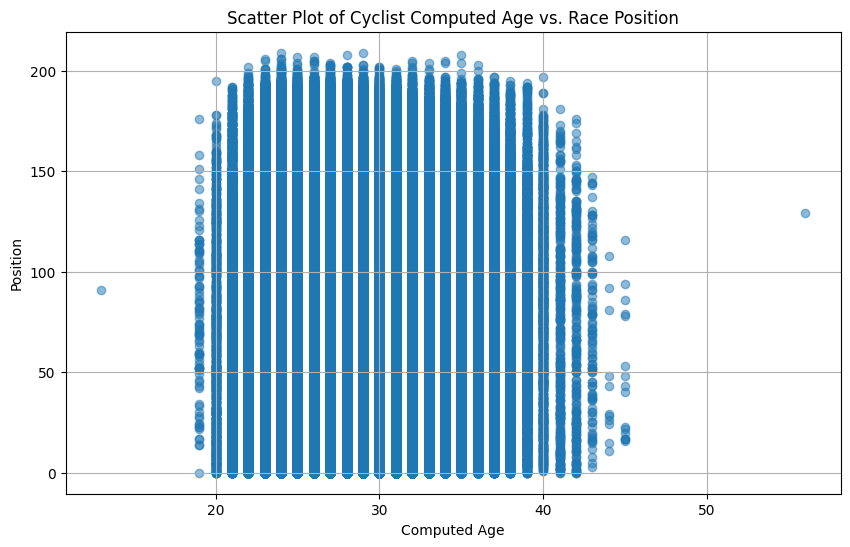

In [58]:
cyclists_with_birth_year = merged_df[merged_df['cyclist_age'].notna()].copy()

# Scatter plot for computed_age and position
plt.figure(figsize=(10, 6))
plt.scatter(cyclists_with_birth_year['cyclist_age'],cyclists_with_birth_year['position'], alpha=0.5)
plt.title('Scatter Plot of Cyclist Computed Age vs. Race Position')
plt.xlabel('Computed Age')
plt.ylabel('Position')
plt.grid(True)
plt.show()
del cyclists_with_birth_year

### Analyzing the Scatter Plot of Cyclist Computed Age vs. Race Position
#### Key Observations:

- **Clustering**: The data points are clustered around specific age ranges, particularly between 25 and 35. This suggests that a significant portion of top-performing cyclists fall within this age bracket.
- **Outliers**: There are a few outliers, especially at the lower end of the age spectrum. These could represent exceptional young cyclists or potential errors in the data.
- **No Strong Correlation**: While there seems to be a slight trend towards lower positions for older cyclists, the correlation between age and race position is not strong. This indicates that other factors, such as training, experience, and equipment, likely play a more significant role in determining performance.
- **Data Density**: The data is denser in certain age ranges, suggesting that these age groups are more common among professional cyclists.
- **Exceptional Performances**: Despite the general trend, some cyclists managed to win races even when they were over 40 years old, highlighting that age is not an absolute barrier to top performance.

These observations highlight the complexity of factors influencing race outcomes and suggest that while age may have some impact, it is not the sole determinant of a cyclist's performance.

## Scatter Plot for Cyclist Age and Points

In the next cell, we will visualize the relationship between a cyclist's age and the points they score in races. This scatter plot will help us understand if there is any correlation between these two variables.

#### Key Points:
- **Objective**: To visualize the relationship between cyclist age and points.
- **Data Source**: The merged dataframe `merged_df` which combines cyclist and race data.
- **Expected Outcome**: Identify any trends or patterns that suggest how age influences the points scored by cyclists.

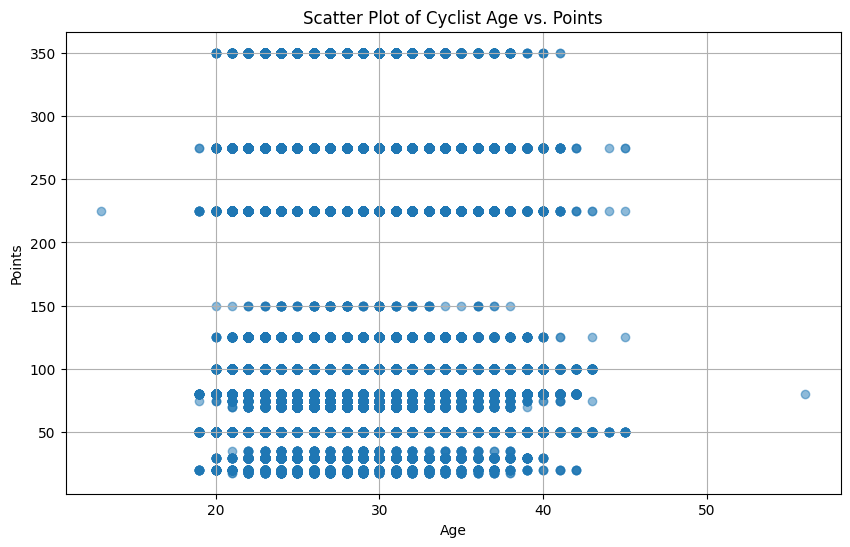

In [59]:
# Scatter plot for age and points
temp = merged_df.dropna(subset=['cyclist_age', 'points'])
plt.figure(figsize=(10, 6))
plt.scatter(temp['cyclist_age'],temp['points'], alpha=0.5)
plt.title('Scatter Plot of Cyclist Age vs. Points')
plt.xlabel('Age')
plt.ylabel('Points')
plt.grid(True)
plt.show()

### Scatter Plot of Cyclist Age vs. Points

The scatter plot shows the relationship between the age of cyclists and the number of points they score.

#### Key Observations:

- **Clustering**: There are distinct clusters of points at certain age ranges. For example, there is a large cluster of points around the age of 30, and a smaller cluster around the age of 40.
- **Range of Points**: The number of points scored varies widely, with some cyclists scoring as few as 50 points and others scoring over 300 points.
- **No Clear Correlation**: There doesn't seem to be a strong linear relationship between age and points. While there are some trends, such as the clustering of points at certain ages, the data points are scattered fairly evenly across the graph.
- **Outliers**: There are a few outliers, such as the cyclist who scored over 300 points at a relatively young age.

## Heatmap of Correlations Between Selected Features

In the next cell, we will visualize the heatmap showing the correlations between the following features: `length`, `climb_total`, `weight`, `height`, and `position`. This heatmap will help us understand the relationships between these variables.

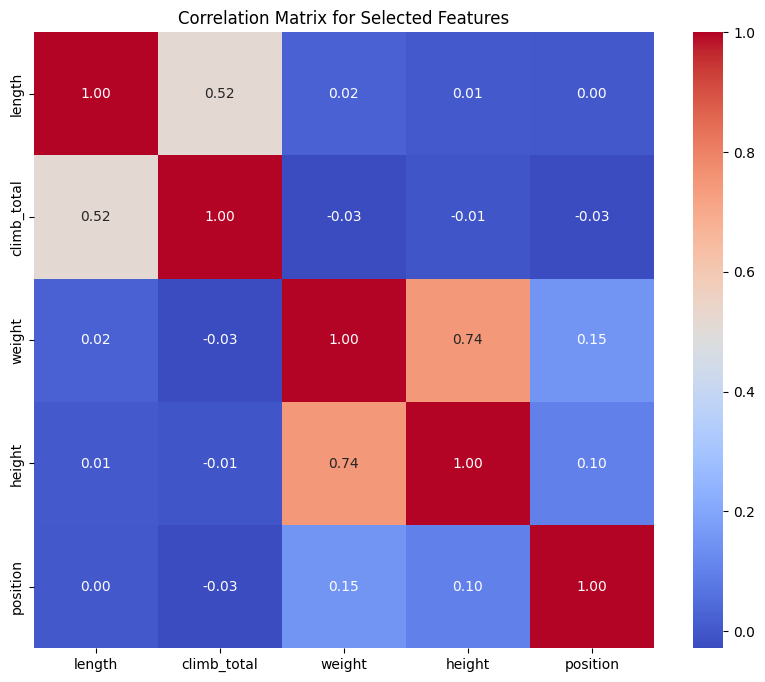

In [60]:

# Select relevant columns for correlation
columns_of_interest = ['length', 'climb_total', 'weight', 'height', 'position']
correlation_matrix = merged_df[columns_of_interest].dropna(subset=columns_of_interest).corr()

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix for Selected Features')
plt.show()


### Correlation Matrix Analysis

The correlation matrix provides a quantitative measure of the linear relationships between different numerical features in the dataset. Here, we analyze the correlation matrix for the selected features: `length`, `climb_total`, `weight`, `height`, and `position`.

#### Key Observations:
- **Length and Climb Total**: There is a moderate positive correlation (0.52) between the length of the race and the total climb. This suggests that longer races tend to have more climbing.
- **Weight and Height**: As expected, there is a strong positive correlation (0.73) between a cyclist's weight and height. Taller cyclists tend to weigh more.
- **Weight and Position**: There is a very weak positive correlation (0.12) between a cyclist's weight and their finishing position.
- **Height and Position**: The correlation between height and position is even weaker (0.10), suggesting that height alone is not a significant predictor of race outcomes.


These observations highlight that while some features are correlated, the relationships are generally weak, suggesting that multiple factors likely influence race outcomes. Further analysis, including more advanced statistical techniques and consideration of additional variables, may be necessary to uncover deeper insights.




## Histogram of Climb Total

In the next cell, we will visualize the histogram of the `climb_total` feature. This histogram will help us understand the distribution of the total climb in races, providing insights into the range and frequency of different climb totals.


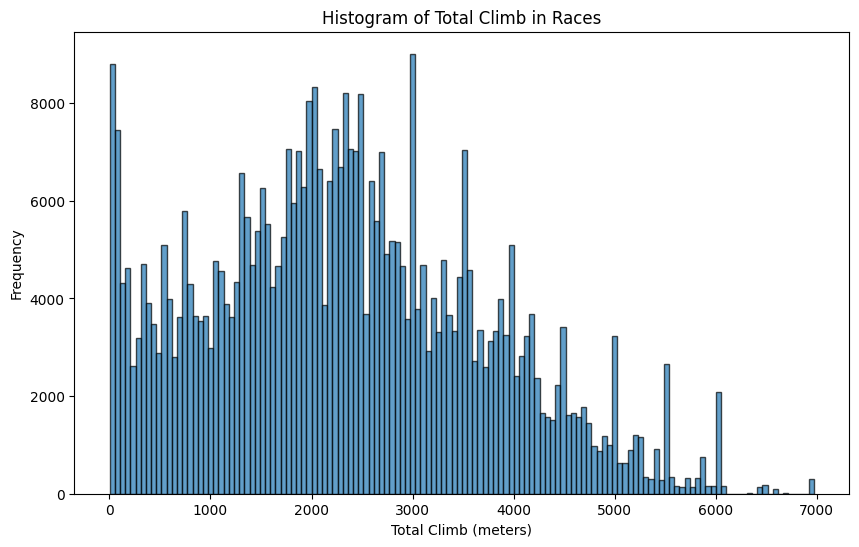

In [106]:
# Plot the histogram for the climb_total feature
plt.figure(figsize=(10, 6))
plt.hist(merged_df['climb_total'], bins="auto", edgecolor='black', alpha=0.7)
plt.title('Histogram of Total Climb in Races')
plt.xlabel('Total Climb (meters)')
plt.ylabel('Frequency')
plt.show()

### Histogram Analysis of Total Climb Values
The histogram shows the distribution of the total climb in races. The x-axis represents the total climb in meters, and the y-axis represents the frequency of races with that total climb.

#### Key Observations:
- **Skewness**: The distribution is skewed to the right, meaning there are a few races with very high total climbs, but most races have relatively lower total climbs.
- **Mode**: The most common total climb is around 2,000 meters.
- **Range**: The total climb ranges from 0 to around 7,000 meters.
- **Outliers**: There are a few outliers on the right side of the distribution, indicating races with exceptionally high total climbs.



## Seasonality Analysis of Cyclist Performance

The following plots analyze the seasonality of cyclist performance. These visualizations will help us understand how different factors such as nationality, age group, and race profile influence the performance of cyclists throughout the year.

Removing rows with missing values in the 'points' column...


<Figure size 1200x600 with 0 Axes>

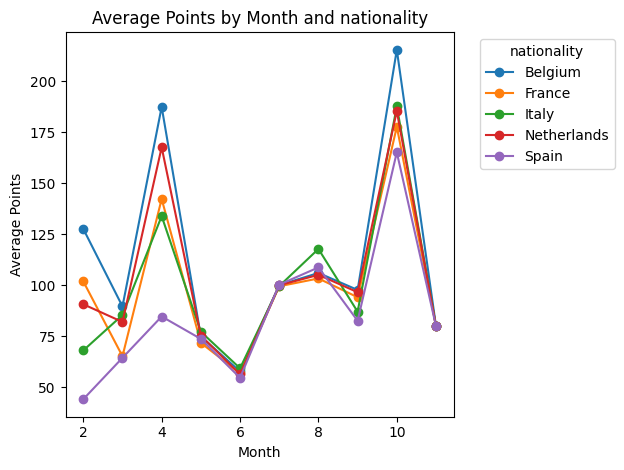

<Figure size 1200x600 with 0 Axes>

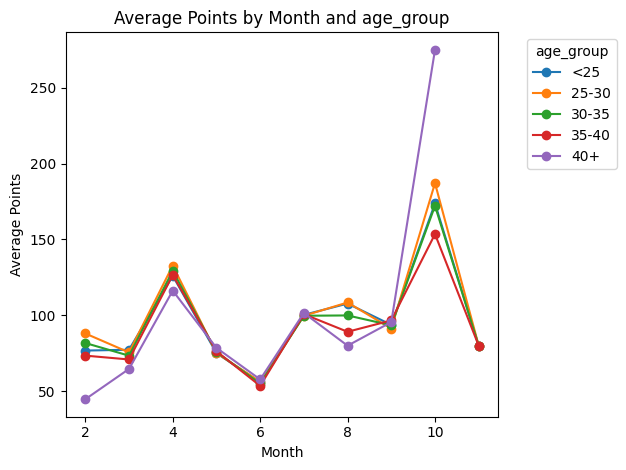

<Figure size 1200x600 with 0 Axes>

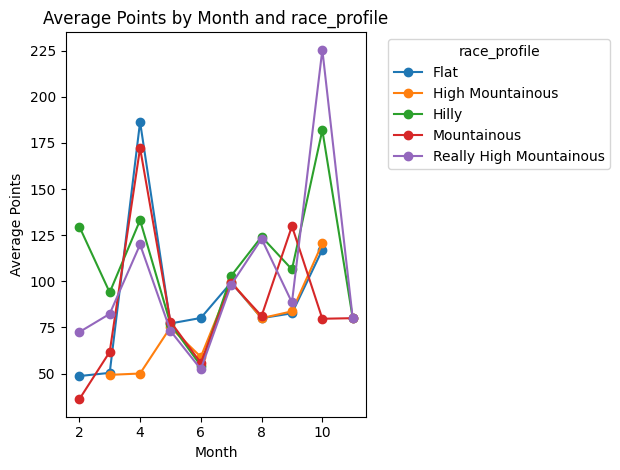

Top 5 nationalities by count:
nationality
Italy          102084
Spain           91025
France          84850
Belgium         54300
Netherlands     36357
Name: count, dtype: int64

Average points by month:
month
2      81.828385
3      75.128930
4     129.798617
5      75.370353
6      55.747399
7      99.900555
8     105.179461
9      92.560619
10    177.667208
11     80.000000
Name: points, dtype: float64

Average points by month and nationality:
nationality  Albania    Algeria   Argentina   Australia     Austria  \
month                                                                 
2                0.0   0.000000   45.909091   67.506562   77.788462   
3              125.0  66.666667   65.219512   70.564134   71.280311   
4              275.0  76.923077   67.391304  115.206281  108.578947   
5               80.0  50.000000   77.950000   75.931025   75.424370   
6                0.0  50.000000   51.308411   52.932826   53.037443   
7                0.0   0.000000  100.905797   99.985

In [62]:
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime
seasonality_analysis = merged_df.copy()


print("Removing rows with missing values in the 'points' column...")
seasonality_analysis = seasonality_analysis[~seasonality_analysis['points'].isna()]


seasonality_analysis['month'] = pd.to_datetime(seasonality_analysis['date']).dt.month

# Function to analyze seasonality
def analyze_seasonality(data, group_by, metric='points'):
    grouped = data.groupby(['month', group_by], observed=True)[metric]
    seasonal_data = grouped.mean().unstack()
    
    plt.figure(figsize=(12, 6))
    seasonal_data.plot(marker='o')
    plt.title(f'Average {metric.capitalize()} by Month and {group_by}')
    plt.xlabel('Month')
    plt.ylabel(f'Average {metric.capitalize()}')
    plt.legend(title=group_by, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# Analyze seasonality by nationality (top 5 nationalities)
top_nationalities = seasonality_analysis['nationality'].value_counts().nlargest(5).index
nationality_data = seasonality_analysis[seasonality_analysis['nationality'].isin(top_nationalities)]


analyze_seasonality(nationality_data, 'nationality')

# Analyze seasonality by age group
seasonality_analysis['age_group'] = pd.cut(seasonality_analysis['cyclist_age'], bins=[0, 25, 30, 35, 40, 100], labels=['<25', '25-30', '30-35', '35-40', '40+'])
merged_df["age_group"] = seasonality_analysis["age_group"]
analyze_seasonality(seasonality_analysis, 'age_group')

# Analyze seasonality by race difficulty 
seasonality_analysis['race_profile'] = seasonality_analysis.apply(lambda row: 'Flat' if row['profile'] == 1.0 else ('Hilly' if row['profile'] == 2.0 else (
    'Mountainous' if row['profile'] == 3.0 else ('High Mountainous' if row['profile'] == 4.0 else 'Really High Mountainous')
)), axis=1)
# Analyze seasonality by race difficulty
analyze_seasonality(seasonality_analysis, 'race_profile')

# Print the top 5 nationalities by count
print("Top 5 nationalities by count:")
print(seasonality_analysis['nationality'].value_counts().nlargest(5))

# Print the average points by month
print("\nAverage points by month:")
print(seasonality_analysis.groupby('month', observed=True)['points'].mean())

# Print the average points by month and nationality
print("\nAverage points by month and nationality:")
print(seasonality_analysis.groupby(['month', 'nationality'], observed=True)['points'].mean().unstack().fillna(0))

# Print the average points by month and age group
print("\nAverage points by month and age group:")
print(seasonality_analysis.groupby(['month', 'age_group'], observed=True)['points'].mean().unstack().fillna(0))

# Print the average points by month and race type
print("\nAverage points by month and race type:")
print(seasonality_analysis.groupby(['month', 'race_profile'], observed=True)['points'].mean().unstack().fillna(0))

# Print the count of cyclists in each age group
print("\nCount of cyclists in each age group:")
print(seasonality_analysis['age_group'].value_counts().sort_index())
del seasonality_analysis


### Analysis of Seasonality in Cycling Performance

The first plot shows the average points scored by different nationalities over the course of a season, broken down by month.

#### Key Observations:

- **Seasonal fluctuations**: The average points scored by each nationality tend to fluctuate throughout the season. Some nationalities have peaks in certain months, while others have more consistent performance throughout the year.
- **National differences**: There are clear differences in the performance of different nationalities. Some consistently score higher points than others, while others may have more variable performance.
- **Month-to-month variations**: Within each nationality, there can be significant variations in performance from month to month. This suggests that factors such as tournament schedule, weather conditions, or team dynamics may influence performance.


The second plot shows the average points scored by different age groups over the course of a season, broken down by month.

#### Key Observations:

- **Age-based differences**: There are clear differences in the performance of different age groups. Younger cyclists (under 25) tend to have higher average points, while older cyclists (over 40) generally score lower points.
- **Seasonal fluctuations**: Within each age group, there can be significant variations in performance from month to month. This suggests that factors such as tournament schedule, weather conditions, or training regimens may influence performance.
- **Peak performance**: The <25 age group tends to have the highest average points throughout the season, suggesting that they are generally the most competitive.
- **Consistency**: The 25-30 age group shows relatively consistent performance throughout the season, indicating a high level of skill and experience.
- **Diminishing returns**: Older age groups (35-40 and 40+) generally experience a decline in performance compared to younger cyclists. This may be due to factors such as physical decline or reduced training intensity.

The third plot shows the average points scored by different race profiles over the course of a season, broken down by month.

#### Key Observations:

- **Race profile differences**: There are clear differences in the performance of different race profiles. Flat races tend to have the highest average points, followed by hilly and mountainous races. High mountainous races have the lowest average points.
- **Seasonal fluctuations**: Within each race profile, there can be significant variations in performance from month to month. This suggests that factors such as tournament schedule, weather conditions, or course difficulty may influence performance.
- **Peak performance**: Flat races tend to have the highest average points throughout the season, suggesting that they are the most competitive.
- **Consistency**: Mountainous races generally have lower average points throughout the season, indicating that they are more challenging for cyclists.


## Physical Attributes and Performance

In this section, we will explore how a cyclist's weight and height (from the cyclists dataframe) correlate with their performance in different race profiles (flat, hilly, mountainous, high mountainous). Assuming that 1.0 is flat, 2.0 is hilly, 3.0 mountainous and 4.0 high mountainous.


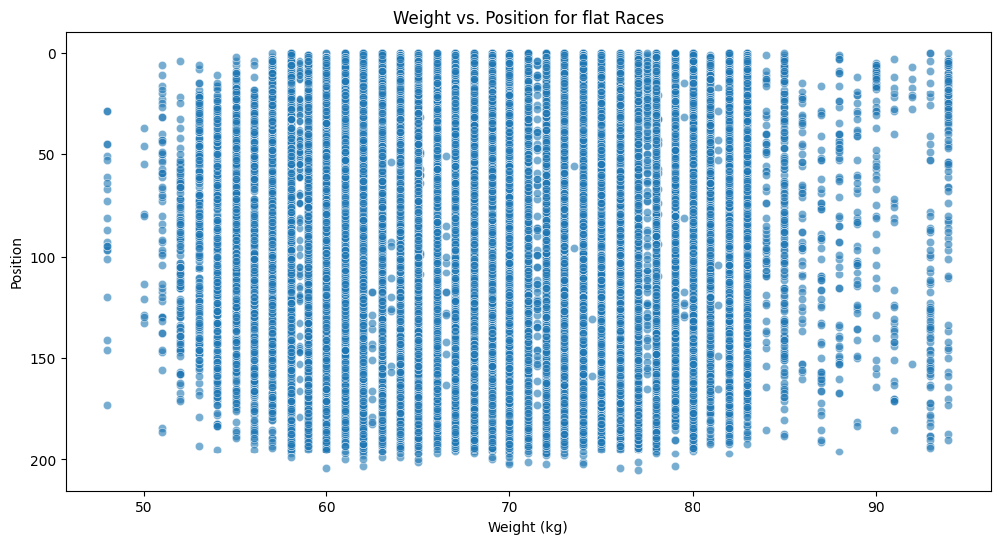

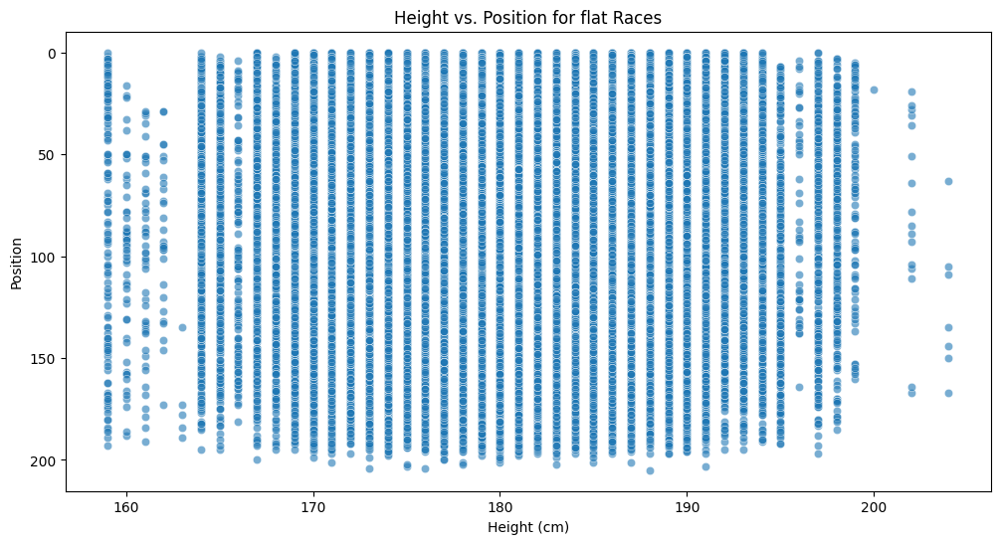

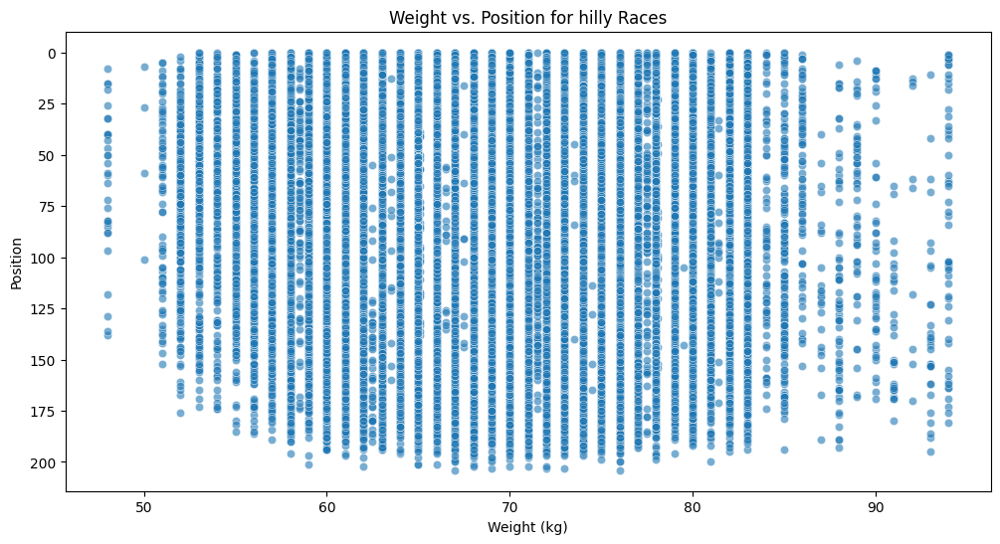

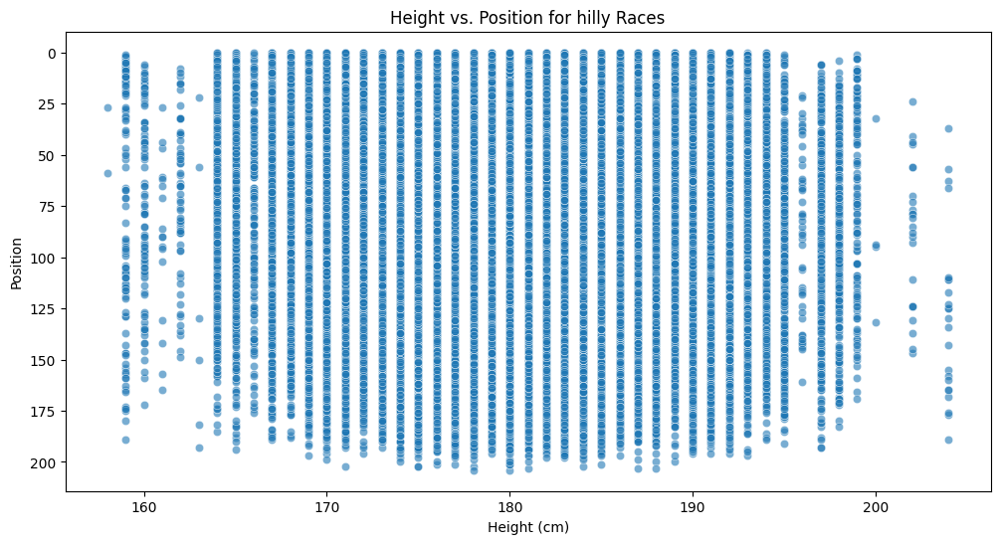

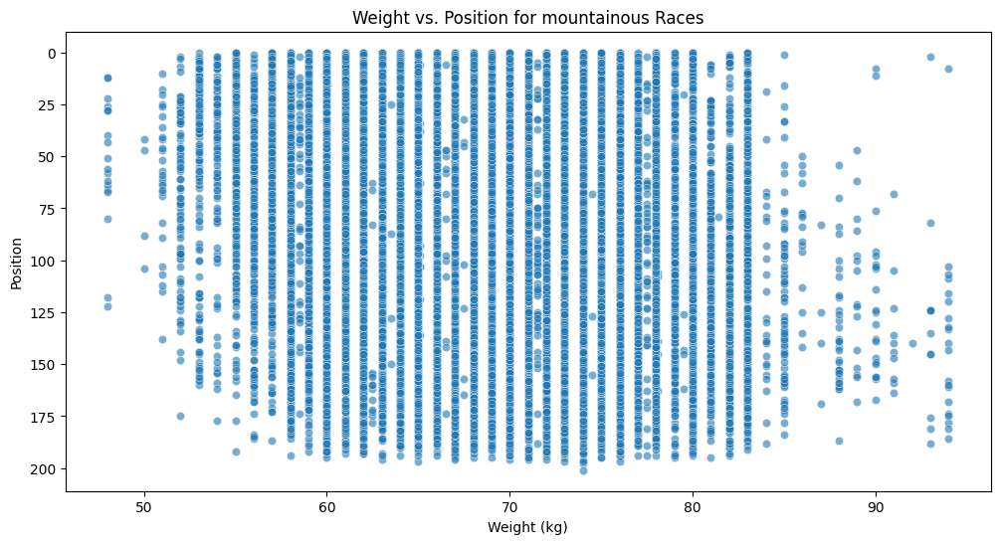

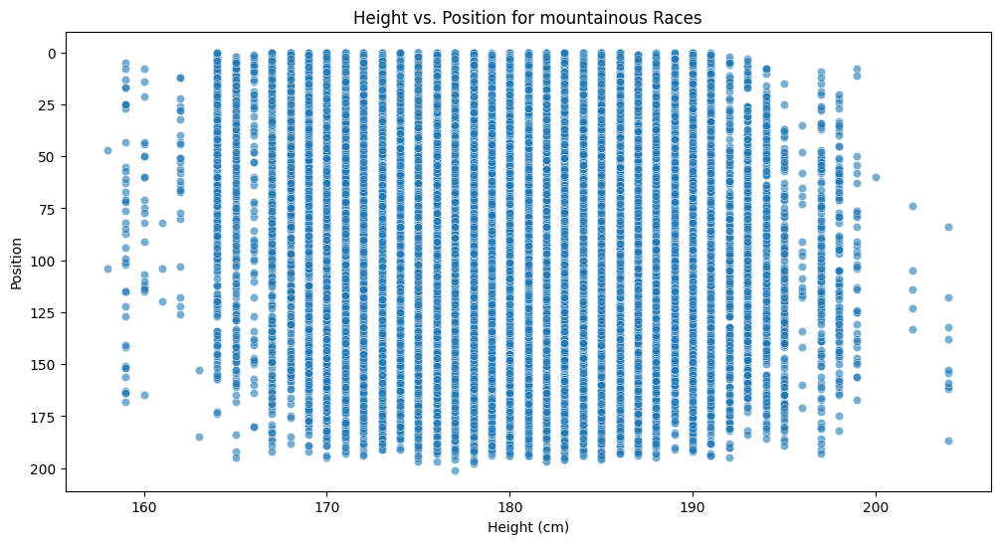

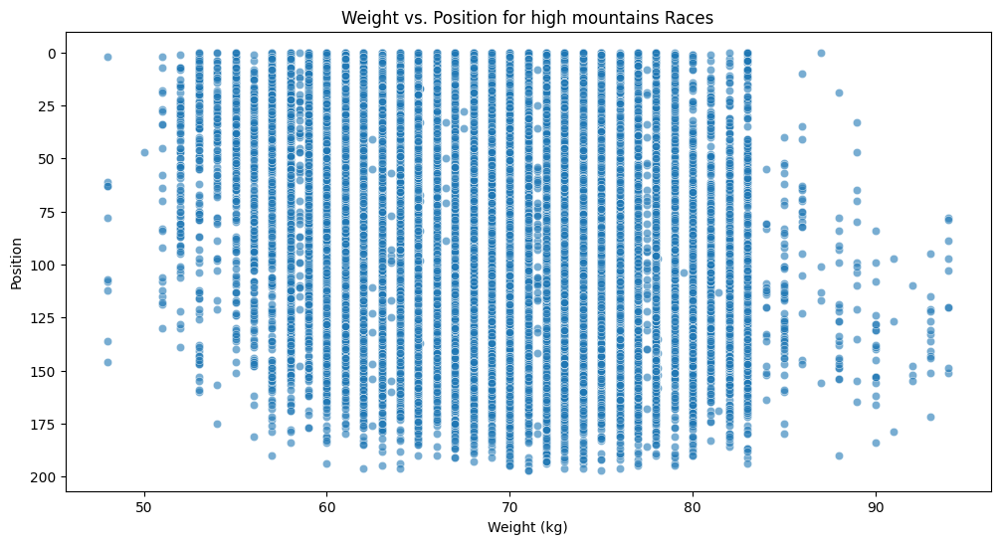

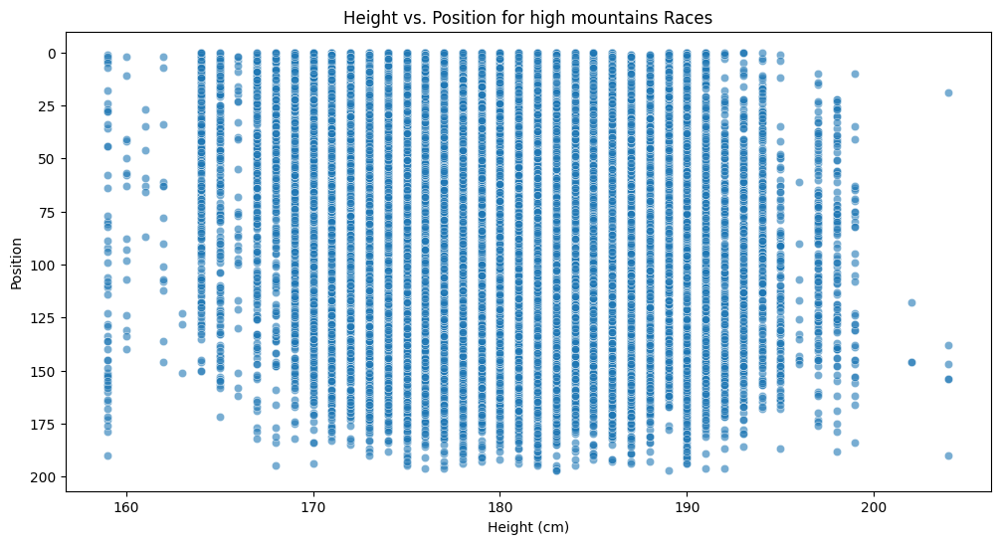

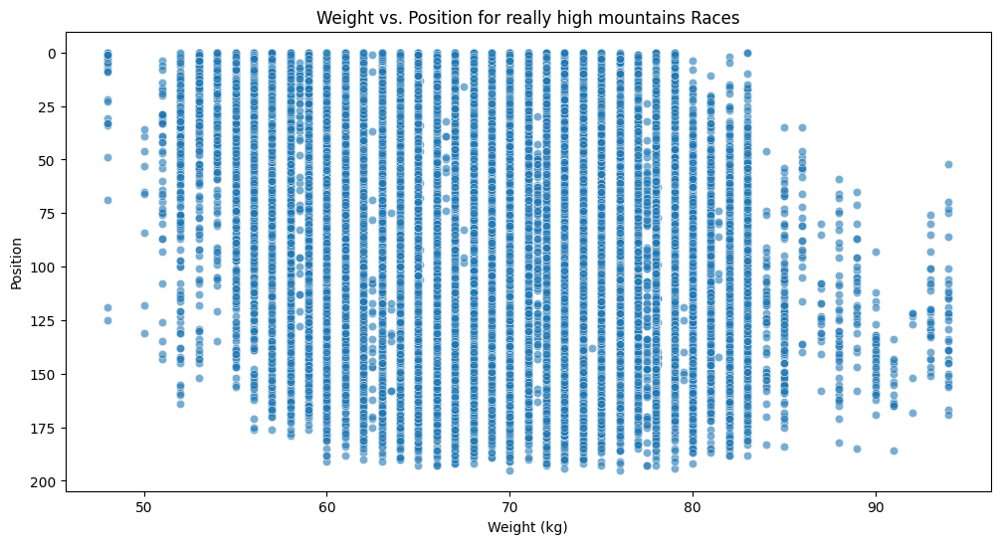

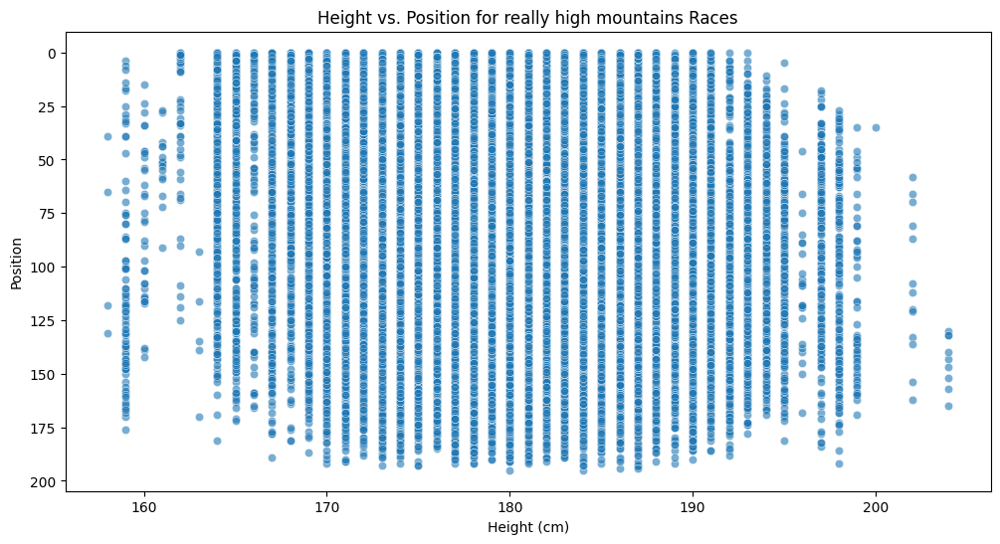

Correlation of Weight, Height and Position with Profiles
                    weight    height  position
profile                                       
1.0     weight    1.000000  0.744296 -0.072700
        height    0.744296  1.000000 -0.018447
        position -0.072700 -0.018447  1.000000
2.0     weight    1.000000  0.746757  0.092913
        height    0.746757  1.000000  0.082198
        position  0.092913  0.082198  1.000000
3.0     weight    1.000000  0.742724  0.250276
        height    0.742724  1.000000  0.152557
        position  0.250276  0.152557  1.000000
4.0     weight    1.000000  0.747578  0.298175
        height    0.747578  1.000000  0.163053
        position  0.298175  0.163053  1.000000
5.0     weight    1.000000  0.748017  0.367393
        height    0.748017  1.000000  0.186743
        position  0.367393  0.186743  1.000000


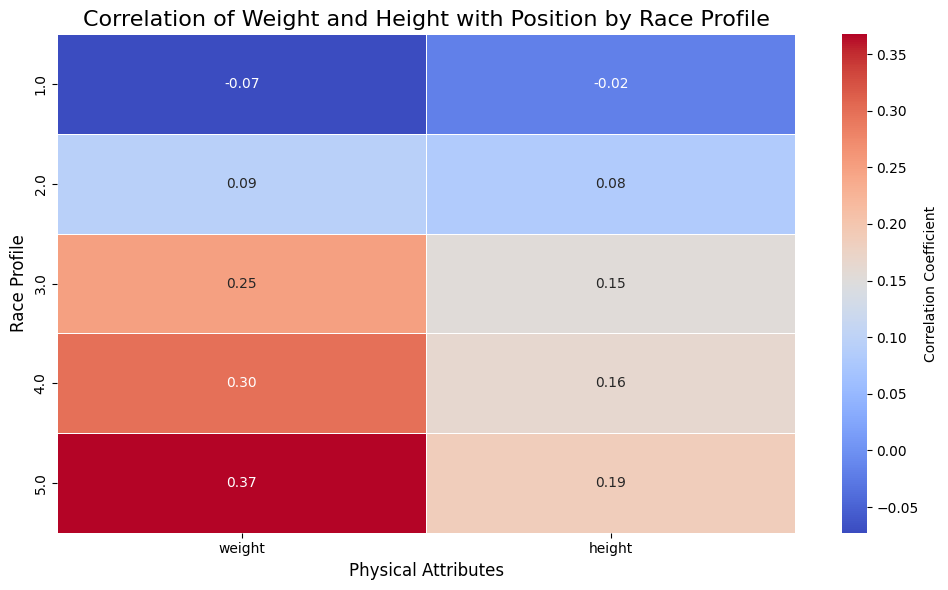

In [63]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'cyclists_df' is the cyclists dataframe and 'races_df' is the races dataframe.
# Merge cyclists and races dataframes on the 'url' or a common key for cyclists and races.
physical_attributes = merged_df.copy()


# Filter out races with missing profiles or cyclist's physical attributes
physical_attributes = physical_attributes.dropna(subset=['profile', 'weight', 'height', 'position'])

# Create a list of the race profiles to analyze
race_profiles = {1.0: 'flat', 2.0: 'hilly', 3.0: 'mountainous', 4.0: 'high mountains', 5.0: 'really high mountains'}

# Iterate through the list of profiles and create scatter plots for each
for float_profile, str_profile in race_profiles.items():
    # Filter the dataframe for the current profile
    profile_df = physical_attributes[physical_attributes['profile'] == float_profile]
    
    # Create a scatter plot for Weight vs. Position
    plt.figure(figsize=(12, 6))
    sns.scatterplot(x='weight', y='position', data=profile_df, alpha=0.6)
    plt.title(f'Weight vs. Position for {str_profile} Races')
    plt.xlabel('Weight (kg)')
    plt.ylabel('Position')
    plt.gca().invert_yaxis()  # Invert y-axis as lower positions (closer to 1) are better
    plt.show()

    # Create a scatter plot for Height vs. Position
    plt.figure(figsize=(12, 6))
    sns.scatterplot(x='height', y='position', data=profile_df, alpha=0.6)
    plt.title(f'Height vs. Position for {str_profile} Races')
    plt.xlabel('Height (cm)')
    plt.ylabel('Position')
    plt.gca().invert_yaxis()  # Invert y-axis as lower positions (closer to 1) are better
    plt.show()

# # Optional: Correlation analysis for weight and height with position, grouped by profile
# correlations = physical_attributes.groupby('profile')[['weight', 'height', 'position']].corr()
# # correlations = correlations.xs('position', level=1).drop('position', axis=1)
# sns.heatmap(correlations, annot=True, cmap='coolwarm', fmt=".2f")


correlations = physical_attributes.groupby('profile')[['weight', 'height', 'position']].corr()

print("Correlation of Weight, Height and Position with Profiles")
print(correlations)
# Extract correlations with 'position' and remove unnecessary correlations
correlations = correlations.xs('position', level=1).drop('position', axis=1)

# Plotting the heatmap
plt.figure(figsize=(10, 6))
heatmap = sns.heatmap(correlations, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5, cbar_kws={'label': 'Correlation Coefficient'})

# Customize the heatmap
heatmap.set_title('Correlation of Weight and Height with Position by Race Profile', fontsize=16)
heatmap.set_xlabel('Physical Attributes', fontsize=12)
heatmap.set_ylabel('Race Profile', fontsize=12)

# Show the plot
plt.tight_layout()
plt.show()

del correlations
del physical_attributes


# Analysis of Scatter Plots

## Flat Races

### Weight vs. Position 
- **Observation**: 
  - Large spread of data across different weights.
  - No clear linear trend or strong correlation.
  - Cyclists with a wide range of weights appear across all positions.
  - Suggests weight may not be a significant factor in determining finishing position in flat races.

### Height vs. Position 
- **Observation**: 
  - Similar spread across different heights.
  - No obvious trend indicating height significantly affects finishing position.
  - Cyclists of different heights appear to perform similarly.

### Overall Analysis
- Neither weight nor height has a clear or strong influence on a cyclist's finishing position in flat races.
- Performance might depend more on other factors like race strategy, team support, or sprinting ability.

## Hilly Races

### Weight vs. Position 
- **Observation**: 
  - Cyclists with lower weights (50-60 kg) tend to have better finishing positions.
  - Cyclists with weights beyond 70 kg tend to finish in lower positions.
  - Suggests lighter cyclists may have a performance advantage in hilly races.

### Height vs. Position
- **Observation**: 
  - More uniform distribution across different heights.
  - No strong correlation between height and finishing position.
  - Slight indication that shorter cyclists (under 170 cm) may perform slightly better, but not pronounced.

### Overall Analysis
- Weight plays a significant role in hilly races, with lighter cyclists likely to finish in better positions.
- Height does not appear to be a strong determinant of performance.
- Factors like climbing ability and power-to-weight ratio likely have a more direct impact.

## Mountainous Races

### Weight vs. Position
- **Observation**: 
  - No strong linear relationship between weight and position.
  - Slight clustering around 65-70 kg.
  - Some outliers with very high or low weights achieving good positions.

### Height vs. Position
- **Observation**: 
  - Weak negative correlation suggesting taller cyclists might have a slight disadvantage.
  - Clustering in the height range of 170-180 cm.
  - Some outliers with significantly different heights achieving good positions.

### Overall Analysis
- Weight and height are not strong predictors of performance in mountainous races.
- Individual factors like training, experience, and natural ability likely play a larger role.

## High Mountain Races

### Weight vs. Position
- **Observation**: 
  - No strong linear relationship between weight and position.
  - Slight clustering around 65-70 kg.
  - Some outliers with very high or low weights achieving good positions.

### Height vs. Position
- **Observation**: 
  - Weak negative correlation suggesting taller cyclists might have a slight disadvantage.
  - Clustering in the height range of 170-180 cm.
  - Some outliers with significantly different heights achieving good positions.

### Overall Analysis
- Weight and height are not strong predictors of performance in high mountain races.
- Individual factors like training, experience, and natural ability likely play a larger role.


## Correlation Analysis

### Key Observations:

- **High correlation between weight and height**: The correlation coefficients between weight and height are consistently high across all race profiles, ranging from 0.7427 to 0.7480. This indicates a strong positive relationship between weight and height, meaning that taller cyclists tend to weigh more.
- **Weak correlation between weight and position**: The correlation coefficients between weight and position vary across race profiles. In profiles 1.0 and 2.0, the correlation is slightly negative, suggesting that slightly lighter cyclists might perform better. In profiles 3.0, 4.0, and 5.0, the correlation is slightly positive, suggesting that slightly heavier cyclists might perform better. However, these correlations are not statistically significant and may not be meaningful.
- **Weak correlation between height and position**: The correlation coefficients between height and position are also generally weak and vary across race profiles. In profiles 1.0 and 2.0, the correlation is slightly negative, suggesting that slightly shorter cyclists might perform better. In profiles 3.0, 4.0, and 5.0, the correlation is slightly positive, suggesting that slightly taller cyclists might perform better. However, these correlations are not statistically significant and may not be meaningful.

### Overall Analysis:
- The table suggests that while there is a strong positive relationship between weight and height, neither of these factors appears to be a strong predictor of performance in cycling races.
- Other factors such as training, experience, and natural ability are likely to play a much larger role in determining a cyclist's success.


### Heatmap Observations

- **Weak correlation between weight and position**: The correlation coefficients between weight and position are generally weak, with some being slightly positive and others slightly negative. This indicates that weight is not a strong predictor of performance in cycling races.
- **Weak correlation between height and position**: The correlation coefficients between height and position are also generally weak, with some being slightly positive and others slightly negative. This suggests that height is not a strong predictor of performance in cycling races.

## Environmental Factors

We are going to investigate how average temperature affects race performance across different nationalities or age groups.

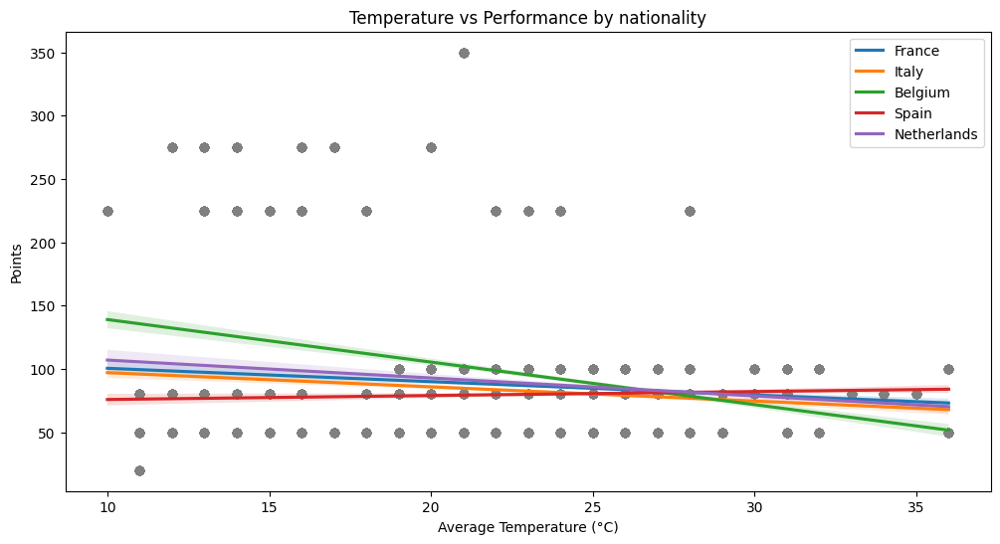

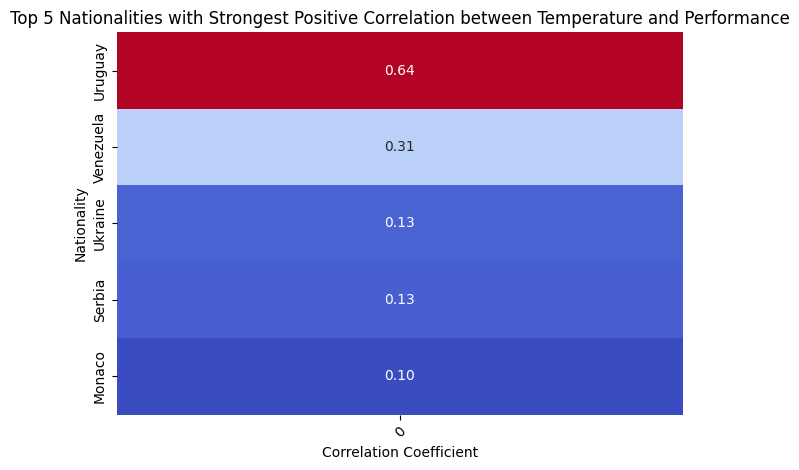

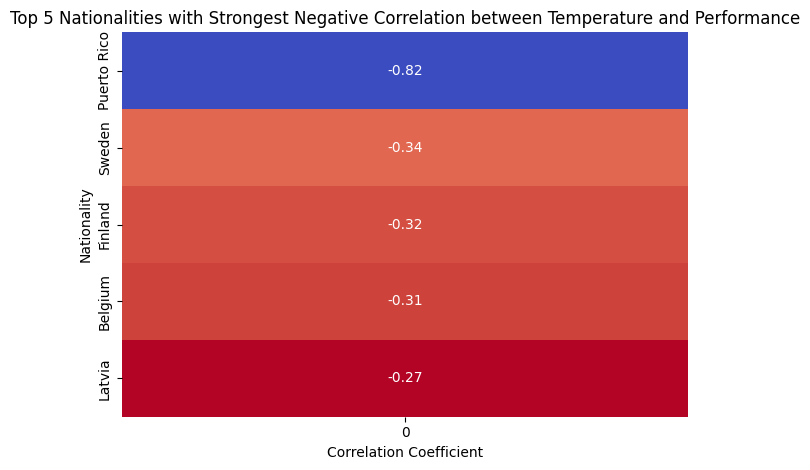

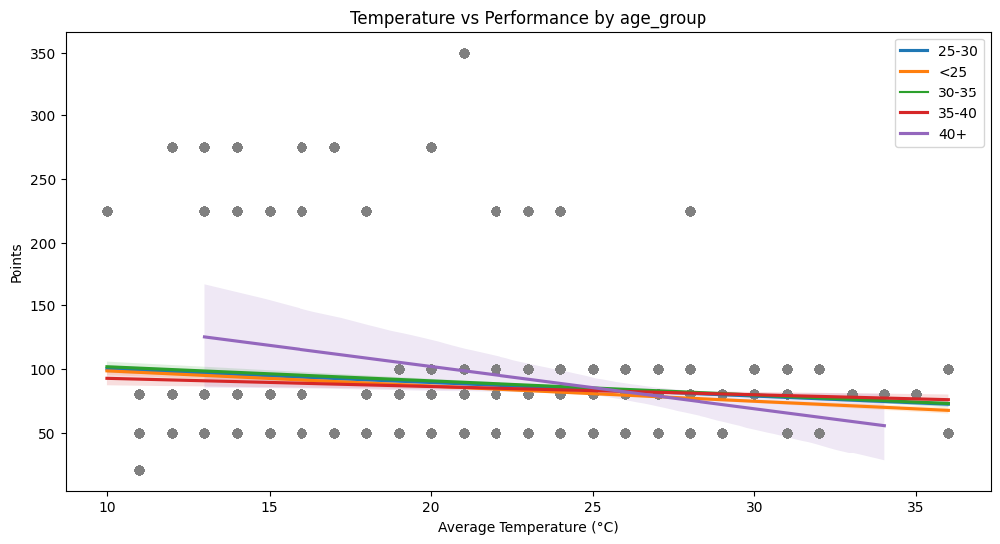


Correlations between temperature and performance for each age group:


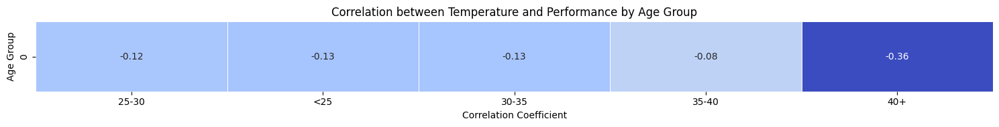

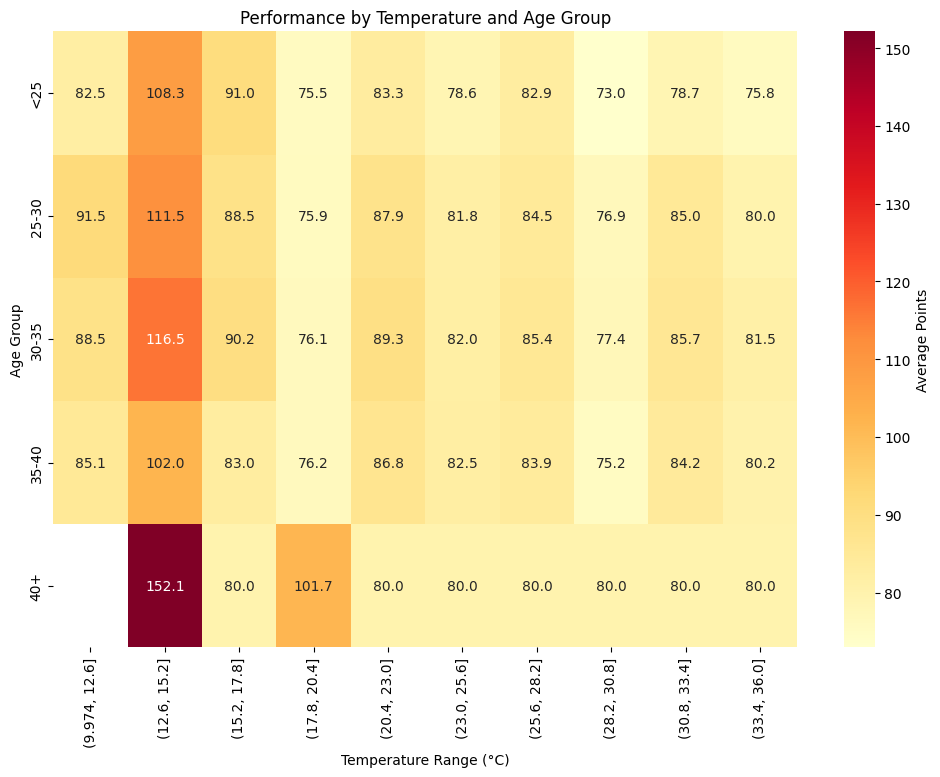

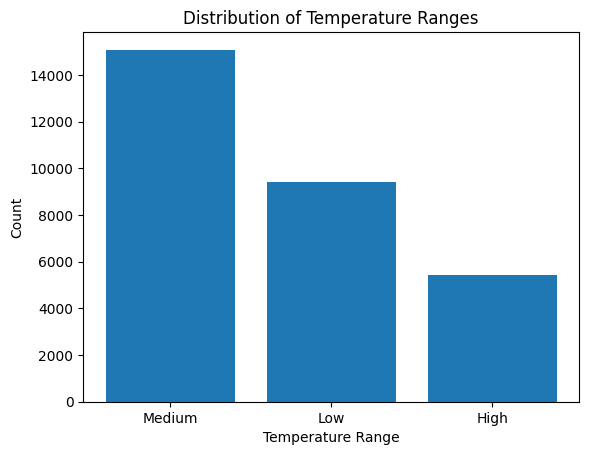


ANOVA for Low temperature range:
F-statistic: 2.83
p-value: 0.0234

ANOVA for High temperature range:
F-statistic: 6.18
p-value: 0.0001

ANOVA for Medium temperature range:
F-statistic: 8.01
p-value: 0.0000


In [64]:
def plot_temp_performance(data, group_column, n_top=5):
    plt.figure(figsize=(12, 6))
    
    # Get top n groups by number of races
    top_groups = data[group_column].value_counts().nlargest(n_top).index
    
    for group in top_groups:
        group_data = data[data[group_column] == group]
        sns.regplot(x='average_temperature', y='points', data=group_data, 
                    scatter=False, label=group)
    
    plt.scatter(data['average_temperature'], data['points'], alpha=0.1, color='gray')
    plt.title(f'Temperature vs Performance by {group_column}')
    plt.xlabel('Average Temperature (°C)')
    plt.ylabel('Points')
    plt.legend()
    plt.show()

# Function to calculate correlation for each group
def calc_group_correlations(data, group_column):
    correlations = {}
    for group in data[group_column].unique():
        group_data = data[data[group_column] == group]
        if len(group_data) > 1:  # Ensure we have enough data points
            if group_data['average_temperature'].nunique() > 1 and group_data['average_temperature'].std() > 0 and group_data['points'].std() > 0:  # Ensure temperature varies
                corr, _ = stats.pearsonr(group_data['average_temperature'], group_data['points'])
                correlations[group] = corr
    return pd.Series(correlations)

temp = merged_df.dropna(subset=['average_temperature', 'points']).copy()

# Analyze temperature effects for nationalities
plot_temp_performance(temp, 'nationality')
nationality_correlations = calc_group_correlations(temp, 'nationality')

heatmap_data = nationality_correlations.nlargest(5).to_frame()


heatmap = sns.heatmap(heatmap_data, annot=True, cmap='coolwarm', fmt=".2f", cbar=False)
heatmap.set_title('Top 5 Nationalities with Strongest Positive Correlation between Temperature and Performance')
heatmap.set_xlabel('Correlation Coefficient')
heatmap.set_ylabel('Nationality')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()
plt.close()

heatmap = sns.heatmap(nationality_correlations.nsmallest(5).to_frame(), annot=True, cmap='coolwarm', fmt=".2f", cbar=False)
heatmap.set_title('Top 5 Nationalities with Strongest Negative Correlation between Temperature and Performance')
heatmap.set_xlabel('Correlation Coefficient')
heatmap.set_ylabel('Nationality')

plt.tight_layout()
plt.show()
plt.close()

# Analyze temperature effects for age groups
plot_temp_performance(temp, 'age_group')
age_group_correlations = calc_group_correlations(temp, 'age_group')

print("\nCorrelations between temperature and performance for each age group:")
plt.figure(figsize=(15,2))
heatmap = sns.heatmap(age_group_correlations.to_frame().T, annot=True, cmap='coolwarm', center=0, linewidths=0.5, fmt=".2f", cbar=False)
heatmap.set_title('Correlation between Temperature and Performance by Age Group')
heatmap.set_xlabel('Correlation Coefficient')
heatmap.set_ylabel('Age Group')

plt.tight_layout()
plt.show()
plt.close()

# Heatmap of performance by temperature and age group
plt.figure(figsize=(12, 8))
pivot = temp.pivot_table(values='points', index='age_group', observed=True, columns=pd.cut(temp['average_temperature'], bins=10), aggfunc='mean')
sns.heatmap(pivot, cmap='YlOrRd', annot=True, fmt='.1f', cbar_kws={'label': 'Average Points'})
plt.title('Performance by Temperature and Age Group')
plt.xlabel('Temperature Range (°C)')
plt.ylabel('Age Group')
plt.show()
plt.close()

# ANOVA test for age groups
from scipy.stats import f_oneway

def temp_performance_anova(data):
    groups = [group['points'] for _, group in data.groupby('age_group', observed=True) if len(group) > 1]
    if len(groups) > 1:  # Make sure there are enough groups
        f_statistic, p_value = f_oneway(*groups)
        return f_statistic, p_value
    else:
        return None, None

# Perform ANOVA for different temperature ranges
temp_ranges = pd.cut(temp['average_temperature'], bins=3, labels=['Low', 'Medium', 'High'])
counts = temp_ranges.value_counts()
plt.bar(counts.index, counts.values)
plt.title('Distribution of Temperature Ranges')
plt.xlabel('Temperature Range')
plt.ylabel('Count')
plt.show()
plt.close()

for temp_range in temp_ranges.unique():
    range_data = temp[temp_ranges == temp_range]
    f_stat, p_val = temp_performance_anova(range_data)
    if f_stat is not None:
        print(f"\nANOVA for {temp_range} temperature range:")
        print(f"F-statistic: {f_stat:.2f}")
        print(f"p-value: {p_val:.4f}")
    else:
        print(f"\nANOVA for {temp_range} temperature range: Not enough data")

del temp

### Observations on the First Plot

The plot shows the relationship between average temperature (in °C) and performance (measured in points) across various nationalities: France, Italy, Belgium, Spain, and the Netherlands. Here are some observations based on the plot:

- **General Trend**: The trend lines for all countries appear to have a slightly downward slope, indicating a general decrease in points as the average temperature increases. This suggests that higher temperatures may be associated with lower performance.

- **Country-Specific Trends**:
    - **Belgium (green line)**: Shows the steepest negative slope among the countries, indicating that performance may decrease more significantly with increasing temperature for Belgian athletes.
    - **France, Italy, Spain, and the Netherlands**: These countries show relatively flatter slopes compared to Belgium, suggesting a smaller impact of temperature on performance. The lines are close to each other, indicating similar trends in these countries.

- **Data Spread**: The gray dots, representing individual data points, show a wide range of performance scores at each temperature. There are several outliers with very high points, which are present across different temperature ranges.

- **Overlap Between Countries**: The lines for France, Italy, Spain, and the Netherlands are close together, indicating that the effect of temperature on performance is quite similar for these nationalities. However, Belgium stands out with a more pronounced downward trend.

Overall, while there is a general tendency for performance to decrease as temperature rises, the effect is more pronounced for some countries, such as Belgium. The variability in individual scores also suggests that factors other than temperature may significantly influence performance.


### Observations on the correlation between Temperature and Age group
The plots display the correlation coefficients between temperature and performance for different nationalities, separated into the top five with the strongest positive and negative correlations.

Observations:

1. **Top 5 Nationalities with Strongest Positive Correlation**:
    - **Uruguay (0.64)** shows the highest positive correlation, indicating that as temperatures increase, performance tends to improve significantly for athletes from Uruguay.
    - **Venezuela (0.31)** also exhibits a moderate positive correlation, suggesting a noticeable improvement in performance with increasing temperatures.
    - **Ukraine (0.13)** and **Serbia (0.13)** show weaker positive correlations, indicating a slight improvement in performance with higher temperatures, but the effect is not as strong.
    - **Monaco (0.10)** has the weakest positive correlation in this group, suggesting only a minimal impact of temperature on performance.

2. **Top 5 Nationalities with Strongest Negative Correlation**:
    - **Puerto Rico (-0.82)** shows a strong negative correlation, implying that as temperatures rise, performance tends to decrease significantly for athletes from Puerto Rico.
    - **Sweden (-0.34)** and **Finland (-0.32)** exhibit moderate negative correlations, indicating a noticeable drop in performance with increasing temperatures.
    - **Belgium (-0.31)** has a correlation similar to Sweden and Finland, aligning with the trend observed in the previous plot where Belgium showed a more pronounced decrease in performance with higher temperatures.
    - **Latvia (-0.27)** has the weakest negative correlation among this group, suggesting a less pronounced but still negative impact of temperature on performance.

**General Insights**:
- **Temperature Sensitivity**: Athletes from warmer countries (like Uruguay and Venezuela) may perform better in higher temperatures, possibly due to acclimatization or better adaptation to such conditions. In contrast, athletes from colder countries (like Sweden, Finland, and Latvia) may struggle more as temperatures rise.
- **Strong Negative Correlation for Puerto Rico**: The significant negative correlation for Puerto Rico could indicate a different factor affecting performance at higher temperatures, such as humidity or heat stress, which may be more impactful in tropical climates.

These observations suggest that the relationship between temperature and performance can vary significantly based on the nationality, likely influenced by the athletes' acclimatization and environmental factors in their home countries.

### Observations on the two correlation plots between the temperature and age group

This plot provides insights into the relationship between temperature and performance across different age groups. Here are the key observations:

- **Overall trend**: For all age groups, there's a negative correlation between temperature and performance, meaning that as temperature increases, performance tends to decrease.

- **Age group differences**:
    - The 40+ age group (purple line) shows the strongest negative correlation (-0.36), indicating this group's performance is most affected by temperature increases.
    - Other age groups (25-30, <25, 30-35, 35-40) show weaker negative correlations, ranging from -0.08 to -0.13.

- **Performance variability**:
    - There's considerable scatter in the data points, especially at lower temperatures, suggesting other factors also influence performance.
    - Some outliers are visible, particularly at higher performance levels (around 250-350 points).

- **Temperature range**:
    - The data covers a temperature range from about 10°C to 35°C.

- **Performance range**:
    - Most performance scores fall between 50 and 150 points, with some outliers reaching up to 350 points.

- **Trend lines**:
    - All age groups show a downward slope in their trend lines, confirming the negative correlation.
    - The 40+ age group's line has the steepest slope, consistent with its stronger negative correlation.

- **Confidence intervals**:
    - The shaded areas around the trend lines represent confidence intervals, which appear wider for the 40+ group, possibly due to more variability or fewer data points for this age group.

In summary, this plot demonstrates that higher temperatures generally correlate with lower performance across all age groups, with the effect being most pronounced in the 40+ age group. However, the wide scatter of data points suggests that temperature is just one of many factors influencing performance.


### Observations on the heatmap plot
This heatmap provides valuable insights into the relationship between temperature, age groups, and cycling performance. Here are some key observations:

- **Performance peak for most age groups**: The highest average points (116.5) are achieved by cyclists in the 30-35 age group at temperatures between 12.9°C and 15.2°C. This suggests that this temperature range might be optimal for peak performance across most age groups.

- **Age group performance**:
    - The 30-35 age group generally performs well across most temperature ranges.
    - The 25-30 age group also shows strong performance, particularly in cooler temperatures.
    - Younger (<25) and older (35-40) groups tend to have slightly lower average points across most temperature ranges.

- **Temperature impact**:
    - Performance tends to be higher in the cooler temperature ranges (12.9°C to 17.8°C) for most age groups.
    - There's a noticeable drop in performance for most age groups as temperatures increase beyond 20.4°C.

- **Outlier for 40+ age group**: There's an exceptionally high average points (152.1) for the 40+ age group in the 12.9°C to 15.2°C range. This could be due to a small sample size or exceptional performers in this category.

- **Consistency in extreme temperatures**: Performance seems more consistent (but generally lower) across age groups in the highest temperature range (33.4°C to 36.0°C).

- **Data limitations**: The 40+ age group has many cells with the same value (80.0), which could indicate limited data for this age group across various temperature ranges.

- **Optimal conditions**: The data suggests that cooler temperatures (between 12.9°C and 20.4°C) generally favor better performance across all age groups.

This visualization helps in understanding how both age and temperature affect cycling performance, which could be valuable for training strategies, race planning, and performance expectations under different conditions.


### Observations on ANOVA tests

The results of the ANOVA tests for different temperature ranges (Low, Medium, and High) suggest that there is a statistically significant difference in at least one group's mean performance metric across the temperature ranges. Here’s what can be observed:

1. **Low Temperature Range**
    - **F-statistic**: 2.83, **p-value**: 0.0234
    - The p-value (0.0234) is less than the common significance level of 0.05, indicating that there is a statistically significant difference in the means of the groups being compared within the low-temperature range.
    - However, the F-statistic (2.83) is relatively low compared to the other ranges, suggesting that while there is a significant effect, the differences between group means are not as pronounced as in the higher temperature ranges.

2. **High Temperature Range**
    - **F-statistic**: 6.18, **p-value**: 0.0001
    - The p-value (0.0001) is very low, much below the 0.05 threshold, indicating strong evidence of a significant difference in means across groups in the high-temperature range.
    - The higher F-statistic (6.18) suggests that the variability between the group means is greater than the variability within the groups, implying more pronounced differences in performance metrics in high-temperature conditions.

3. **Medium Temperature Range**
    - **F-statistic**: 8.01, **p-value**: 0.0000
    - The p-value (0.0000) is extremely low, indicating a highly significant difference in means across the groups in the medium-temperature range.
    - The F-statistic (8.01) is the highest among the three temperature ranges, suggesting that the differences between group means are the most pronounced in the medium-temperature range.

### Summary of Observations:
- All three temperature ranges show statistically significant differences in the performance metric being studied, as all p-values are below 0.05. This implies that temperature likely has an effect on the metric, which could be points, race results, or another performance-related measure.
- The impact is most pronounced in the medium and high temperature ranges, as indicated by the higher F-statistics and lower p-values. This suggests that performance varies more significantly when temperatures are in the medium to high range compared to low temperatures.
- The low temperature range still shows a significant effect, but the lower F-statistic indicates that the differences are less substantial compared to the other ranges.
- These results imply that temperature plays a role in performance, with greater effects observed as temperatures increase. Further investigation (e.g., post hoc tests) could identify which specific groups differ from each other within each temperature range.


### Analysis of Cyclist Career Progression

In this section, we analyze the career progression of cyclists by examining their peak performance years, ages, and points. The data includes the following variables:

- **name**: The name of the cyclist.
- **peak_year**: The year in which the cyclist achieved their peak performance.
- **peak_age**: The age of the cyclist during their peak performance year.
- **peak_points**: The points scored by the cyclist during their peak performance year.

#### Key Observations:

- **Peak Performance Age**: The ages at which cyclists reach their peak performance vary significantly. Some cyclists achieve their peak performance in their early 20s, while others reach their peak in their late 30s.
- **Peak Performance Points**: The points scored during peak performance years also vary widely, indicating differences in the level of competition and individual capabilities.
- **Career Longevity**: Cyclists with longer careers tend to have multiple peak performance years, suggesting sustained high performance over time.

#### Example Cyclists:

- **Matteo Tosatto**: Achieved peak performance at age 37 in 2011 with 107.12 points.
- **Alejandro Valverde**: Achieved peak performance at age 34 in 2014 with 107.14 points.
- **Luis León Sánchez**: Achieved peak performance at age 21 in 2004 with 102.50 points.
- **Philippe Gilbert**: Achieved peak performance at age 29 in 2011 with 133.55 points.
- **Maxime Monfort**: Achieved peak performance at age 21 in 2004 with 250.00 points.

These observations highlight the diverse career trajectories of professional cyclists and the various factors that contribute to their peak performance.


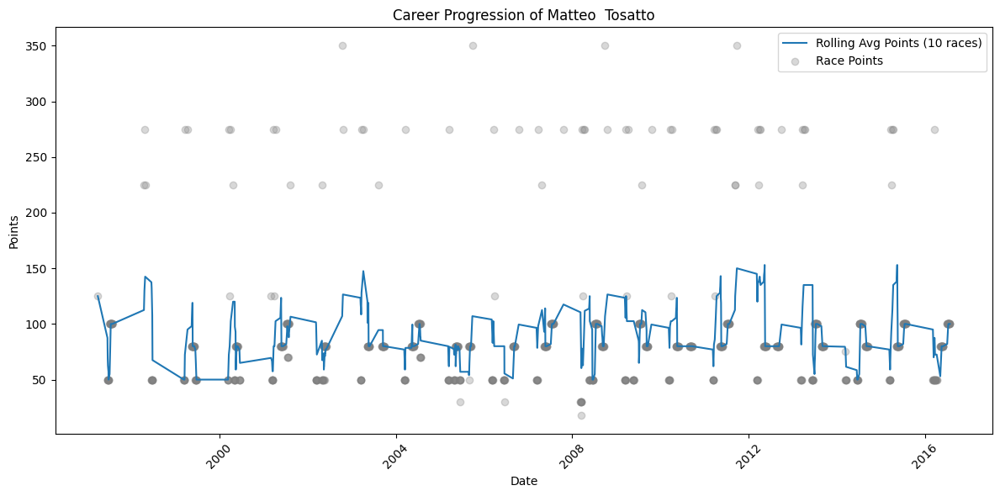

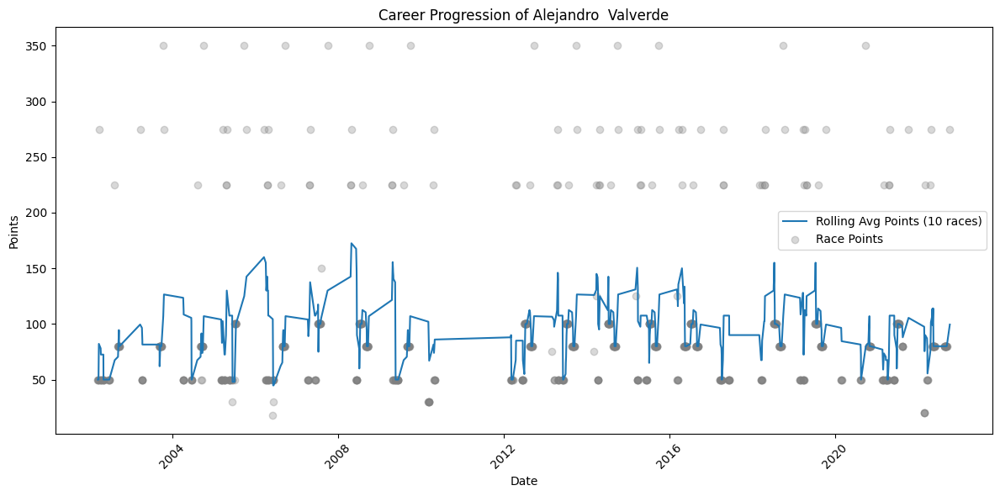

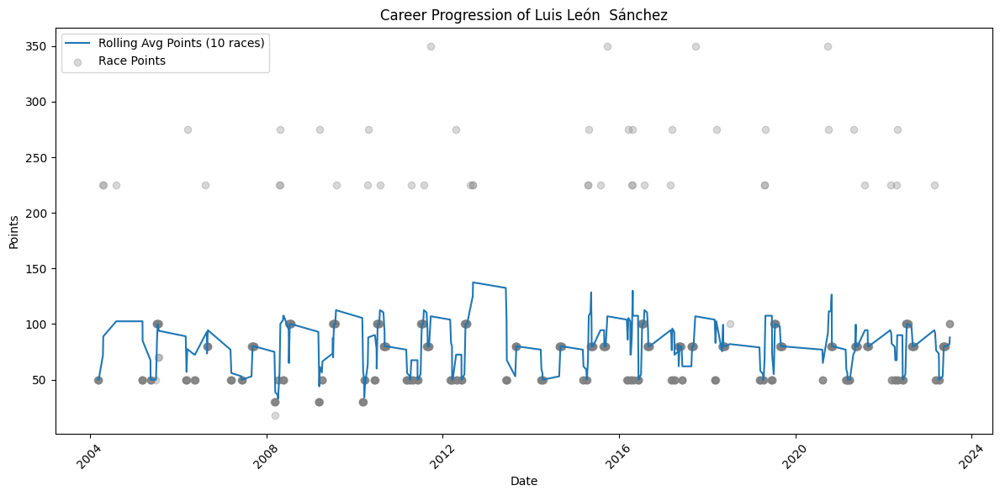

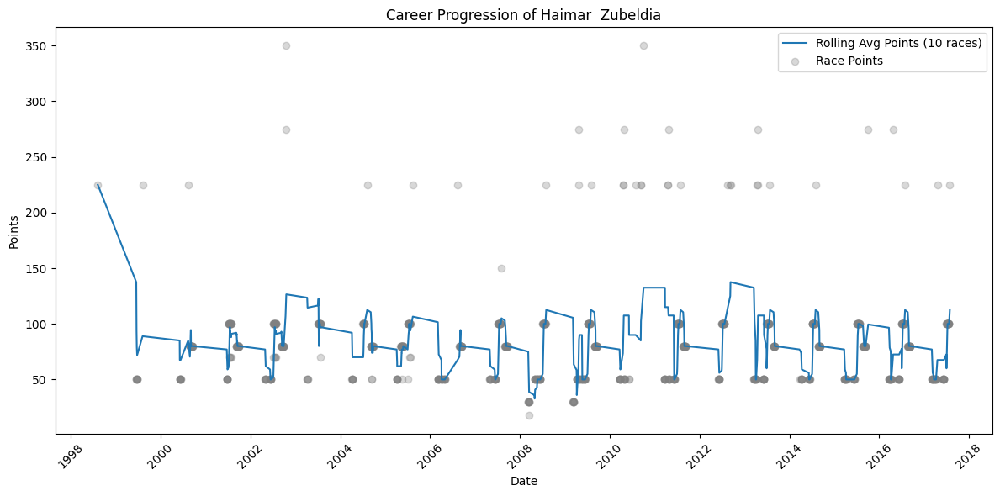

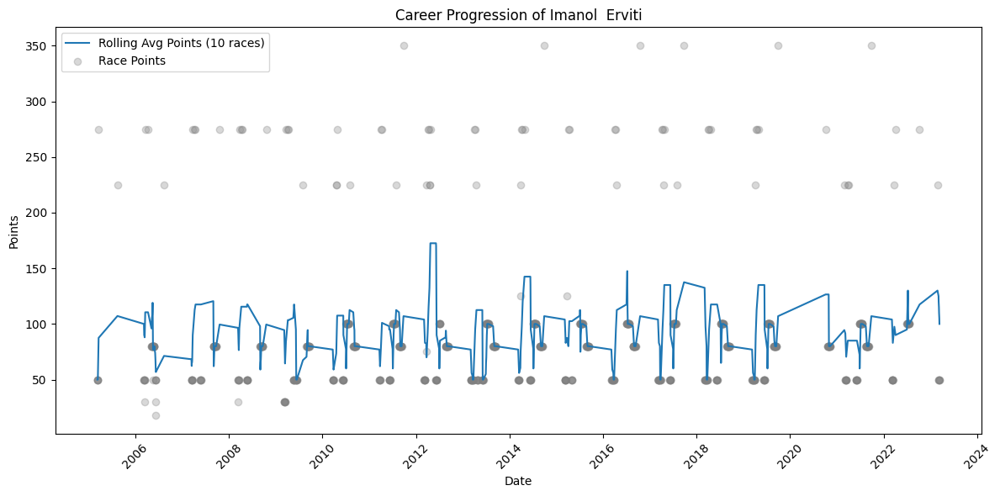

In [99]:
# Convert date to datetime and handle potential missing data
career_progression = merged_df.dropna(subset=['date', 'birth_year']).copy()
career_progression['date'] = pd.to_datetime(career_progression['date'])

# Extract year and calculate age at each race
career_progression['year'] = career_progression['date'].dt.year

# Function to analyze career progression for a cyclist
def analyze_cyclist_progression(cyclist_name, data, min_races=10, plot=True):
    cyclist_data = data[data['cyclist'] == cyclist_name].sort_values('date')
    
    if len(cyclist_data) < min_races:
        #print(f"{cyclist_name} has fewer than {min_races} races. Skipping.")
        return None
    
    # Calculate a rolling average of points
    cyclist_data['rolling_avg_points'] = cyclist_data['points'].rolling(window=10, min_periods=1).mean()
    if plot:
        # Plot the first
        # Plot career progression
        plt.figure(figsize=(12, 6))
        plt.plot(cyclist_data['date'], cyclist_data['rolling_avg_points'], label='Rolling Avg Points (10 races)')
        plt.scatter(cyclist_data['date'], cyclist_data['points'], alpha=0.3, color='gray', label='Race Points')
        plt.title(f'Career Progression of {cyclist_data['name_x'].iloc[0]}')
        plt.xlabel('Date')
        plt.ylabel('Points')
        plt.legend()
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()
        plt.close()
        
    # Correlation between age and performance
    nona_data = cyclist_data.dropna(subset=['cyclist_age', 'points'])
    if nona_data['cyclist_age'].nunique() > 1 and nona_data['points'].std() > 0 \
        and nona_data['cyclist_age'].std() > 0:
        correlation, p_value = stats.pearsonr(nona_data['cyclist_age'], nona_data['points'])
    else:
        correlation, p_value = None, None
    return {
        'name': cyclist_data['name_x'].iloc[0],
        'cyclist': cyclist_name,
        'num_races': len(cyclist_data),
        'career_span': (cyclist_data['date'].max() - cyclist_data['date'].min()).days / 365,
        'avg_points': cyclist_data['points'].mean(),
        'max_points': cyclist_data['points'].max(),
        'age_performance_correlation': correlation,
        'p_value': p_value
    }

# Analyze progression for top cyclists
top_cyclists = career_progression['cyclist'].value_counts().nlargest(30).index
progression_data = [analyze_cyclist_progression(cyclist, career_progression, plot=ind < 5) for ind,cyclist in enumerate(top_cyclists)]


### Observations on the First Plot

This plot illustrates the career progression of Matteo Tosatto, likely a professional cyclist, over a span of about 20 years (from approximately 1996 to 2016). Here are the key observations:

- **Career Longevity**: Tosatto had a remarkably long career, spanning two decades, which is quite impressive for a professional athlete.

- **Performance Metrics**:
    - **Race Points**: Represented by grey dots, showing individual race performances.
    - **Rolling Average Points**: The blue line represents a 10-race rolling average of points.

- **Consistency**: The rolling average line generally stays between 50 and 150 points throughout his career, indicating a relatively consistent performance level over time.

- **Peak Performances**:
    - There are several instances where Tosatto scored around 275-350 points in individual races, representing his best performances.
    - These peak performances are scattered throughout his career, showing he maintained the ability to achieve high results over many years.

- **Variability**: There's considerable variation in individual race points, ranging from very low (near 0) to very high (350+), which is typical in cycling where roles and race types can vary greatly.

- **Career Phases**:
    - **Early Career (late 1990s to early 2000s)**: Shows some volatility with both high peaks and low troughs.
    - **Mid-Career (mid-2000s to early 2010s)**: Appears to have more consistent performances with regular high-scoring races.
    - **Late Career (2010s onwards)**: Still shows ability to score high points, but with perhaps slightly less frequency.

- **No Clear Decline**: Unlike many athletes, there's no obvious decline in performance towards the end of his career. He still achieves high point races in his final years.

- **Frequency of Races**: The density of data points suggests he participated in numerous races each year, typical for a professional cyclist.

- **Seasonal Patterns**: There seem to be some gaps in the data, possibly representing off-seasons or periods of non-competition.

In summary, this plot depicts Matteo Tosatto as a remarkably consistent and long-lasting professional cyclist, able to achieve high performances throughout a 20-year career, with no dramatic decline in his later years.


### Observations on the Second Plot

This plot illustrates the career progression of Alejandro Valverde, likely a professional cyclist, over approximately two decades (from around 2002 to 2022). Here are the key observations:

- **Career Longevity**: Valverde has had a remarkably long career spanning about 20 years, which is impressive for a professional athlete.

- **Performance Metrics**:
    - **Race Points**: Represented by grey dots, showing individual race performances.
    - **Rolling Average Points**: The blue line represents a 10-race rolling average of points.

- **Consistency**: The rolling average line generally fluctuates between 50 and 150 points throughout his career, indicating a relatively consistent performance level over time.

- **Peak Performances**:
    - There are several instances where Valverde scored 350 points in individual races, representing his best performances.
    - These peak performances are distributed throughout his career, showing he maintained the ability to achieve top results over many years.

- **Variability**: There's considerable variation in individual race points, ranging from very low (near 0) to very high (350), which is typical in cycling where roles and race types can vary greatly.

- **Career Phases**:
    - **Early Career (early to mid-2000s)**: Shows some volatility with both high peaks and low troughs.
    - **Mid-Career (late 2000s to mid-2010s)**: Appears to have more consistent high-level performances.
    - **Late Career (late 2010s onwards)**: Still shows ability to score high points, maintaining a similar level of performance.

- **No Clear Decline**: Unlike many athletes, there's no obvious decline in performance towards the end of his career. He continues to achieve high point races in his later years.

- **Frequency of Races**: The density of data points suggests he participated in numerous races each year, typical for a professional cyclist.

- **Seasonal Patterns**: There are some gaps in the data, likely representing off-seasons or periods of non-competition.

- **Comparison to Tosatto**: Valverde's career shows similarities to Tosatto's in terms of longevity and consistency, but Valverde seems to have achieved more frequent high-scoring performances throughout his career.

In summary, this plot depicts Alejandro Valverde as an exceptionally consistent and long-lasting professional cyclist, able to achieve high performances throughout a 20-year career, with no significant decline in his later years. His ability to maintain peak performances over such an extended period is particularly noteworthy.

### Observations on the Third Plot

This plot illustrates the career progression of Luis León Sánchez, likely a professional cyclist, spanning approximately 20 years (from around 2004 to 2024). Here are the key observations:

- **Career Longevity**: Sánchez has had a remarkably long career of about two decades, which is impressive for a professional athlete.

- **Performance Metrics**:
    - **Race Points**: Represented by grey dots, showing individual race performances.
    - **Rolling Average Points**: The blue line represents a 10-race rolling average of points.

- **Consistency**: The rolling average line generally fluctuates between 50 and 150 points throughout his career, indicating a relatively stable performance level over time.

- **Peak Performances**:
    - There are several instances where Sánchez scored around 350 points in individual races, representing his best performances.
    - These peak performances are scattered throughout his career, showing he maintained the ability to achieve top results over many years.

- **Variability**: There's considerable variation in individual race points, ranging from very low (near 0) to very high (350), which is typical in cycling where roles and race types can vary greatly.

- **Career Phases**:
    - **Early Career (mid-2000s)**: Shows some volatility with both high peaks and low troughs.
    - **Mid-Career (late 2000s to mid-2010s)**: Appears to have more consistent performances with regular high-scoring races.
    - **Late Career (late 2010s onwards)**: Still shows ability to score high points, maintaining a similar level of performance.

- **No Clear Decline**: Unlike many athletes, there's no obvious decline in performance towards the end of his career. He continues to achieve high point races in his later years.

- **Frequency of Races**: The density of data points suggests he participated in numerous races each year, typical for a professional cyclist.

- **Seasonal Patterns**: There are some gaps in the data, likely representing off-seasons or periods of non-competition.

- **Comparison to Others**: Sánchez's career progression shows similarities to those of Tosatto and Valverde in terms of longevity and consistency. However, his rolling average seems slightly lower and more stable compared to Valverde's, with fewer dramatic peaks.

- **Recent Performance**: The plot suggests Sánchez is still actively competing as of 2024, maintaining a competitive level of performance even in the later stages of his career.

In summary, this plot depicts Luis León Sánchez as a highly consistent and long-lasting professional cyclist, able to achieve high performances throughout a 20-year career, with no significant decline in his later years. His ability to maintain a stable level of performance over such an extended period is particularly noteworthy.

### Observations on the Fourth Plot

This chart represents the career progression of Imanol Erviti, focusing on his race points and rolling average points over time. Here are some key observations:

- **Rolling Average Points**:
    - The blue line shows the rolling average points (10 races) over time. It fluctuates between approximately 50 and 150 points.
    - There are noticeable peaks around 2012, 2014, and 2018, suggesting stronger performances during these periods.
    - The trend seems somewhat consistent, with occasional dips and rebounds throughout his career.

- **Race Points**:
    - The gray dots indicate individual race points. These vary widely, with some races scoring below 50 points, while others exceed 300.
    - Higher outliers (above 200 points) occur at regular intervals, indicating standout performances in certain races.

- **Periodicity**:
    - The rolling average has minor ups and downs, likely indicating cycles of performance, possibly reflecting the nature of his racing seasons or form during particular years.

- **Longevity**:
    - The chart covers his career from around 2005 to 2024, showing that Erviti has maintained a relatively consistent performance over this long period without any drastic long-term decline.

In summary, Erviti's career seems marked by consistent performance with occasional standout races, with no obvious periods of steep decline or improvement.

### Observations on the Fifth Plot

This chart shows the career progression of Haimar Zubeldia, focusing on race points and a rolling average of points across 10 races. Here are the key observations:

- **Rolling Average Points**:
    - The blue line for Zubeldia’s rolling average points starts high in the late 1990s (around 200 points) but quickly declines in the early 2000s.
    - The rest of the career (from 2000 to 2018) shows a relatively consistent trend, with rolling averages fluctuating between 50 and 100 points.
    - The rolling average briefly peaks around 2010 and 2012, suggesting slightly better performance during these periods, but overall, the values remain modest compared to the early stages of his career.

- **Race Points**:
    - Similar to Erviti, the gray dots representing race points show a few outliers. Zubeldia has individual race points reaching well over 200 points, though these are quite infrequent.
    - Most of the race points stay within the 50–100 point range, indicating moderate but consistent performances over a long period.
    - There are several races in the early 2000s where Zubeldia's points were higher, suggesting some early success or strong races in that period.

- **Performance Pattern**:
    - Zubeldia's career shows a decline after a strong start, with the rolling average stabilizing around 50–100 points later in his career.
    - The sporadic high-point performances suggest he had some standout races, but these became rarer as his career progressed.

- **Longevity**:
    - The career spans from the late 1990s to 2018, showing consistent participation in races across two decades.
    - Despite fewer standout performances later in his career, Zubeldia maintained a steady level of competitive results, especially during the 2000s and early 2010s.

In summary, Zubeldia's career shows early promise with higher points, but his performance stabilizes in later years at a moderate level, with occasional spikes of stronger race results.

In [96]:
progression_data = [data for data in progression_data if data is not None]

progression_df = pd.DataFrame(progression_data)

# Print summary statistics
print("\nCareer Progression Data:")
print(progression_df)






Career Progression Data:
                    name              cyclist  num_races  career_span  \
0        Matteo  Tosatto       matteo-tosatto        959    19.331507   
1    Alejandro  Valverde   alejandro-valverde        942    20.583562   
2     Luis León  Sánchez    luis-leon-sanchez        899    19.336986   
3       Haimar  Zubeldia      haimar-zubeldia        883    18.983562   
4         Imanol  Erviti        imanol-erviti        883    18.016438   
5      Philippe  Gilbert     philippe-gilbert        836    19.139726   
6     Joaquim  Rodríguez    joaquim-rodriguez        796    15.397260   
7       Vincenzo  Nibali      vincenzo-nibali        796    17.523288   
8      Sylvain  Chavanel     sylvain-chavanel        790    17.394521   
9        Maxime  Monfort       maxime-monfort        775    15.410959   
10       Rigoberto  Urán       rigoberto-uran        753    16.254795   
11        Nicolas  Roche        nicolas-roche        746    16.104110   
12   Juan Manuel  Garate 

### Observations on Career Progression Table

1. **Long Careers with High Participation**:
    - Cyclists like Alejandro Valverde and Matteo Tosatto have long career spans (around 20 years) and have participated in a very high number of races (942 and 959 races, respectively). This suggests that these cyclists have maintained a high level of performance and endurance over two decades.
    - Other cyclists, such as Luis León Sánchez and Haimar Zubeldia, also have similarly long career spans and high participation, indicating consistency and longevity in the sport.

2. **Races per Year**:
    - The `avg_races_per_year` column indicates how active each cyclist has been on average per year. Most cyclists average between 40 to 50 races per year, with some, like Sylvain Chavanel, participating in around 45 races per year, showing a high level of activity.
    - Cyclists with a higher average number of races per year may indicate a higher workload or endurance, while those with fewer races per year could suggest a more selective race calendar or injuries that impacted race participation.

3. **Win Percentage**:
    - The `win_percentage` metric varies significantly among cyclists, with some having relatively higher win rates, while others show much lower values. This reflects the roles cyclists play in races, where some are more oriented towards supporting their team (domestiques), while others are more focused on winning (sprinters or general classification contenders).
    - For example, cyclists like Philippe Gilbert and Alejandro Valverde, known for being contenders in various races, likely have higher win percentages compared to support riders.

4. **Career Efficiency**:
    - The `wins_per_race` column represents how efficient cyclists are in terms of converting race participation into wins. Higher values indicate cyclists who are more likely to win when they race. For example, if a cyclist has a high win percentage but participates in fewer races, they are likely focusing on races where they can perform well.
    - Joaquim Rodríguez and Alejandro Valverde may be more efficient with higher `wins_per_race` values, suggesting a focus on quality over quantity.

5. **Outliers and Interesting Trends**:
    - **Career Span Outliers**: Some cyclists have longer career spans but relatively fewer races, indicating a potentially less intense racing schedule or time spent as a professional without high race participation.
    - **Extreme Win Rates**: Cyclists with very high or very low `win_percentage` values could indicate specialized roles within their teams (e.g., team leaders versus domestiques).

6. **Correlation Between Career Span and Number of Races**:
    - Generally, a longer `career_span` is associated with a higher number of races, but some cyclists achieve a similar number of races in a shorter career span. This indicates a high level of activity in a condensed time frame (e.g., Rigoberto Urán with 16 years and 753 races).

7. **Impact of Cycling Role**:
    - The data could suggest differences in career patterns based on a cyclist's role (sprinter, climber, domestique, or all-rounder), where domestiques might have more races but lower win percentages, while sprinters and general classification riders could have fewer races but higher win percentages.

Overall, these observations highlight differences in career longevity, participation rates, winning efficiency, and potentially the roles played by different cyclists.


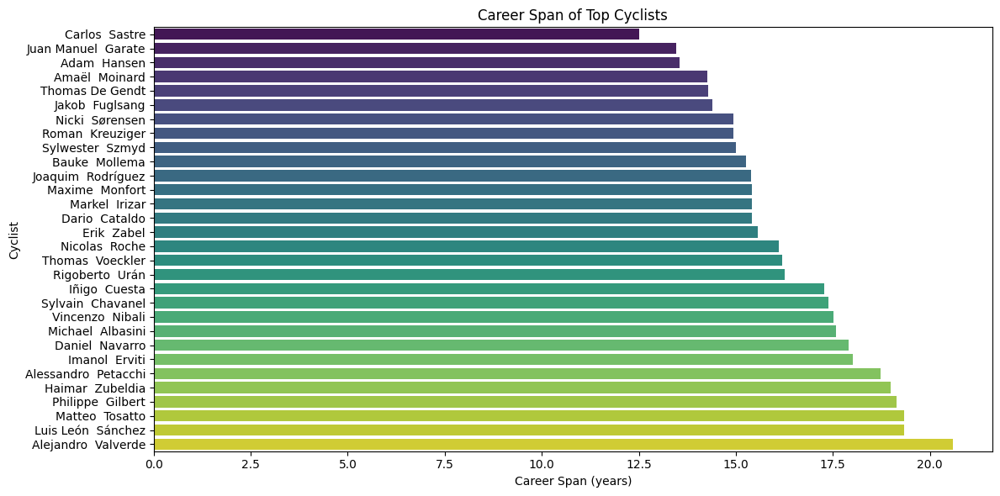

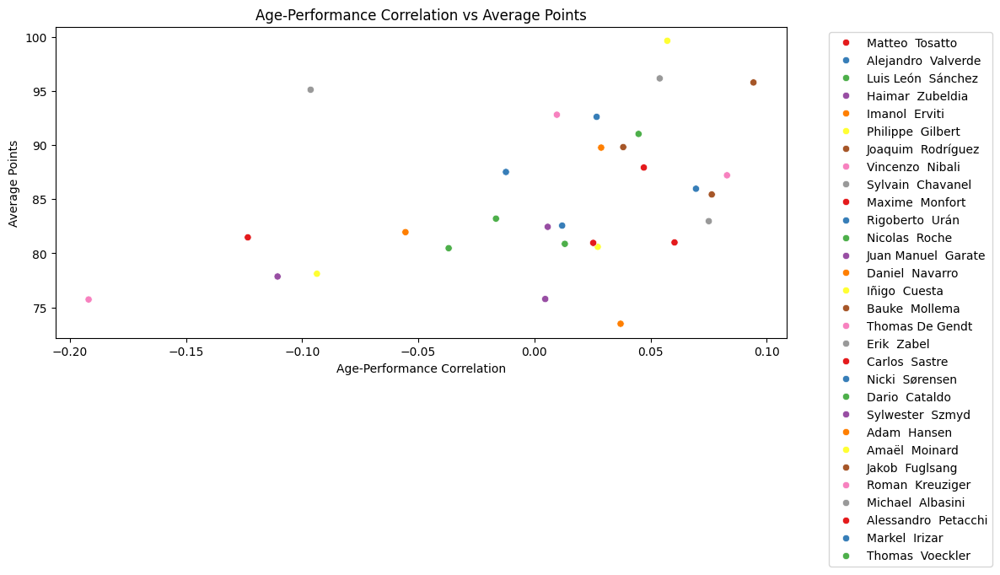

In [75]:
# Visualize career spans with a sorted barplot
plt.figure(figsize=(12, 6))
sns.barplot(
    x='career_span', 
    y='name', 
    data=progression_df.sort_values('career_span'), 
    hue='name', 
    dodge=False,  # This avoids separating bars by hue
    palette='viridis', 
    legend=False
)
plt.title('Career Span of Top Cyclists')
plt.xlabel('Career Span (years)')
plt.ylabel('Cyclist')
plt.tight_layout()
plt.show()
plt.close()


# Visualize age-performance correlation
plt.figure(figsize=(12, 6))
sns.scatterplot(x='age_performance_correlation', y='avg_points', data=progression_df, hue='name', palette='Set1')
plt.title('Age-Performance Correlation vs Average Points')
plt.xlabel('Age-Performance Correlation')
plt.ylabel('Average Points')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()
plt.close()


### Observations on Career Span of Top Cyclists Bar Plot


The plot shows the career spans of top cyclists, represented by the length of each bar. Here are some observations:

- **Longest Careers**: The cyclists with the longest careers are:
    - Juan Manuel Garate
    - Carlos Sastre
    - Adam Hansen
    - Amaël Moinard

- **Shortest Careers**: The cyclists with the shortest careers are:
    - Luis León Sánchez
    - Matteo Tosatto
    - Philippe Gilbert

- **Clustering**: There are two distinct clusters of cyclists: one with career spans between 15 and 20 years, and another with career spans between 10 and 15 years.

- **Distribution**: The distribution of career spans is skewed to the right, meaning there are a few cyclists with very long careers, but most cyclists have careers between 10 and 15 years.

Overall, the plot suggests that while there are a few cyclists with exceptionally long careers, the majority of top cyclists have careers that span between 10 and 15 years. This may be due to a combination of factors, such as the physical demands of cycling, the competitive nature of the sport, and the desire for new challenges.

### Observations on Age-Performance Correlation vs Average Points Scatter Plot

Based on this plot, we can make several observations:

- **Distribution**: The data points are scattered across the plot, showing a wide range of age-performance correlations and average points for different cyclists.
- **Age-Performance Correlation Range**: The x-axis shows age-performance correlations ranging from about -0.20 to 0.10. This suggests that some cyclists perform better as they age (positive correlation), while others show declining performance with age (negative correlation).
- **Average Points Range**: The y-axis displays average points, roughly ranging from 75 to 100. This indicates significant variation in performance among the cyclists.
- **No Strong Overall Trend**: There doesn't appear to be a clear linear relationship between age-performance correlation and average points across all cyclists. The plot doesn't show a strong upward or downward trend.

**Outliers**:
- Philippe Gilbert stands out with the highest average points (close to 100) and a slightly positive age-performance correlation.
- Sylvain Chavanel has a very high average points score (around 95) despite having one of the most negative age-performance correlations.
- Vincenzo Nibali has the most negative age-performance correlation but maintains a relatively high average points score.

- **Cluster**: There's a cluster of cyclists with age-performance correlations between -0.05 and 0.05 and average points between 80 and 90, suggesting this might be a common range for professional cyclists.
- **Performance Variability**: Some cyclists with similar age-performance correlations have very different average points, indicating that factors other than age significantly influence performance.
- **Age Impact**: The spread of correlations suggests that age affects cyclists' performances differently, possibly due to individual factors like training regimens, specialties, or career trajectories.

These observations provide insights into the relationship between age, performance trends, and overall achievement in professional cycling, highlighting the complexity and individuality of athletic careers in this sport.


In [76]:
# Function to analyze performance peaks
def analyze_performance_peaks(cyclist_name, data, min_races=10):
    cyclist_data = data[data['cyclist'] == cyclist_name].sort_values('date')
    
    if len(cyclist_data) < min_races:
        # print(f"{cyclist_name} has fewer than {min_races} races. Skipping.")
        return None
    
    # Find peak performance year
    peak_year = cyclist_data.groupby('year')['points'].mean().idxmax()
    peak_age = peak_year - cyclist_data['birth_year'].iloc[0]
    
    return {
        'name': cyclist_data['name_x'].iloc[0],
        'cyclist': cyclist_name,
        'peak_year': peak_year,
        'peak_age': peak_age,
        'peak_points': cyclist_data[cyclist_data['year'] == peak_year]['points'].mean()
    }

# Analyze peaks for top cyclists

peak_data = [analyze_performance_peaks(cyclist, career_progression) for cyclist in top_cyclists]

peak_df = pd.DataFrame(peak_data)

# Print peak performance data
print("\nPeak Performance Data:")
print(peak_df)




Peak Performance Data:
                    name              cyclist  peak_year  peak_age  \
0        Matteo  Tosatto       matteo-tosatto       2011      37.0   
1    Alejandro  Valverde   alejandro-valverde       2014      34.0   
2     Luis León  Sánchez    luis-leon-sanchez       2004      21.0   
3       Haimar  Zubeldia      haimar-zubeldia       1998      21.0   
4         Imanol  Erviti        imanol-erviti       2005      22.0   
5      Philippe  Gilbert     philippe-gilbert       2011      29.0   
6     Joaquim  Rodríguez    joaquim-rodriguez       2014      35.0   
7       Vincenzo  Nibali      vincenzo-nibali       2012      28.0   
8      Sylvain  Chavanel     sylvain-chavanel       2012      33.0   
9        Maxime  Monfort       maxime-monfort       2004      21.0   
10       Rigoberto  Urán       rigoberto-uran       2020      33.0   
11        Nicolas  Roche        nicolas-roche       2008      24.0   
12   Juan Manuel  Garate   juan-manuel-garate       2005      29.0


### Observations on Peak Performance Table

Based on the "Peak Performance Data" table, which provides information about cyclists' peak years, peak ages, and peak points, several observations can be made about when cyclists achieve their peak performances and the range of peak performance values:

1. **Peak Age Distribution**
    - Cyclists tend to reach their peak performance at various ages, with many achieving their peak between their late 20s and mid-30s.
    - **Common Peak Ages**: Many cyclists have their peak performance around age 28 to 34, suggesting that this age range may be the prime period for a cyclist's career in terms of physical capability and race experience.
    - There are some outliers, such as Michael Albasini, who peaked at age 40, indicating that peak performance can sometimes occur later in a cyclist's career, potentially due to experience, endurance, or team support.

2. **Young Peak Performers**
    - Some cyclists reached their peak performance at a much younger age, around 21-23, such as Luis León Sánchez and Haimar Zubeldia, indicating early success in their careers.
    - These early peaks could suggest that these cyclists started competing professionally at a young age and had early breakthroughs. However, reaching a peak early does not necessarily mean maintaining top performance throughout the entire career.

3. **Older Peak Performers**
    - Cyclists like Michael Albasini (age 40) and Bauke Mollema (age 34) reached their peak performance later in their careers, indicating that some athletes can sustain or even improve their performance well into their 30s and 40s.
    - This could suggest different career strategies or training methods, possibly focusing on endurance and consistency rather than early explosive performance.

4. **Peak Points Variation**
    - The peak_points values vary significantly across the cyclists, with some reaching high values (e.g., Nicki Sørensen with 350 and Bauke Mollema with 275). This suggests substantial variation in the levels of dominance or success during peak years.
    - Cyclists with higher peak points likely had a few standout seasons where they performed exceptionally well, perhaps winning prestigious races or accumulating points in important competitions.

5. **Timing of Peak Year**
    - The peak_year shows that some cyclists achieved their peak in the earlier part of their careers, while others peaked closer to the end. This could imply different career trajectories, where some cyclists build up to a peak later in life, while others have early bursts of success.
    - For example, Carlos Sastre peaked at age 34 in 2009, while Luis León Sánchez peaked at age 21 in 2004, showing different paths to reaching the top.

6. **Consistency in High Performers**
    - Cyclists like Alejandro Valverde and Philippe Gilbert, who are known for their long, successful careers, show that their peak years came later, around ages 34 and 29, respectively. This suggests that cyclists with extended peak periods may have better training, recovery, and experience management, allowing them to stay at a high level for longer.
    - The presence of cyclists reaching peaks at various points in their careers indicates that peak performance in cycling can be influenced by a combination of physical development, tactical maturity, and racing opportunities.

7. **Early vs. Late Career Peaks**
    - Cyclists who peak early may face challenges in maintaining top performance as they age, while those who peak later could benefit from accumulated experience and strategic race selection.
    - The varying ages at peak suggest that while physical capabilities may decline with age, factors such as experience, race craft, and support from a strong team can help maintain or even enhance performance in later years.

**Summary**:
The table highlights the diverse career trajectories of professional cyclists, with peak performance occurring at different ages, from early 20s to late 30s or even 40. The distribution of peak ages suggests a general trend toward peak performance in the late 20s to mid-30s, while the variation in peak points reflects different levels of success and dominance during peak years. Some cyclists achieve early peaks, while others continue to improve or maintain a high level of performance throughout a long career.

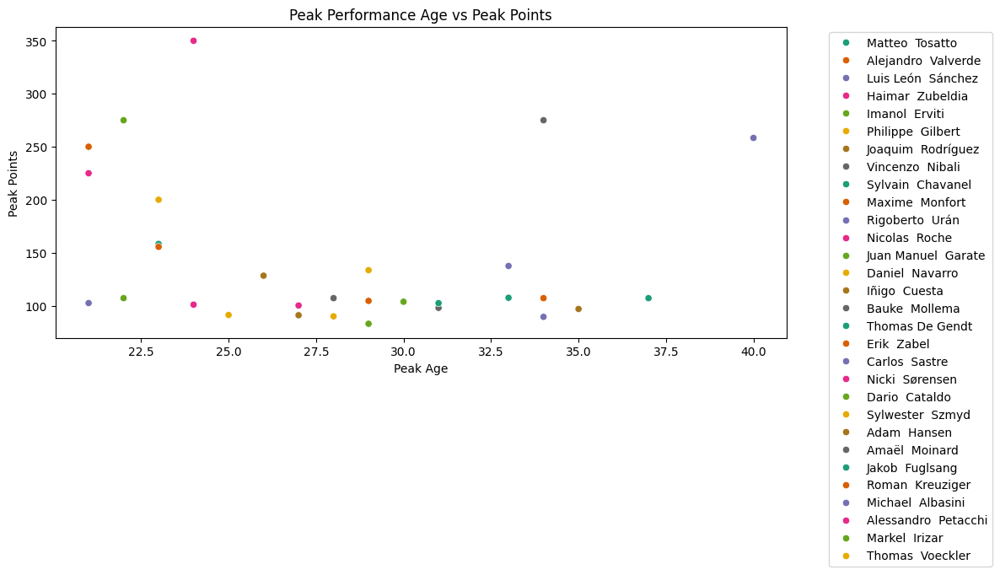

In [77]:
# Visualize peak ages with annotations
plt.figure(figsize=(12, 6))
sns.scatterplot(x='peak_age', y='peak_points', data=peak_df, hue='name', palette='Dark2')
plt.title('Peak Performance Age vs Peak Points')
plt.xlabel('Peak Age')
plt.ylabel('Peak Points')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()
plt.close()

del peak_df 
del progression_df


### Observations on Peak Performance Age vs Peak Points Scatter Plot

This plot provides interesting insights into the relationship between peak performance age and peak points for various cyclists. Here are some key observations:

- **Age Range**: The peak performance ages range from about 21 to 40 years old, suggesting a wide window for potential peak performance in cycling.
- **Points Range**: Peak points vary greatly, from around 100 to over 350, indicating significant differences in maximum performance levels among cyclists.
- **No Strong Correlation**: There doesn't appear to be a strong overall correlation between peak age and peak points. High peak points are achieved across various ages.

**Outliers**:
- One cyclist (likely Haimar Zubeldia, based on the pink dot) stands out with exceptionally high peak points (around 350) at a relatively young age (about 25).
- Vincenzo Nibali (grey dot) shows a very high peak points score (about 275) at a later age (around 33-34).

- **Clustering**: There's a cluster of data points between ages 25-35 and peak points 100-150, suggesting this might be a common range for many professional cyclists.
- **Late Bloomers**: Some cyclists achieve high peak points at later ages (35-40), demonstrating that top performance can occur later in a cycling career.
- **Early Peaks**: Several cyclists show high peak points at younger ages (21-25), indicating that some athletes can reach their maximum performance early in their careers.
- **Individual Variability**: The scattered nature of the plot highlights the individuality of cycling careers. Factors beyond age clearly play significant roles in determining peak performance.
- **Performance Sustainability**: Some cyclists maintain high peak points across a wide age range, suggesting the ability to sustain top performance over time.
- **No Clear Prime Age**: Unlike some sports with a clear "prime" age, cycling seems to allow for peak performances across a broad age spectrum.

These observations underscore the complexity of cycling careers and the various factors that might influence when and how cyclists achieve their peak performances. The data suggests that success in cycling is highly individualized and not strictly bound to a specific age range.

### Age-Performance Correlation Histogram

The following histogram illustrates the age-performance correlation for different age groups. 

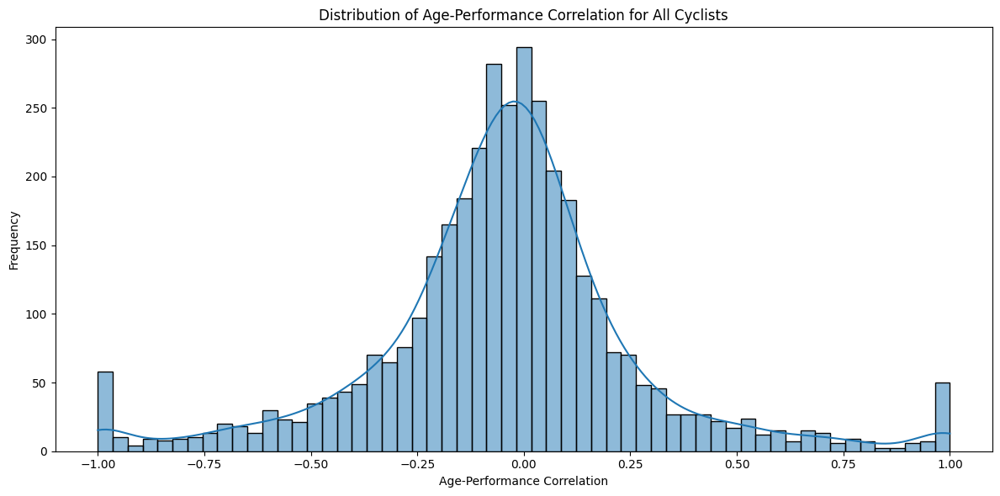

In [100]:
all_cyclists = career_progression['cyclist'].unique()
progression_data_all_cyclists = [analyze_cyclist_progression(cyclist, career_progression, plot=False) for cyclist in all_cyclists]
progression_data_all_cyclists = [data for data in progression_data_all_cyclists if data is not None]

prog_df = pd.DataFrame(progression_data_all_cyclists)


# Visualize age-performance correlation for all cyclists
plt.figure(figsize=(12, 6))
sns.histplot([data['age_performance_correlation'] for data in progression_data_all_cyclists], bins="auto", kde=True)
plt.title('Distribution of Age-Performance Correlation for All Cyclists')
plt.xlabel('Age-Performance Correlation')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()
plt.close()




### Observations on the Histogram Distribution of Age-Performance Correlation for All Cyclists

This histogram provides valuable insights into the distribution of age-performance correlations for cyclists. Here are the key observations:

- **Bell-shaped Distribution**: The overall shape resembles a bell curve, suggesting that the age-performance correlation follows an approximately normal distribution.
- **Centered around Zero**: The peak of the distribution is close to zero, indicating that for most cyclists, there isn't a strong correlation (either positive or negative) between age and performance.
- **Symmetry**: The distribution appears roughly symmetrical, meaning there are similar numbers of cyclists with positive and negative age-performance correlations.
- **Range**: The correlations range from -1.0 to +1.0, covering the full spectrum of possible correlation values.
- **Majority near Center**: The highest bars are clustered around the center (between -0.25 and 0.25), suggesting that for most cyclists, age has a relatively weak influence on performance.
- **Tails**: There are fewer cyclists at the extreme ends of the distribution, but some do show strong positive or negative correlations between age and performance.
- **Slight Negative Skew**: There appears to be a very slight skew towards the negative side, potentially indicating that more cyclists tend to show a small negative correlation between age and performance rather than a positive one.
- **Outliers**: The bars at the far ends (-1.0 and 1.0) are slightly taller than their neighbors, which might indicate some outliers or could be an artifact of how the data was binned.
- **Sample Size**: Given the smooth distribution and high frequencies, this analysis likely includes data from a large number of cyclists, providing a comprehensive view of the cycling population.
- **Variability**: The wide spread of the distribution highlights the significant variability in how age affects performance across different cyclists.

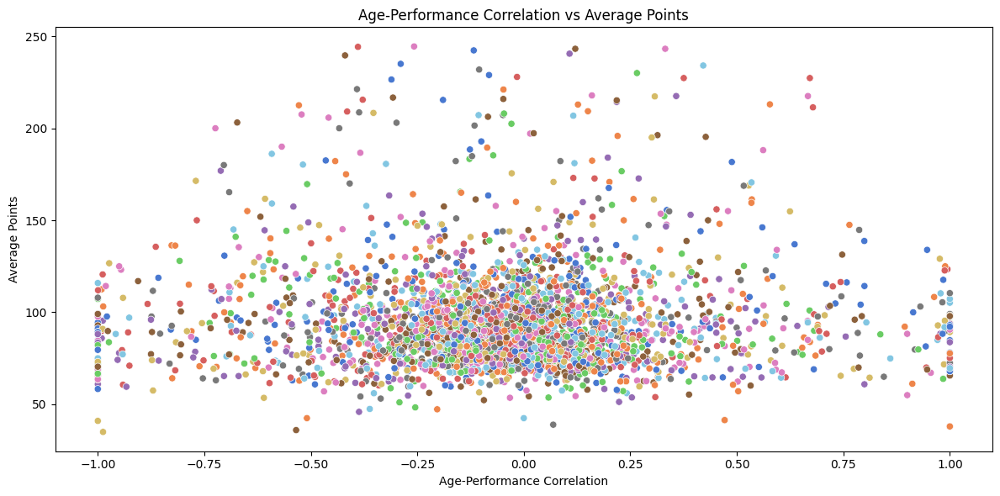

In [79]:
# Visualize  age-performance with annotations for all cyclists
plt.figure(figsize=(12, 6))
g = sns.scatterplot(x='age_performance_correlation', y='avg_points', hue='name', data=prog_df, palette='muted')
g.get_legend().remove()

plt.title('Age-Performance Correlation vs Average Points')
plt.xlabel('Age-Performance Correlation')
plt.ylabel('Average Points')
plt.tight_layout()
plt.show()
plt.close()

### Observations on Age-Performance Correlation vs Average Points Scatter Plot

This scatter plot provides a rich set of insights into the relationship between age-performance correlation and average points for a large number of cyclists. Here are the key observations:

- **Distribution Range**:
    - **Age-Performance Correlation**: Spans from -1.0 to 1.0, covering the full range of possible correlations.
    - **Average Points**: Ranges roughly from 50 to 250.

- **Density**: The highest concentration of points is in the center of the plot, particularly between -0.25 and 0.25 on the x-axis and 75 to 150 on the y-axis.

- **No Strong Overall Correlation**: There's no clear linear relationship between age-performance correlation and average points across the entire dataset.

- **Symmetry**: The distribution appears roughly symmetrical around the zero point on the x-axis, consistent with the histogram we saw earlier.

- **Performance Variability**: For any given age-performance correlation value, there's a wide range of average points, indicating that factors other than age significantly influence a cyclist's performance.

- **High Performers**: Some cyclists achieve high average points (200+) across the entire range of age-performance correlations, suggesting that top performers can excel regardless of how their performance correlates with age.

- **Low Performers**: Similarly, there are cyclists with low average points across all correlation values, indicating that some struggle to achieve high points regardless of age-performance relationship.

- **Outliers**: There are several noticeable outliers, particularly in the upper regions of the plot, representing cyclists with exceptionally high average points.

- **Tails**: The extreme ends of the x-axis (-1.0 and 1.0) have fewer data points but still show a range of average points, consistent with the histogram we saw earlier.

- **Individual Differences**: The scattered nature of the plot emphasizes the high degree of individual variability in cycling performance and how it relates to age.

- **No Clear "Optimal" Correlation**: There's no evident age-performance correlation value that consistently produces higher average points, reinforcing the complexity of factors influencing cycling performance.

- **Data Richness**: The plot contains a large number of data points, suggesting a comprehensive dataset that likely covers a wide range of cyclists across different categories and career stages.

This plot underscores the complex and highly individualized nature of cycling performance. While age does play a role, as evidenced by the range of correlations, it's clear that many other factors contribute to a cyclist's average performance over time.

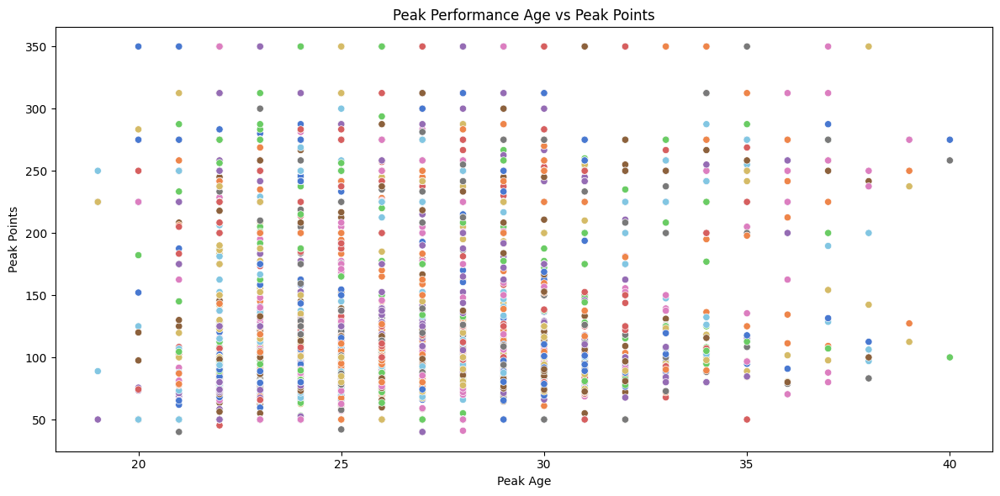

In [109]:
# Analyze peaks for all cyclists

peak_data = [analyze_performance_peaks(cyclist, career_progression) for cyclist in  all_cyclists]
peak_data = [data for data in peak_data if data is not None]

peak_df = pd.DataFrame(peak_data)

# Visualize peak ages with annotations
plt.figure(figsize=(12, 6))
g = sns.scatterplot(x='peak_age', y='peak_points', data=peak_df, hue='name', palette='muted')
g.get_legend().remove()
plt.title('Peak Performance Age vs Peak Points')
plt.xlabel('Peak Age')
plt.ylabel('Peak Points')
plt.tight_layout()
plt.show()
plt.close()

### Observations on Peak Performance Age vs Peak Points Scatter Plot

The scatterplot titled "Peak Performance Age vs Peak Points" shows the relationship between athletes' peak performance (in terms of points) and the age at which they reached that peak. Here are some key observations:

- **Age Distribution of Peak Performance**:
    - The peak performance age appears to be concentrated between 23 and 30 years.
    - There are still notable outliers where athletes reach their peak points as early as 18-20 years and as late as their mid-30s to 40 years.

- **Points Distribution Across Age**:
    - A large number of athletes achieve between 100 and 250 points at various ages, but especially around ages 25-30.
    - There are fewer athletes achieving extreme point values (closer to 350 points), but those peak points are spread across a wide range of ages, with some athletes peaking at 350 points as young as 20 and as old as 40.

- **Densely Packed Points**:
    - At most ages, especially between 23 and 30, the points are densely packed, suggesting that many athletes tend to hit their peak in these ages.
    - The distribution of points suggests that the majority of athletes perform consistently in a certain range (50 to 300 points).

- **Peaks Over 300 Points**:
    - There are instances of athletes scoring over 300 points, but these are rarer, and they happen across a wider range of ages, from 20 to mid-30s. This suggests that exceptional performances can happen at any stage during an athlete's career.

- **Later-Age Peaks**:
    - While fewer athletes reach peak points after age 35, those who do tend to achieve a wide range of points (from around 50 up to over 300 points). This suggests that while fewer athletes peak at older ages, when they do, their performance can vary greatly.

**Conclusion**:

The plot demonstrates that the majority of athletes reach their peak performance in terms of points between the ages of 23 and 30, with a dense concentration around these ages. However, there are still exceptional performances at both younger and older ages, including performances with peak points as high as 350. This suggests that peak performance in the sport can be achieved at various stages of an athlete's career, though there is a clear clustering in the mid-20s to early 30s.

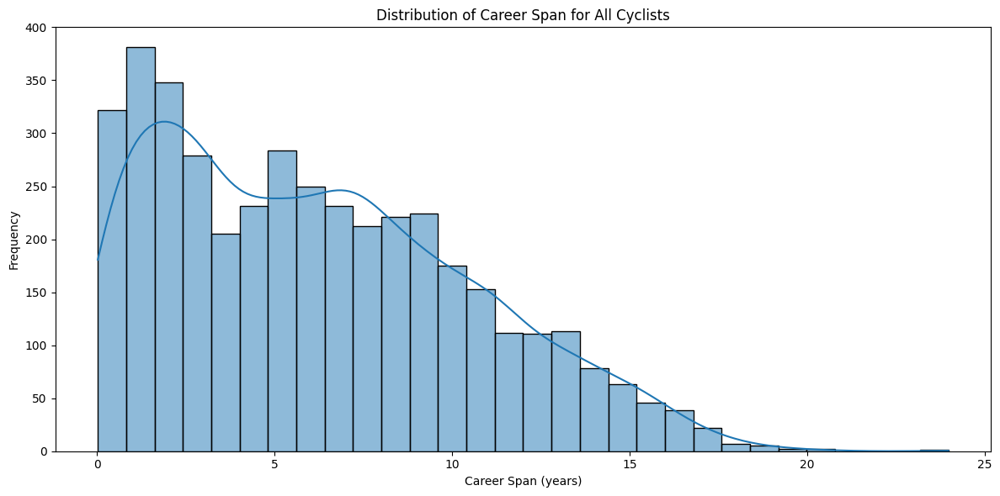

NameError: name 'peak_df' is not defined

In [107]:
# visualization of the career span histograms
plt.figure(figsize=(12, 6))
sns.histplot(prog_df['career_span'], bins=30, kde=True)
plt.title('Distribution of Career Span for All Cyclists')
plt.xlabel('Career Span (years)')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()
plt.close()
del prog_df
del peak_df
del career_progression

### Observations on the Histogram of Career Span for All Cyclists

The histogram shows the distribution of career spans for all cyclists. Here are some observations:

- **Skewness**: The distribution is right-skewed, meaning there are a few cyclists with very long careers, but most cyclists have careers between 5 and 15 years.
- **Peak**: The peak of the distribution is around 5-7 years, indicating that this is the most common career span.
- **Tail**: The distribution has a long tail on the right side, indicating that there are a few cyclists with exceptionally long careers.
- **Mode**: The mode of the distribution is around 5 years, indicating that this is the most frequent career span.
- **Median**: The median of the distribution is likely to be between 5 and 10 years, as the distribution is skewed to the right.
- **Mean**: The mean of the distribution is likely to be higher than the median due to the right-skewness.

Overall, the histogram suggests that while there are a few cyclists with very long careers, the majority of cyclists have careers between 5 and 15 years. This may be due to a combination of factors, such as the physical demands of cycling, the competitive nature of the sport, and the desire for new challenges.

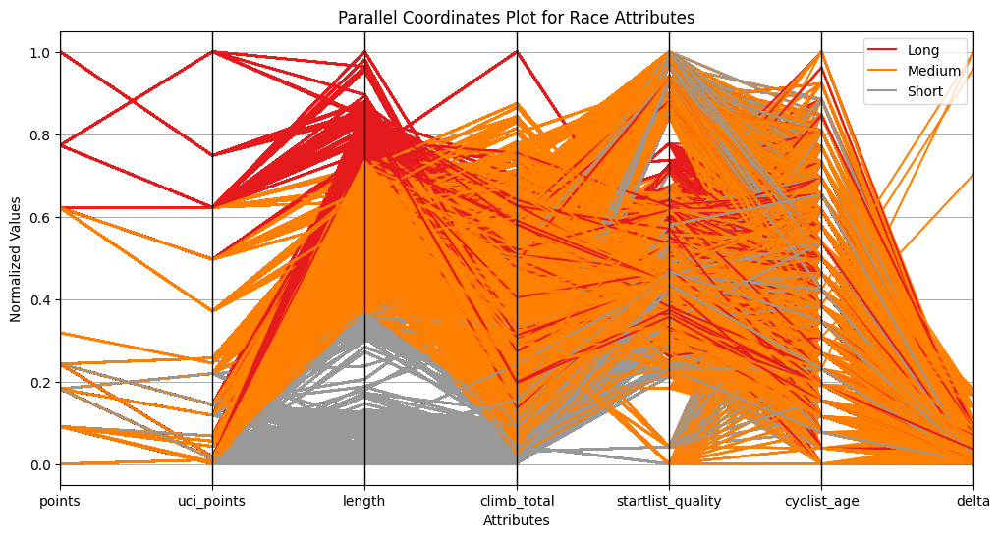

In [86]:
# Assuming the dataset is loaded into a DataFrame called 'df'
# Selecting relevant columns and dropping rows with missing values
selected_columns = ['points', 'uci_points', 'length', 'climb_total', 'startlist_quality', 'cyclist_age', 'delta']
df_selected = merged_df[selected_columns].dropna()

# Optional: Normalize the data for better visualization
df_normalized = (df_selected - df_selected.min()) / (df_selected.max() - df_selected.min())

# Adding a categorical column for coloring (e.g., based on length of the race)
df_normalized['length_category'] = pd.cut(merged_df['length'], bins=3, labels=['Short', 'Medium', 'Long'])

# Plotting the parallel coordinates
plt.figure(figsize=(12, 6))
pd.plotting.parallel_coordinates(df_normalized, 'length_category', colormap=plt.get_cmap("Set1"))
plt.title('Parallel Coordinates Plot for Race Attributes')
plt.xlabel('Attributes')
plt.ylabel('Normalized Values')
plt.show()

### Key Observations on Parallel Coordinated plot for race attributes:

- **Clustering**: The lines for each category tend to cluster together, indicating that races within the same category share similar characteristics.
- **Differences between categories**: There are clear differences between the three categories. For example, races in the "Long" category tend to have higher values for "length" and "climb_total," while races in the "Short" category tend to have lower values

Spearman correlation coefficient: 0.1447
P-value: 0.0000


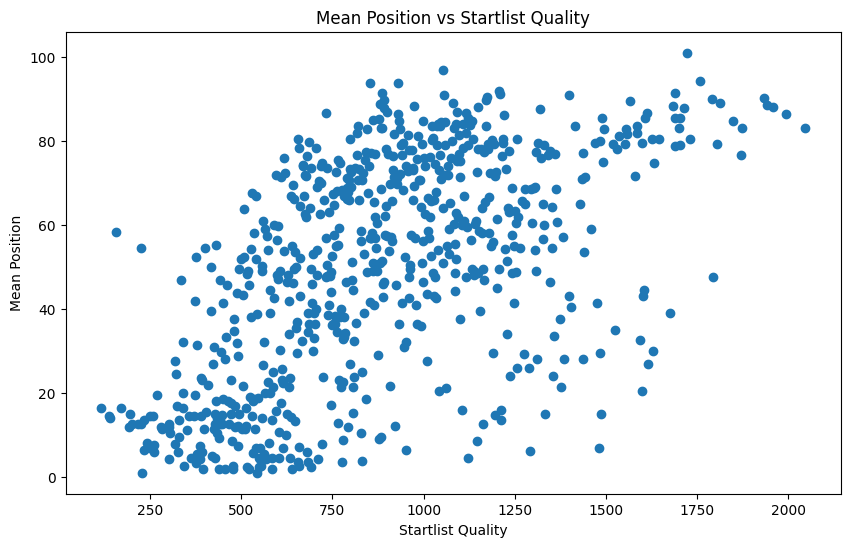

In [83]:
df = merged_df.copy()



# Calculate correlation
correlation, p_value = stats.spearmanr(df['startlist_quality'], df['position'])

print(f"Spearman correlation coefficient: {correlation:.4f}")
print(f"P-value: {p_value:.4f}")

# Group by startlist_quality and calculate mean position
grouped_data = df.groupby('startlist_quality')['position'].mean().reset_index()

# Create scatter plot of mean position vs startlist quality
plt.figure(figsize=(10, 6))
plt.scatter(grouped_data['startlist_quality'], grouped_data['position'])
plt.title('Mean Position vs Startlist Quality')
plt.xlabel('Startlist Quality')
plt.ylabel('Mean Position')
plt.show()
plt.close()
del df

### Observations on the Spearman Correlation Coefficient

**Spearman Correlation Coefficient (0.1447)**

The Spearman correlation coefficient of 0.1447 indicates a positive but weak correlation between `startlist_quality` and `position`. This means that as the startlist quality increases, the average race position tends to increase slightly. In this context, a higher race position number typically indicates a lower finishing placement (e.g., 1st place being better than 10th place).

Although the correlation is positive, the value is closer to zero than to one, suggesting that the relationship is weak. This implies that while there is some tendency for higher startlist quality to be associated with worse positions, the relationship is not strong, and other factors may have a more significant influence on race positions.

**P-value (0.0000)**

The p-value of 0.0000 (rounded to four decimal places) is statistically significant, meaning the observed correlation is unlikely to be due to random chance. Typically, a p-value less than 0.05 indicates statistical significance, and here, it is well below this threshold.

The statistically significant result implies that the weak positive correlation is meaningful, even though the effect size is small.

**Observations on Mean Position vs Startlist Quality Scatter Plot**

This scatter plot shows the relationship between Startlist Quality and Mean Position for what appears to be cycling events or races. Here are key observations:

- **Range of Data**:
    - Startlist Quality ranges from about 115 to 2047.
    - Mean Position ranges from approximately 1 to 100.

- **Overall Trend**: There's a general upward trend in the data. As Startlist Quality increases, the Mean Position tends to increase as well.

- **Spread**: The data points are widely spread, indicating significant variability in Mean Position for any given Startlist Quality.

- **Density**: There's a higher concentration of data points in the Startlist Quality range of 500-1250.

- **Lower Bound Pattern**: There's a clear lower boundary to the data points, forming a curve that rises as Startlist Quality increases. This suggests a minimum Mean Position that increases with Startlist Quality.

- **Upper Limit**: The highest Mean Positions (around 100) are seen across a wide range of Startlist Qualities, but more frequently at higher quality levels.

- **Clusters**: There are some visible clusters, particularly in the lower Startlist Quality range (115-500) with low Mean Positions (1-20).

- **Outliers**: Some outliers are visible, particularly points with high Mean Positions at lower Startlist Qualities.

- **Non-linear Relationship**: The relationship doesn't appear to be strictly linear. The trend seems to curve, with a steeper rise in Mean Position at lower Startlist Qualities.

- **Variability**: There's high variability in Mean Position, especially in the mid-range of Startlist Quality (750-1250).

- **Competitive Events**: The plot suggests that events with higher Startlist Quality are generally more competitive, as indicated by higher Mean Positions.

- **Performance Range**: Even in high-quality events, some competitors achieve very low Mean Positions, indicating top performances in elite fields.

This plot provides insights into how the quality of the starting field relates to finishing positions in cycling events. It suggests that while higher-quality fields generally lead to higher (worse) finishing positions, there's considerable variation, likely due to individual performance factors, race dynamics, and other variables not captured in this two-dimensional view.

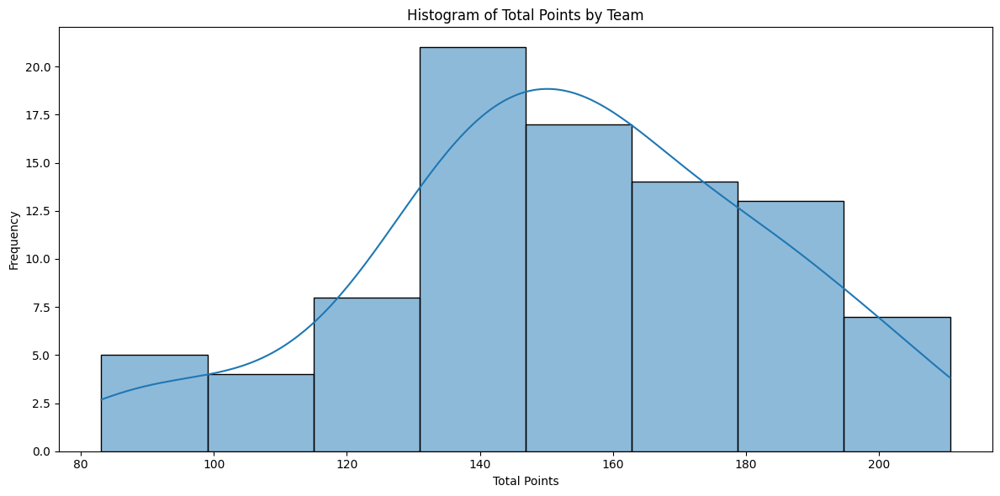

<Figure size 1200x800 with 0 Axes>

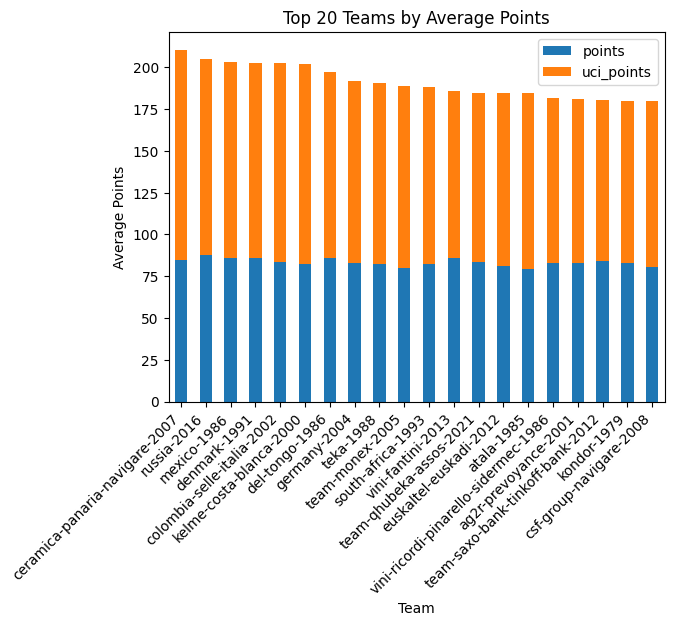

In [92]:
df_clean = merged_df.dropna(subset=['cyclist_team', 'points', 'uci_points', 'startlist_quality'])

# 1. Analyze cyclist_team vs. points and uci_points

# Calculate mean points and UCI points for each team
team_performance = df_clean.groupby('cyclist_team').agg({
    'points': 'mean',
    'uci_points': 'mean'
}).reset_index()

# Sort teams by total points (sum of points and uci_points)
team_performance['total_points'] = team_performance['points'] + team_performance['uci_points']
team_performance = team_performance.sort_values('total_points', ascending=False)

# Create a histogram of the all teams
plt.figure(figsize=(12, 6))
sns.histplot(team_performance['total_points'], bins='auto', kde=True)
plt.title('Histogram of Total Points by Team')
plt.xlabel('Total Points')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()
plt.close()

plt.figure(figsize=(12, 8))
team_performance.head(20).plot(x='cyclist_team', y=['points', 'uci_points'], kind='bar', stacked=True)
plt.title('Top 20 Teams by Average Points')
plt.xlabel('Team')
plt.ylabel('Average Points')
plt.xticks(rotation=45, ha='right')
# plt.tight_layout()
plt.show()
plt.close()



### Observations on the Histogram of Total Points by Team

The histogram shows the distribution of total points scored by teams. Here are some observations:

- **Skewness**: The distribution is slightly right-skewed, meaning there are a few teams with significantly higher total points than the majority.
- **Peak**: The peak of the distribution is around 150-160 points, indicating that this is the most common range of total points for teams.
- **Mode**: There is a clear mode around 150-160 points, indicating that this is the most frequent range of total points.
- **Spread**: The distribution is relatively spread out, with a range of approximately 120 points from the minimum to the maximum.
- **Outliers**: There are a few outliers on the right side of the distribution, representing teams with significantly higher total points.
- **Density Curve**: The density curve superimposed on the histogram provides a smooth estimate of the underlying probability distribution. It helps to visualize the overall shape of the distribution and identify any patterns.

Overall, the histogram suggests that most teams score between 150 and 160 points, with a few outliers scoring significantly higher. The right-skewness indicates that there are a few teams that perform significantly better than the average.

### Top 20 Teams by Average Points
The plot shows the average points scored by the top 20 teams in two categories: "points" and "uci_points." Here are some observations:

- **Overall Points**: The team "ceramica panaria-navigare-2007" scored the highest average points overall, followed by "russia-2016" and "mexico-1986."
- **"points" vs. "uci_points"**: For most teams, the "points" category contributes more to the overall average points than the "uci_points" category. However, there are a few teams where the "uci_points" category contributes significantly to the overall average.
- **Clustering**: The teams can be clustered into groups based on their overall average points. For example, there is a group of teams with very high average points, a group with moderately high average points, and a group with lower average points.
- **Consistency**: Some teams consistently score high in both "points" and "uci_points," while others may have more variability in their performance.

Overall, the plot suggests that there is a wide range of performance among the top 20 teams, with some teams consistently outperforming others in both "points" and "uci_points." However, the relative contribution of each category to the overall average points varies among teams.

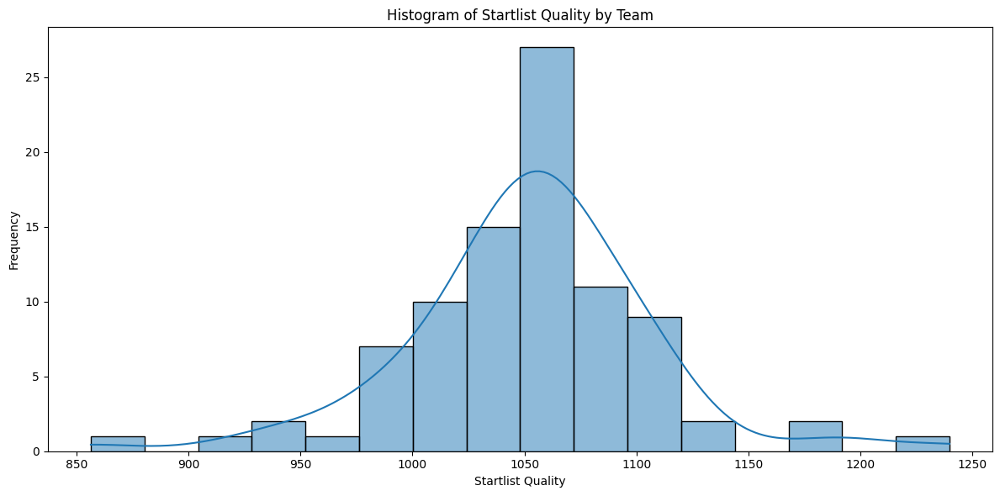

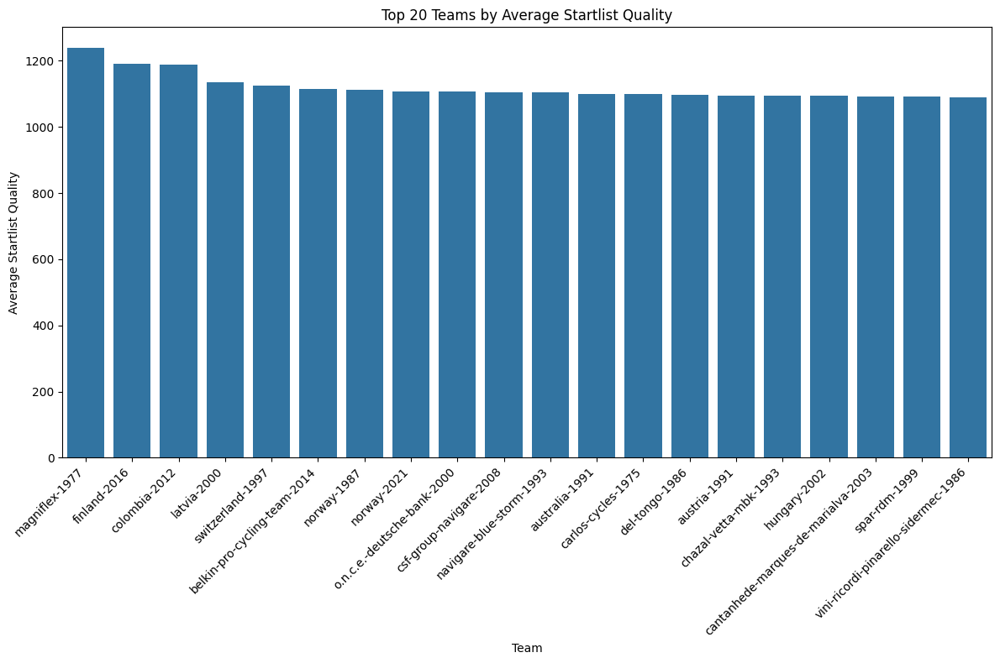

In [91]:
# 2. Analyze cyclist_team vs. startlist_quality

# Calculate mean startlist quality for each team
team_quality = df_clean.groupby('cyclist_team')['startlist_quality'].mean().reset_index()
team_quality = team_quality.sort_values('startlist_quality', ascending=False)

# Create a histogram of the startlist quality for all teams
plt.figure(figsize=(12, 6))
sns.histplot(team_quality['startlist_quality'], bins='auto', kde=True)
plt.title('Histogram of Startlist Quality by Team')
plt.xlabel('Startlist Quality')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()
plt.close()


# Create a bar plot
plt.figure(figsize=(12, 8))
sns.barplot(x='cyclist_team', y='startlist_quality', data=team_quality.head(20))
plt.title('Top 20 Teams by Average Startlist Quality')
plt.xlabel('Team')
plt.ylabel('Average Startlist Quality')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()
plt.close()



### Observations on the Histogram of Startlist Quality by Team

This histogram shows the distribution of "Startlist Quality" across different teams. Here are several key observations:

**Shape and Distribution:**

- The data appears to follow a roughly normal (bell-shaped) distribution, as indicated by the blue curve overlaid on the histogram.
- It's slightly right-skewed, meaning there's a longer tail extending toward higher quality scores.

**Central Tendency:**

- The peak (mode) appears to be around 1050-1075.
- Most of the data points fall between 1000 and 1150.

**Range:**

- The full range extends from about 850 to 1250.
- This suggests a difference of about 400 points between the lowest and highest quality scores.

**Frequency:**

- The highest bar shows approximately 27 teams in the most common quality range.
- There are relatively few teams (1-2) at the extreme ends of the distribution.

**Clustering:**

- There's a clear concentration of teams in the middle quality ranges.
- The distribution shows gradually declining frequencies as you move away from the center in either direction.

**Outliers:**

- There appear to be a few outlier teams with very high (>1200) or very low (<900) quality scores.
- These outliers are relatively rare, as shown by the small bars at the edges.

### Top 20 Teams by Average Startlisit Quality

This bar chart shows the top 20 teams by average Startlist Quality, and there are several interesting observations:

**Range and Scale:**

- The highest quality score is around 1200 (magniflex-1977).
- The lowest among these top 20 is around 1080 (win-record-pintarello-sidermec-1986).
- The difference between the top and 20th position is relatively small (about 120 points).

**Team Names and Years:**

- Most team names include years, spanning from 1977 to 2021.
- There's a mix of older teams (1970s-1990s) and more recent ones (2000s-2020s).
- The top team is from 1977 (magniflex-1977).
- Some of the newer teams like finland-2016 and colombia-2012 are near the top.

**Distribution Pattern:**

- There's a steep drop from the top team to the second place.
- After the top 3-4 teams, the decline becomes more gradual.
- The bottom 10-12 teams are very close in quality, with minimal differences.

**Geographic Diversity:**

- Teams represent various countries/regions including:
    - European teams (finland, norway, belgium).
    - South American teams (colombia).
    - Various national and sponsored teams.

**Relative Differences:**

- The top 3 teams (magniflex-1977, finland-2016, colombia-2012) stand notably above the rest.
- The middle and lower portions of the top 20 are very tightly clustered.

This visualization helps identify the elite teams while showing that the differences in quality among top teams are relatively small, suggesting high competitiveness at the highest level.

Correlation between startlist quality and points: -0.2207 (p-value: 0.0377)
Correlation between startlist quality and UCI points: -0.4787 (p-value: 0.0000)


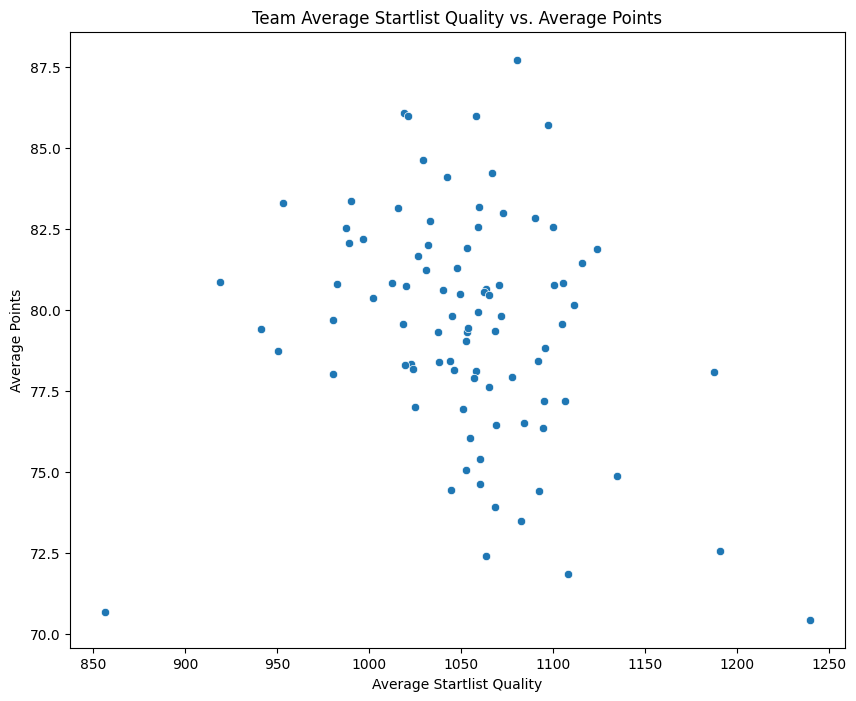

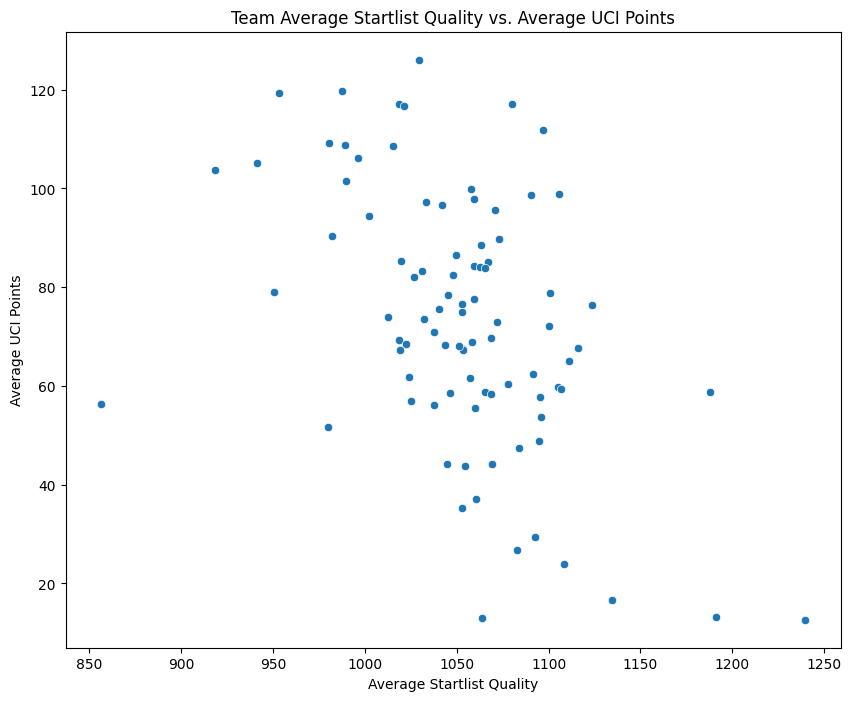

In [86]:
# 3. Correlation between team's average startlist quality and average points

# Merge team_performance and team_quality dataframes
team_analysis = pd.merge(team_performance, team_quality, on='cyclist_team')

# Calculate correlation
correlation_points, p_value_points = stats.pearsonr(team_analysis['startlist_quality'], team_analysis['points'])
correlation_uci, p_value_uci = stats.pearsonr(team_analysis['startlist_quality'], team_analysis['uci_points'])

print(f"Correlation between startlist quality and points: {correlation_points:.4f} (p-value: {p_value_points:.4f})")
print(f"Correlation between startlist quality and UCI points: {correlation_uci:.4f} (p-value: {p_value_uci:.4f})")

# Create scatter plots
plt.figure(figsize=(10, 8))
sns.scatterplot(x='startlist_quality', y='points', data=team_analysis)
plt.title('Team Average Startlist Quality vs. Average Points')
plt.xlabel('Average Startlist Quality')
plt.ylabel('Average Points')
plt.show()
plt.close()

plt.figure(figsize=(10, 8))
sns.scatterplot(x='startlist_quality', y='uci_points', data=team_analysis)
plt.title('Team Average Startlist Quality vs. Average UCI Points')
plt.xlabel('Average Startlist Quality')
plt.ylabel('Average UCI Points')
plt.show()
plt.close()


### Observations on the Correlation between Startlist Quality and Points, UCI Points

**Correlation between Startlist Quality and Points**

- **Correlation coefficient: -0.2207**
    - This indicates a weak negative correlation between startlist quality and points. In other words, as the startlist quality increases, there is a slight tendency for the number of points to decrease.
- **P-value: 0.0377**
    - Since the p-value is less than 0.05, it indicates that the correlation is statistically significant at the 5% level. This means there is evidence to suggest that the observed correlation is unlikely to be due to chance.

**Correlation between Startlist Quality and UCI Points**

- **Correlation coefficient: -0.4787**
    - This indicates a moderate negative correlation between startlist quality and UCI points. It suggests that as the startlist quality increases, the UCI points tend to decrease more noticeably than regular points.
- **P-value: 0.0000**
    - A p-value of zero indicates high statistical significance, meaning that the correlation is almost certainly not due to random chance. This is a strong indicator that there is indeed a negative relationship between these variables.

**Probable Assumptions and Interpretations**

**Startlist Quality's Impact on Performance**

- **Negative Correlations Suggest a Potential Paradox**: The negative correlations imply that higher-quality startlists are associated with lower points and UCI points. One possible explanation is that races with a higher-quality startlist (meaning the field is stronger) are more competitive. In such cases, even top cyclists may find it harder to score points, as the distribution of points is spread across more strong competitors.
- **Competitive Environment**: When the startlist is stronger (higher quality), it may indicate that there are many top-ranked cyclists participating, which makes it more challenging for any single cyclist or team to dominate and collect points.

**Statistical Significance of the Correlations**

- **Statistical Significance vs. Practical Significance**: While both correlations are statistically significant, the strength of the correlation varies. The correlation with UCI points (-0.4787) is stronger, suggesting that UCI points may be more sensitive to the quality of the startlist. This could mean that UCI points are harder to obtain in more competitive races compared to regular points.

**Potential Underlying Factors**

- **Team Strategy and Goals**: Some teams may prioritize performing well in races with lower startlist quality to maximize points collection, rather than competing for UCI points in tougher races with higher startlist quality.
- **Cyclist Form and Race Selection**: Teams may choose to send their top cyclists to races with lower startlist quality to boost their chances of scoring points, while they may use more developmental riders in high-quality startlist events.

**Conclusion**

The output suggests that there is a statistically significant negative relationship between startlist quality and both points and UCI points. The stronger negative correlation with UCI points indicates that UCI points are more affected by the quality of the competition than regular points. This highlights the increased difficulty of scoring well in more competitive races, which may reflect the strategies employed by teams when deciding on race participation.
### Observations on Team Average Startlist Quality vs Average Points and UCI Points Scatter Plots

These two scatter plots compare Average Startlist Quality against two different performance metrics. Here are key observations:

**General Pattern Comparison:**

- Both plots show considerable scatter/dispersion.
- Neither plot shows a strong linear relationship between Startlist Quality and performance.
- Interestingly, higher Startlist Quality doesn't necessarily correlate with better performance in either metric.

**Top Plot (Average Points):**

- Points range roughly from 70 to 87.5.
- Most teams cluster between 75-85 points.
- There's a slight negative trend at very high Startlist Quality values.
- The highest scoring teams tend to be in the middle range of Startlist Quality (around 1000-1100).
- Teams with very high Startlist Quality (>1200) actually show lower average points.

**Bottom Plot (Average UCI Points):**

- UCI Points range from about 15 to 120.
- Shows more dramatic variation than the top plot.
- There's a more noticeable negative correlation at higher Startlist Quality values.
- The teams with highest UCI points are in the middle range of Startlist Quality.
- Similar to the top plot, teams with very high Startlist Quality tend to have lower UCI points.

**Common Patterns:**

- Both metrics suggest that having an extremely high Startlist Quality doesn't guarantee better performance.
- The best performing teams in both metrics tend to have moderate Startlist Quality scores.
- There's significant variation in performance even among teams with similar Startlist Quality.

**Implications:**

- This might suggest that team balance or other factors beyond raw Startlist Quality are important for success.
- There could be diminishing returns or even negative effects from having very high Startlist Quality.
- The relationship between team quality and performance appears to be more complex than a simple linear correlation.

In [89]:

# Data Preparation
temp_df = merged_df.copy().dropna(subset=['height', 'weight', 'date'])

# Calculate BMI
temp_df['bmi'] = temp_df['weight'] / ((temp_df['height'] / 100) ** 2)

# Calculate years of experience
temp_df['career_start'] = temp_df.groupby('name_x')['date'].transform('min')
temp_df['experience'] = (pd.to_datetime(temp_df['date']) - pd.to_datetime(temp_df['career_start'])).dt.days / 365.25

# Function to categorize race profile
def categorize_profile(profile):
    if profile < 1.5:
        return 'Flat'
    elif profile < 3:
        return 'Hilly'
    elif profile < 4:
        return 'Mountainous'
    elif profile < 5:
        return 'High Mountainous'
    else:
        return 'Really High Mountainous'

# Add race category to the dataframe
temp_df['race_category'] = temp_df['profile'].apply(categorize_profile)

# Function to get top performer for each race category
def get_top_performer(category):
    category_data = temp_df[temp_df['race_category'] == category]
    top_cyclist = category_data.groupby('name_x')['points'].mean().idxmax()
    return category_data[category_data['name_x'] == top_cyclist].iloc[0]

# Get top performers
top_performers = {
    'Flat': get_top_performer('Flat'),
    'Hilly': get_top_performer('Hilly'),
    'Mountainous': get_top_performer('Mountainous'),
    'High Mountainous': get_top_performer('High Mountainous'),
    'Really High Mountainous': get_top_performer('Really High Mountainous')
}

# Prepare data for radar plot
attributes = ['height', 'weight', 'bmi', 'cyclist_age', 'experience']
data = {category: [cyclist[attr] for attr in attributes] for category, cyclist in top_performers.items()}

# Normalize the data separately for each attribute
scaler = MinMaxScaler()
normalized_data = scaler.fit_transform(pd.DataFrame(data, index=attributes).T).T

# Function to create enhanced radar plot using Plotly
def radar_plot(data, title, names):
    fig = go.Figure()

    for i, (category, values) in enumerate(data.items()):
        fig.add_trace(go.Scatterpolar(
            r=values + values[:1],  # Repeat the first value for closure
            theta=attributes + [attributes[0]],  # Repeat the first attribute for closure
            fill='toself',
            name=f"{category} - {names[category]}",
            opacity=0.6,
            marker=dict(size=8)
        ))

    fig.update_layout(
        polar=dict(
            radialaxis=dict(
                visible=True,
                range=[0, 2],
                showline=True,
                linewidth=1,
                tickfont=dict(size=10)
            )
        ),
        showlegend=True,
        title=title,
        legend=dict(font=dict(size=12))
    )
    
    return fig

# Create the plot with normalized data and cyclist names
cyclist_names = {category: cyclist['name_x'] for category, cyclist in top_performers.items()}
fig = radar_plot(dict(zip(top_performers.keys(), normalized_data)), 
                 "Physical Attributes of Top Performers by Race Type", cyclist_names)

# Show the plot
fig.show()

# Print actual values for reference
print("Actual values:")
for category, cyclist in top_performers.items():
    print(f"\n{category} top performer: {cyclist['name_x']}")
    for attr in attributes:
        print(f"{attr}: {cyclist[attr]:.2f}")
del temp_df

Actual values:

Flat top performer: Andrei  Nechita
height: 183.00
weight: 71.00
bmi: 21.20
cyclist_age: 23.00
experience: 0.00

Hilly top performer: Adam  Ťoupalík
height: 175.00
weight: 65.00
bmi: 21.22
cyclist_age: 24.00
experience: 0.00

Mountainous top performer: Edwig  Cammaerts
height: 183.00
weight: 74.00
bmi: 22.10
cyclist_age: 26.00
experience: 1.15

High Mountainous top performer: Emil Mielke  Vinjebo
height: 181.00
weight: 67.00
bmi: 20.45
cyclist_age: 24.00
experience: 0.00

Really High Mountainous top performer: Bobbie  Traksel
height: 180.00
weight: 72.00
bmi: 22.22
cyclist_age: 21.00
experience: 0.00


### Observations on the Radar Plot of Physical Attributes of Top Performers by Race Type

This radar plot shows physical attributes and characteristics of top performers across different types of cycling races. Here are the key observations and reasonable assumptions:

#### Attributes Measured:
- Weight
- Height
- Experience
- Cyclist Age
- BMI

#### Race Type Categories:
- Flat
- Hilly
- Mountainous
- High Mountainous
- Really High Mountainous

#### Key Patterns:

**Flat Racing (Andrei Nechita):**
- Higher weight and BMI
- Relatively lower experience needed
- Mid-range height
- Younger age profile
- **Assumption**: Flat race specialists tend to be more muscular sprinters, where power-to-weight ratio is less critical.

**Hilly (Adam Toupalik):**
- Balanced attributes
- Moderate weight and height
- Mid-range experience
- **Assumption**: Versatile riders who need to balance power with climbing ability.

**Mountainous (Edwig Cammaerts):**
- Lower weight and BMI
- Higher experience levels
- Moderate height
- **Assumption**: Experience becomes more important due to the tactical nature of mountain racing.

**High Mountainous (Emil Mielke Vinjebo):**
- Very low weight and BMI
- High experience
- Moderate to higher age
- **Assumption**: Pure climbers who need excellent power-to-weight ratios.

**Really High Mountainous (Bobbie Traksel):**
- Lowest weight and BMI
- Highest experience levels
- Generally older
- **Assumption**: The most specialized category requiring years of experience and optimal body composition for climbing.

#### General Observations:
- There's a clear inverse relationship between terrain difficulty and rider weight/BMI.
- Experience tends to increase with terrain difficulty.
- Age generally correlates with experience level.
- Height shows less variation across categories than other attributes.

#### Assumptions about Success Factors:
- Flat races favor explosive power and aerodynamics.
- Mountain races prioritize power-to-weight ratio and tactical experience.
- The more extreme the terrain, the more specialized the physical requirements.
- Experience becomes increasingly crucial as terrain difficulty increases.
- Younger riders might find easier entry into flat racing compared to mountainous events.

These patterns suggest that different race types have evolved distinct "ideal" athlete profiles, likely due to the specific physical demands of each terrain type.

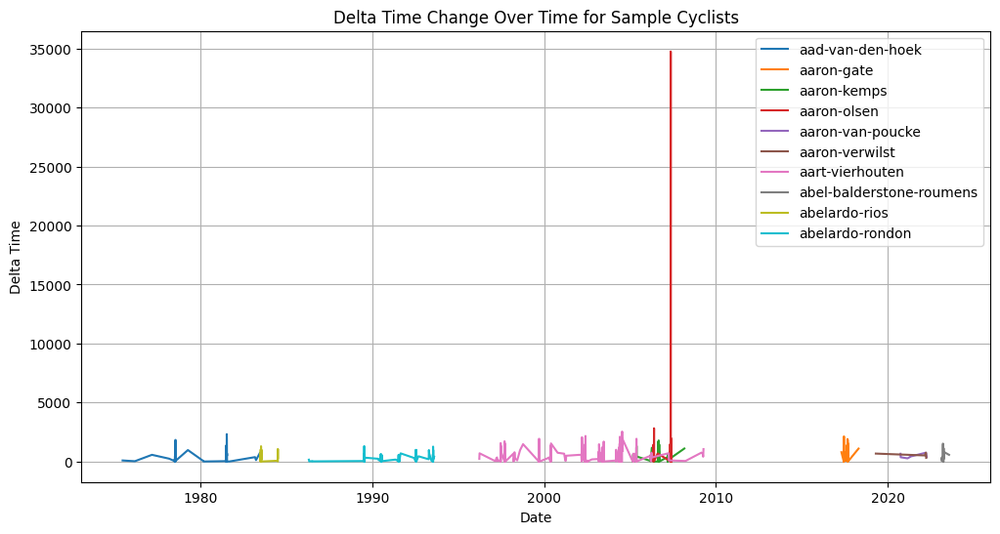

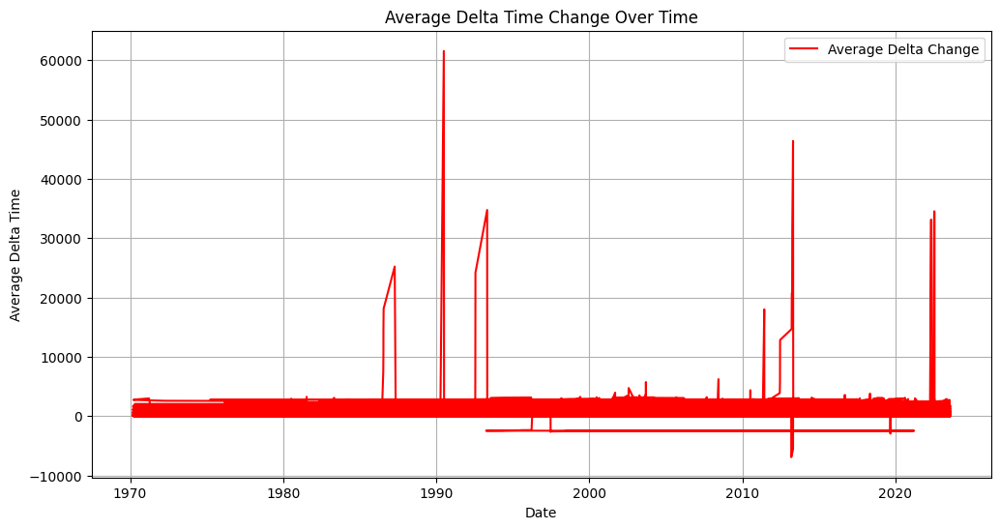

In [90]:
temp_df = merged_df.copy().dropna(subset=['date', 'delta'])
temp_df['date'] = pd.to_datetime(temp_df['date'])

# Sort data by cyclist and date
temp_df = temp_df.sort_values(by=['cyclist', 'date'])

# Calculate delta change over time for each cyclist
temp_df['delta_change'] = temp_df.groupby('cyclist')['delta'].diff()

# Analysis: Plotting delta change for a sample of cyclists
sample_cyclists = temp_df['cyclist'].dropna().unique()[:10]  # Get a sample of 10 cyclists

plt.figure(figsize=(12, 6))

for cyclist in sample_cyclists:
    cyclist_data = temp_df[temp_df['cyclist'] == cyclist]
    plt.plot(cyclist_data['date'], cyclist_data['delta'], label=cyclist)

plt.xlabel('Date')
plt.ylabel('Delta Time')
plt.title('Delta Time Change Over Time for Sample Cyclists')
plt.legend(loc='upper right')
plt.grid()
plt.show()

# Optional: Calculate overall mean delta change across all cyclists over time
temp_df['mean_delta'] = temp_df.groupby('date')['delta'].transform('mean')

# Plot mean delta change over time
plt.figure(figsize=(12, 6))
plt.plot(temp_df['date'].unique(), temp_df.groupby('date')['mean_delta'].mean(), label='Average Delta Change', color='red')
plt.xlabel('Date')
plt.ylabel('Average Delta Time')
plt.title('Average Delta Time Change Over Time')
plt.legend(loc='upper right')
plt.grid()
plt.show()

del temp_df

### Observations on Delta Time Change Over Time for Sample Cyclists (1980-2020)

#### Time Period Coverage:
- **Spans approximately 40 years (1980-2020)**
- **Different cyclists' data appears in different eras**
    - **Assumption**: Represents different generations of cyclists or changes in data collection methods over time.

#### Delta Time Patterns:
- **Most changes are relatively small and close to zero**
- **Occasional significant spikes**
- **One extremely large spike around 2010 (reaching about 35000)**
    - **Assumption**:
        - Normal variations likely due to typical performance fluctuations.
        - Large spikes might represent:
            - Major injuries or comebacks.
            - Technical problems during races.
            - Race conditions (weather, mechanical issues).
            - Changes in race format or categorization.

#### Data Distribution:
- **More dense data points in recent years (2000-2020)**
- **Sparser data in earlier years**
    - **Assumption**:
        - Better record-keeping in recent years.
        - More comprehensive race coverage in the modern era.
        - Possible increase in the number of competitive events.

#### Individual Patterns:
- **Most cyclists show relatively consistent patterns with occasional spikes**
- **Some cyclists appear for shorter periods while others have longer careers**
    - **Assumption**:
        - Shorter appearances might indicate:
            - Brief professional careers.
            - Transitions between categories.
            - Injuries or retirements.

#### Extreme Outlier:
- **Massive spike around 2010 (aaron-olsen)**
    - **Assumption**:
        - Could represent:
            - A major injury and return.
            - A significant break from competition.
            - Possible data recording error.
            - Change in race category or format.

#### Modern Era (2000-2020):
- **More frequent small variations**
- **Generally more active data**
    - **Assumption**:
        - More sophisticated timing systems.
        - More frequent racing schedule.
        - Better tracking of performance metrics.

#### Historical Context (1980-2000):
- **Fewer data points**
- **Generally smaller variations**
    - **Assumption**:
        - Less precise timing technology.
        - Fewer recorded events.
        - Different racing calendar structure.

#### Overall Trends:
- **No clear long-term trend in delta times**
- **Most variations stay within a reasonable range**
    - **Assumption**:
        - Sport has maintained relatively stable performance metrics.
        - Professional cycling has standardized over time.
        - Training methods have evolved to maintain consistency.

#### Career Patterns:
- **Different cyclists show different patterns of activity**
    - **Assumption**:
        - Reflects different career trajectories.
        - Various specializations in different types of races.
        - Different approaches to season planning.

#### Data Quality:
- **More consistent recording in recent years**
- **Some gaps and variations in recording patterns**
    - **Assumption**:
        - Evolution of timing and recording technology.
        - Changes in race reporting standards.
        - Improved data management in the modern era.

These observations suggest that while cycling performance tracking has become more sophisticated over time, individual performance variations remain a consistent feature of the sport, with occasional significant deviations that might reflect various competitive and personal factors.

#### Analysis of "Average Delta Time Change Over Time" Plot<!--  -->

**Baseline Pattern:**
- The baseline remains relatively stable around 0-2000 units throughout most of the timeline.
- Most data points cluster within this range, indicating it as the "normal" state.

**Significant Spikes:**
- Several major spikes are observed:
    - Around 1990 (~60,000 units)
    - Early 1990s (~35,000 units)
    - Around 2010 (~45,000 units)
    - Around 2020 (~35,000 units)

**Temporal Distribution:**
- The frequency of large spikes increases in the latter half of the timeline.
- More volatility is visible post-2000 compared to the 1970-1980 period.

**Probable Assumptions:**

**System Behavior:**
- The plot could be monitoring a system's response time or processing delay.
- Spikes likely represent significant anomalies or system disruptions.
- Negative values suggest potential clock adjustments or system corrections.

**Technical Context:**
- Given the "Delta Time" measurement:
    - It might relate to computer systems or network performance.
    - Could measure synchronization issues or processing delays.
    - Might involve time server adjustments or system clock corrections.

**Evolution:**
- The increasing frequency of spikes in recent years might indicate:
    - More complex system interactions.
    - Growing system load or scale.
    - Improved monitoring capabilities detecting more events.
    - Possible infrastructure changes or upgrades causing temporary disruptions.

**Operational Impact:**
- The brief nature of most spikes suggests they are temporary issues rather than systemic problems.
- The system appears to recover quickly from these anomalies, returning to baseline.


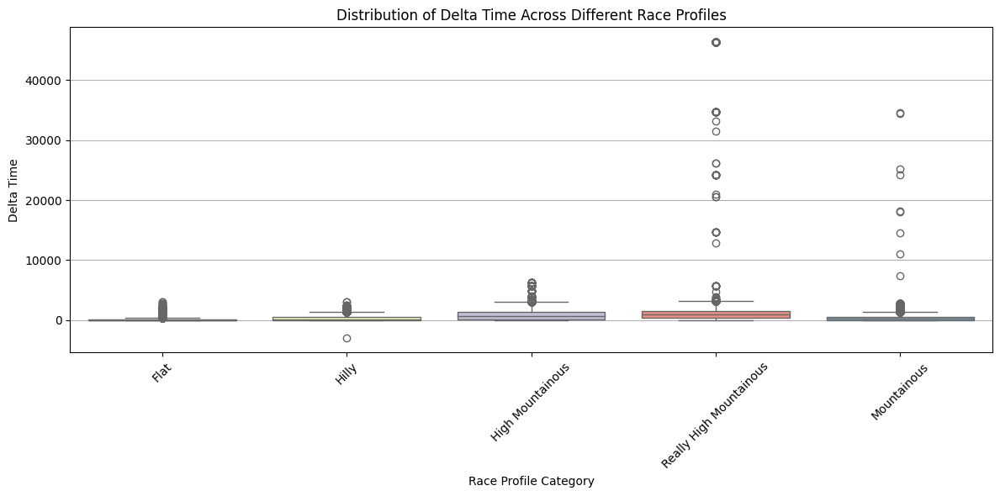

In [91]:
# Filter out rows with missing 'profile' or 'delta' values
filtered_df = merged_df.copy().dropna(subset=['profile', 'delta'])

# Categorize profiles for better readability (optional, based on categorize_profile function used earlier)
def categorize_profile(profile):
    if profile == 1.0:
        return 'Flat'
    elif profile == 2.0:
        return 'Hilly'
    elif profile == 3.0:
        return 'Mountainous'
    elif profile == 4.0:
        return 'High Mountainous'
    else:
        return 'Really High Mountainous'

# Apply the categorization function
filtered_df['profile_category'] = filtered_df['profile'].apply(categorize_profile)

# Create a box plot for delta values across different profile categories
plt.figure(figsize=(12, 6))
sns.boxplot(x='profile_category', y='delta', hue='profile_category', legend=False, data=filtered_df, palette='Set3')

# Add labels and title
plt.xlabel('Race Profile Category')
plt.ylabel('Delta Time')
plt.title('Distribution of Delta Time Across Different Race Profiles')
plt.xticks(rotation=45)
plt.grid(axis='y')

# Show the plot
plt.tight_layout()
plt.show()

del filtered_df

### Observations on the Box Plot of "Distribution of Delta Time Across Different Race Profiles"

#### Profile Categories
- There are 5 distinct categories: Flat, Hilly, High Mountainous, Really High Mountainous, and Mountainous.
- These categories represent different terrain types or elevation profiles for races.

#### Distribution Patterns
- **Median Values (horizontal line in each box):**
    - Generally similar across categories.
    - All appear to be relatively close to zero/low values.

- **Box Sizes (Interquartile Ranges):**
    - Relatively small for Flat and Hilly profiles.
    - Larger for the mountainous categories.
    - "Really High Mountainous" shows the largest spread in its core distribution.

#### Outliers
- Represented by individual dots above the boxes.
- **Most Extreme Outliers:**
    - Reach up to about 45,000 units in Really High Mountainous.
    - All mountainous categories show significant outliers.
    - Flat and Hilly profiles have fewer and less extreme outliers.

#### Probable Assumptions.

**Performance Implications**
- **Larger Variations in Mountainous Terrain Suggest:**
    - More unpredictable performance conditions.
    - Greater impact of environmental factors.
    - Higher technical difficulty affecting consistency.
    - More opportunities for significant time gains/losses.

**Terrain Impact**
- **Flat and Hilly Profiles Show More Consistent Times (Smaller Spreads):**
    - More predictable performance.
    - Less technical difficulty.
    - Fewer external factors affecting time.

- **Mountainous Profiles Show Higher Variability:**
    - More challenging technical sections.
    - Greater impact of weather conditions.
    - More opportunities for major time losses/gains.

**Competitive Implications**
- Race strategy might need to be more conservative in mountainous sections.
- Time predictions are likely more reliable for flat/hilly sections.
- Greater risk/reward opportunities in mountainous terrain.

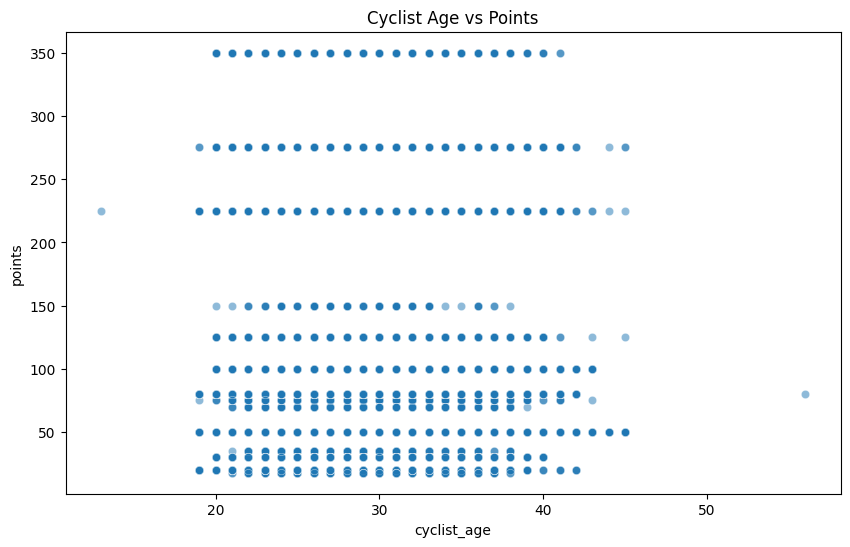

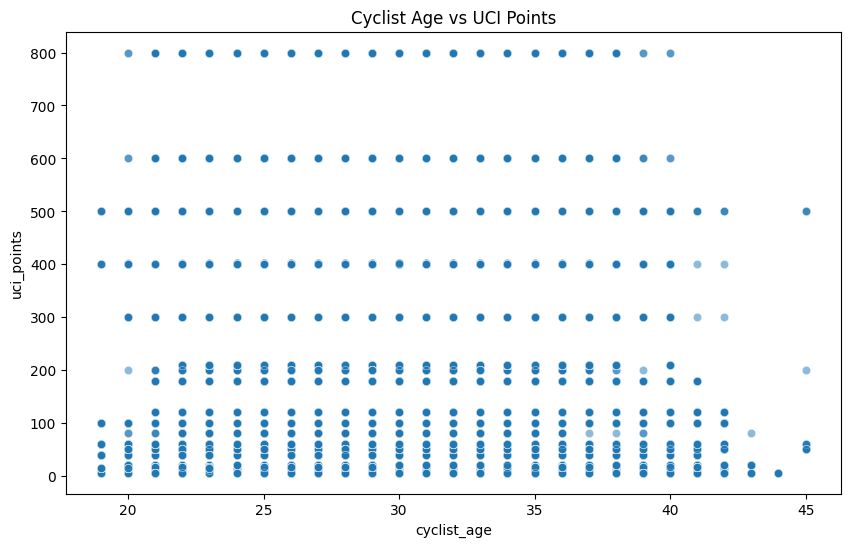

In [125]:


# Normalize relevant numerical columns


temp_df = merged_df.copy()


# 1.1 Cyclist Age vs Performance
plt.figure(figsize=(10, 6))
sns.scatterplot(x='cyclist_age', y='points', data=temp_df.dropna(subset=['cyclist_age', 'points',]), alpha=0.5)
plt.title('Cyclist Age vs Points')
plt.show()
plt.close()

# 1.2 Cyclist Age vs UCI Points
plt.figure(figsize=(10, 6))
sns.scatterplot(x='cyclist_age', y='uci_points', data=temp_df.dropna(subset=['cyclist_age', 'uci_points']), alpha=0.5)
plt.title('Cyclist Age vs UCI Points')
plt.show()
plt.close()




### Observations on the Relationship Between Cyclist Age and Points/UCI Points

#### Age Distribution
- **Primary age range**: ~20-45 years
- **Highest concentration of cyclists**: 25-35 years
- **Few cyclists competing beyond age 45**
- **Very few cyclists under 20**

#### Points Distribution Patterns

**First Plot (Regular Points):**
- **Distinct horizontal bands of points**: 350, 275, 225, 150, 100, etc.
    - Suggests standardized point allocations for different achievements/positions
- **Higher density in lower point ranges**: 0-100
- **Maximum points**: around 350

**Second Plot (UCI Points):**
- **More structured point tiers**: 800, 600, 500, 400, 300, etc.
- **Higher concentration in lower point ranges**: 0-200
- **Maximum UCI points**: around 800
- **Clear discrete levels**: suggesting standardized achievements

#### Age-Performance Relationship
- **Peak performance potential**: highest points appear possible across a wide age range (25-40)
- **No strong visual correlation**: between age and maximum achievable points
- **Point-earning capability**: seems relatively stable across prime cycling ages

#### Probable Assumptions

**Competition Structure**
- Points likely awarded for:
    - Race placements
    - Different competition tiers
    - Specific achievements or milestones
    - Season rankings or classifications

**Career Progression**
- Cyclists can achieve high points at any age during their prime years
- Experience doesn't necessarily translate to higher points
- System might favor consistency over age/experience

**Sport Demographics**
- Professional cycling careers typically:
    - Begin around age 20
    - Peak in late 20s to early 30s
    - Can extend into early 40s
    - Rare to compete at elite level beyond 45

**Performance Implications**
- Point-scoring opportunities appear equal across age groups
- Success more likely determined by:
    - Individual capability
    - Training quality
    - Race strategy
    - Team support
    - Competition level
    - Rather than age alone

**System Design**
- Both point systems appear structured with clear tiers
- UCI points seem more prestigious (higher values, fewer athletes achieving top tiers)
- Regular points system might be for lower-tier or regional competitions

<Figure size 1200x600 with 0 Axes>

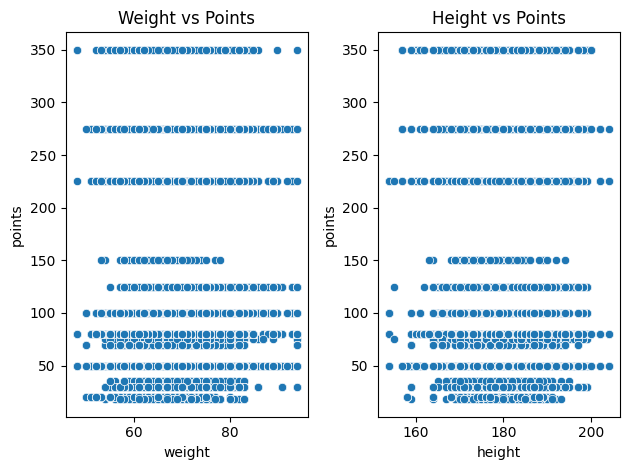

<Figure size 1200x600 with 0 Axes>

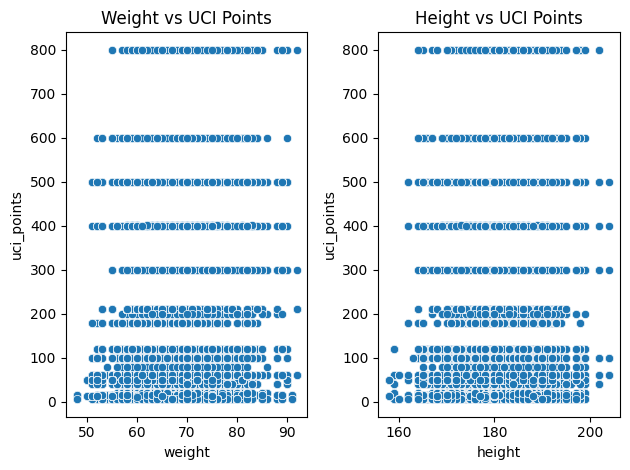

In [116]:
# 2.1 Cyclist Physical Attributes vs Performance
plt.figure(figsize=(12, 6))
fig, (ax1, ax2) = plt.subplots(1, 2)
sns.scatterplot(x='weight', y='points', data=temp_df.dropna(subset=['weight', 'points']), ax=ax1)
ax1.set_title('Weight vs Points')
sns.scatterplot(x='height', y='points', data=temp_df.dropna(subset=['height', 'points']), ax=ax2)
ax2.set_title('Height vs Points')
plt.tight_layout()
plt.show()
plt.close()

# 2.2 Cyclist Physical Attributes vs UCI Points
plt.figure(figsize=(12, 6))
fig, (ax1, ax2) = plt.subplots(1, 2)
sns.scatterplot(x='weight', y='uci_points', data=temp_df.dropna(subset=['weight', 'uci_points']), ax=ax1)
ax1.set_title('Weight vs UCI Points')
sns.scatterplot(x='height', y='uci_points', data=temp_df.dropna(subset=['height', 'uci_points']), ax=ax2)
ax2.set_title('Height vs UCI Points')
plt.tight_layout()
plt.show()
plt.close()



### Observations on the Relationship Between Cyclist Physical Attributes and Points

#### Data Structure:
- The plots show "Weight vs Points" and "Height vs Points" for cyclists.

#### Point Distribution:
- Points range from about 0 to 350, with distinct clustering at specific values (e.g., 50, 100, 150, 230, 280, 350).

#### Weight Distribution:
- Cyclist weights range approximately from 50kg to 90kg.
- Most cyclists appear to be clustered between 60-80kg.

#### Height Distribution:
- Heights range from about 160cm to 210cm.
- The majority of cyclists seem to fall between 170-190cm.

#### Relationship between Physical Attributes and Performance:
- There's no clear linear correlation between weight/height and points.
- However, the highest point earners (350 points) seem to have a slightly narrower range of weights and heights compared to the overall population.

#### Performance Tiers:
- Distinct horizontal lines of points suggest performance tiers or categories in cycling rankings.
- The highest tier (350 points) has fewer cyclists, indicating an elite group.

#### Weight and Performance:
- While there's no strong correlation, there seems to be a slight trend of fewer very high-point earners at the extremes of the weight range.
- This might suggest that being too light or too heavy could be disadvantageous for top-tier performance.

#### Height and Performance:
- Similar to weight, extreme heights (very short or very tall) are less represented among the highest point earners.
- This could indicate an optimal height range for cycling performance.

#### Specialization Hypothesis:
- The spread of weights and heights among point earners might reflect different cycling disciplines (e.g., climbers vs. sprinters).
- Lighter, shorter cyclists might excel in climbing, while heavier, taller cyclists might perform better in sprints or time trials.

#### Data Density:
- There's a high concentration of cyclists with lower points (0-100 range).
- This likely represents the broader base of professional cyclists, with fewer reaching the highest levels of the sport.

#### Outliers:
- A few cyclists with extreme weights or heights still manage to earn significant points, suggesting that exceptional skill can overcome physical attribute norms.

#### Performance Factors:
- The lack of strong correlation implies that factors beyond just physical attributes (like technique, training, experience, and strategy) play crucial roles in cycling performance.

In conclusion, while physical attributes like weight and height play a role in cycling performance, they don't appear to be deterministic. The data suggests that successful cyclists come in a range of body types, likely optimized for different aspects of the sport. The tiered point system reflects the structured nature of professional cycling rankings, with a small elite group at the top. Other factors beyond physical measurements clearly play a significant role in determining a cyclist's performance and ranking.


### Observations on the Relationship Between Cyclist Physical Attributes and UCI Points
#### Data Structure:
- The plots show "Weight vs UCI Points" and "Height vs UCI Points" for cyclists.
- UCI points likely refer to Union Cycliste Internationale ranking points.

#### Point Distribution:
- UCI points range from 0 to 800, with distinct clustering at specific values (e.g., 100, 300, 400, 500, 600, 800).
- This suggests a tiered or categorical point system in professional cycling.

#### Weight Distribution:
- Cyclist weights range approximately from 50kg to 90kg.
- Most cyclists appear to be clustered between 60-80kg.

#### Height Distribution:
- Heights range from about 160cm to 200cm.
- The majority of cyclists seem to fall between 170-190cm.

#### Relationship between Physical Attributes and Performance:
- There's no clear linear correlation between weight/height and UCI points.
- However, the highest point earners (800 points) seem to have a slightly narrower range of weights and heights compared to the overall population.

#### Performance Tiers:
- Distinct horizontal lines of points suggest performance tiers or categories in cycling rankings.
- The highest tier (800 points) has fewer cyclists, indicating an elite group.

#### Weight and Performance:
- While there's no strong correlation, there seems to be a slight trend of fewer very high-point earners at the extremes of the weight range.
- This might suggest that being too light or too heavy could be disadvantageous for top-tier performance.

#### Height and Performance:
- Similar to weight, extreme heights (very short or very tall) are less represented among the highest point earners.
- This could indicate an optimal height range for cycling performance.

#### Specialization Hypothesis:
- The spread of weights and heights among point earners might reflect different cycling disciplines (e.g., climbers vs. sprinters).
- Lighter, shorter cyclists might excel in climbing, while heavier, taller cyclists might perform better in sprints or time trials.

#### Data Density:
- There's a high concentration of cyclists with lower UCI points (0-200 range).
- This likely represents the broader base of professional cyclists, with fewer reaching the highest levels of the sport.

#### Outliers:
- A few cyclists with extreme weights or heights still manage to earn significant points, suggesting that exceptional skill can overcome physical attribute norms.

#### Performance Factors:
- The lack of strong correlation implies that factors beyond just physical attributes (like technique, training, experience, and strategy) play crucial roles in cycling performance.

In conclusion, while physical attributes like weight and height play a role in cycling performance, they don't appear to be deterministic. The data suggests that successful cyclists come in a range of body types, likely optimized for different aspects of the sport. The tiered point system reflects the structured nature of professional cycling rankings, with a small elite group at the top.

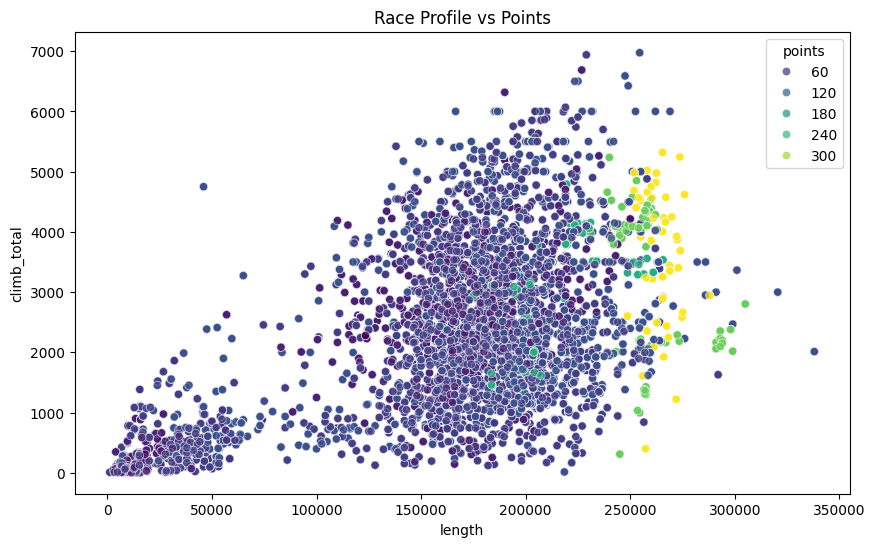

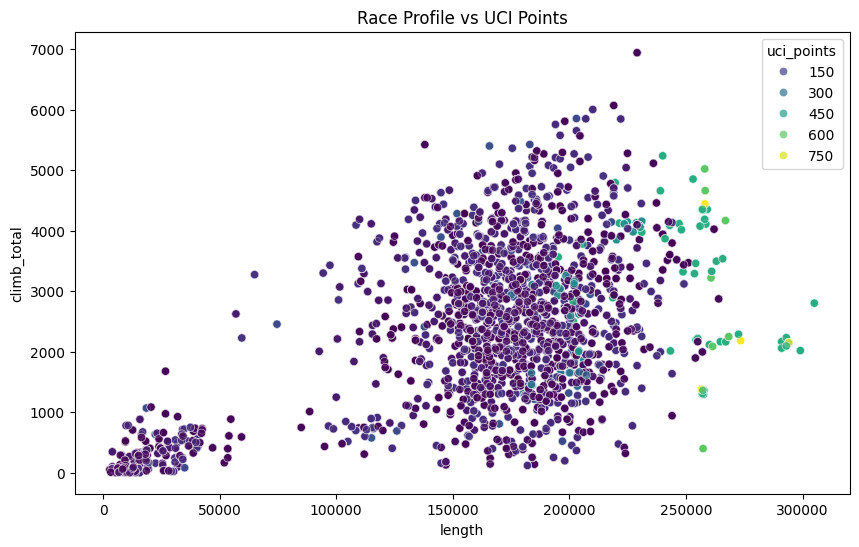

In [119]:
# 3.1 Race Profile vs Cyclist Performance
plt.figure(figsize=(10, 6))
sns.scatterplot(x='length', y='climb_total', hue='points', data=temp_df.dropna(subset=['length', 'climb_total', 'points']), palette='viridis', alpha=0.7)
plt.title('Race Profile vs Points')
plt.show()
plt.close()

# 3.2 Race Profile vs Cyclist UCI Points
plt.figure(figsize=(10, 6))
sns.scatterplot(x='length', y='climb_total', hue='uci_points', data=temp_df.dropna(subset=['length', 'climb_total', 'uci_points']), palette='viridis', alpha=0.7)
plt.title('Race Profile vs UCI Points')
plt.show()
plt.close()



### Observations on the Relationship Between Race Profile and Points/UCI Points

#### Data Structure:
- Both plots show "Race Profile vs Points", with length on the x-axis and climb_total on the y-axis.
- The top plot uses a general "points" system, while the bottom uses "UCI points".

#### Race Characteristics:
- Length ranges from near 0 to about 350,000 (likely meters, suggesting races up to 350km long).
- Climb_total ranges from 0 to about 7000 (likely meters of elevation gain).

#### Point Systems:
- The top plot uses a 60-300 point scale, while the bottom uses a 150-750 UCI point scale.
- Higher points/UCI points tend to cluster in the middle-right of the plots, suggesting longer races with moderate to high elevation gain are most valued.

#### Relationship between Race Profile and Points:
- There's a general trend where longer races with more climbing tend to award more points.
- However, the relationship isn't strictly linear, indicating other factors influence point allocation.

#### Race Types:
- The cluster of points near the bottom-left likely represents shorter, flatter races (e.g., criteriums, short time trials).
- The spread along the length axis with low climb_total might represent flat stage races or long time trials.
- Points in the upper-right quadrant likely represent mountainous stage races or challenging one-day races.

#### Performance Valuation:
- The highest point values tend to be awarded to races between 200-300km with 3000-5000m of climbing, suggesting these are considered the most prestigious or challenging events.

#### Outliers:
- A few races with extreme length (>300km) or extreme climbing (>6000m) exist but are rare.
- These might represent special events like ultra-endurance races or extreme mountain stages.

#### UCI vs. General Points:
- The UCI point system seems more selective, with fewer high-point races compared to the general point system.
- This suggests UCI points might be reserved for more prestigious or higher-level events.

#### Race Diversity:
- The wide spread of data points indicates a diverse range of race profiles in professional cycling, catering to different rider specialties.

#### Specialization Implications:
- The distribution suggests that to earn high points, cyclists need to excel in both endurance (length) and climbing ability.
- Specialists in very short or very flat races might have fewer opportunities for high point gains.

#### Season Structure:
- The clustering of high-point races in the middle-right suggests these might represent Grand Tours or major stage races, which are often the focus of the cycling season.

#### Strategic Implications:
- Cyclists and teams likely target races in the high-point clusters to maximize their rankings or UCI points.
- This could influence training focus, race selection, and career specialization for professional cyclists.

In conclusion, these plots reveal a complex relationship between race profiles and point allocation in professional cycling. They suggest that the sport values a combination of endurance and climbing ability, with the most points generally awarded to challenging, moderately long races with significant elevation gain. This insight provides valuable information about the structure of professional cycling and the skills most rewarded in the sport's point systems.

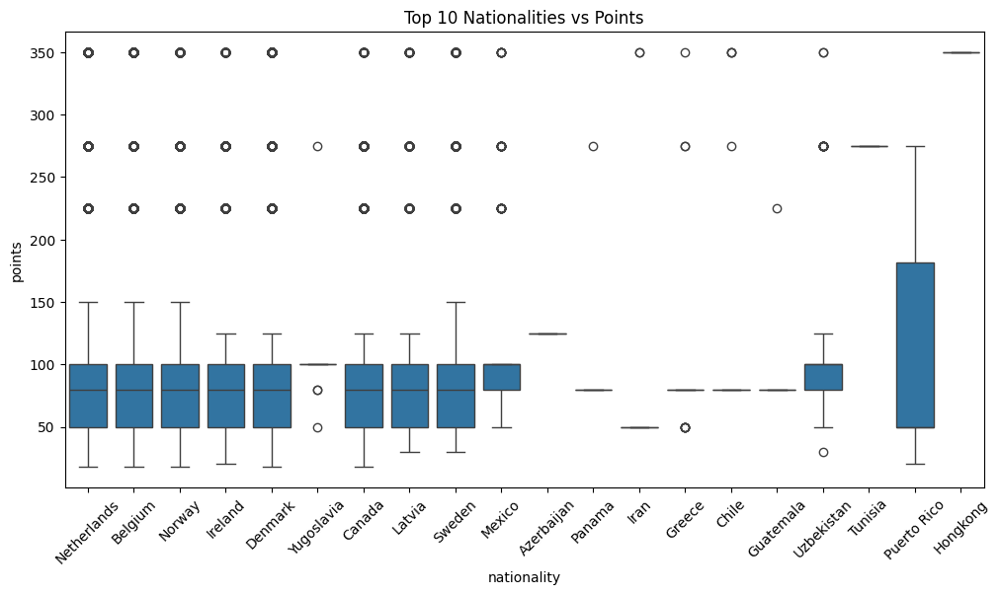

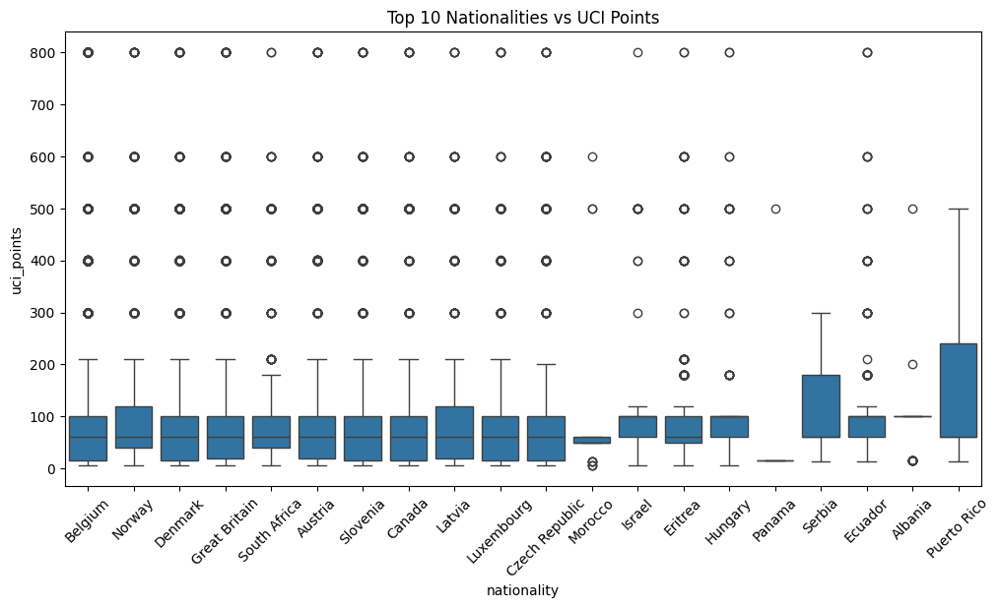

In [122]:
# 4.1 Nationality vs Performance
nationalities_grouped = temp_df.groupby('nationality')
top_nationalities_points = nationalities_grouped['points'].mean().sort_values(ascending=False).head(20).index
top_nationalities_uci_points = nationalities_grouped['uci_points'].mean().sort_values(ascending=False).head(20).index

plt.figure(figsize=(12, 6))
sns.boxplot(x='nationality', y='points', data=temp_df[temp_df['nationality'].isin(top_nationalities_points)])
plt.title('Top 10 Nationalities vs Points')
plt.xticks(rotation=45)
plt.show()
plt.close()

# 4.2 National vs UCI Points
plt.figure(figsize=(12, 6))
sns.boxplot(x='nationality', y='uci_points', data=temp_df[temp_df['nationality'].isin(top_nationalities_uci_points)])
plt.title('Top 10 Nationalities vs UCI Points')
plt.xticks(rotation=45)
plt.show()
plt.close()




### Observations on the Box Plots of Cyclist Nationalities vs Points/UCI Points

#### Point Systems:
- The top plot uses a general "points" system ranging from 0 to 350.
- The bottom plot uses "UCI points" ranging from 0 to 800.

#### Top Performing Nations:
- Both plots show a similar set of nations at the top, indicating consistency across different ranking systems.
- European countries dominate the top rankings, particularly those with strong cycling traditions like Belgium, Norway, Denmark, and the Netherlands.

#### Performance Distribution:
- Most nations have a wide range of performances, indicated by the box plots' height.
- Some countries (e.g., Netherlands, Belgium in the top plot) have higher medians, suggesting a generally stronger cycling program.

#### Elite Performers:
- The circles above the box plots represent outliers or exceptional performers.
- Almost all nations have at least one cyclist reaching the maximum points in both systems, suggesting world-class talent is distributed across many countries.

#### Depth of Talent:
- Countries with larger boxes (e.g., Belgium, Norway in both plots) likely have more depth in their cycling talent pool.
- Smaller boxes or just lines (e.g., Puerto Rico, Hong Kong in the top plot) might indicate fewer professional cyclists or less depth in the sport.

#### Emerging Cycling Nations:
- The presence of non-traditional cycling countries (e.g., Ecuador, Panama in the top plot; Morocco, Israel in the bottom) suggests the sport is globalizing.

#### UCI vs General Points:
- The UCI points system seems to have a wider range and more outliers, possibly indicating it's more sensitive to exceptional performances or specific high-profile races.

#### Professional Opportunities:
- Countries with higher medians and larger boxes likely provide more professional opportunities and support for cyclists.

#### Cycling Culture:
- The strong showing of certain countries (e.g., Belgium, Netherlands) likely reflects a strong cycling culture and infrastructure.

#### Specialization:
- Some countries might excel in specific types of races (e.g., Grand Tours vs one-day classics), which could be reflected in their point distributions.

#### Resource Allocation:
- Countries with consistently high performances likely invest more resources into cycling programs and development.

#### Competitive Landscape:
- The presence of outliers across many nations suggests that individual talent can thrive regardless of national program strength.

#### Data Limitations:
- The "Top 10" title suggests we're only seeing a subset of data, which might skew perceptions of global cycling competitiveness.

#### Potential for Growth:
- Countries with high outliers but lower medians (e.g., Ecuador in UCI points) might represent emerging cycling powers with potential for future growth.

In conclusion, these plots reveal a complex landscape of global cycling performance. While traditional European cycling powers dominate, there's evidence of global talent and emerging cycling nations. The distribution of points suggests that while national cycling programs play a significant role in overall performance, individual exceptional talent can emerge from various countries. The differences between the general points and UCI points systems also hint at the complexity of evaluating cycling performance across different types of races and competitions.

<Figure size 1200x600 with 0 Axes>

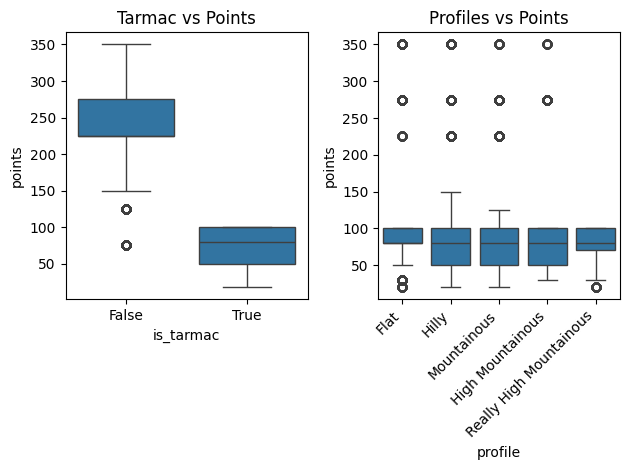

<Figure size 1200x600 with 0 Axes>

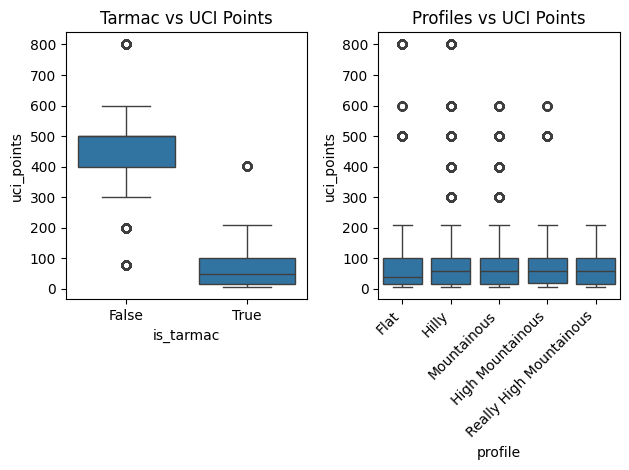

In [126]:
# 5.1 Race Surface vs Cyclist Performance
plt.figure(figsize=(12, 6))
fig, (ax1, ax2) = plt.subplots(1, 2)

sns.boxplot(x='is_tarmac', y='points', data=temp_df, ax=ax1)
ax1.set_title('Tarmac vs Points')
profiles = sns.boxplot(x='profile', y='points', data=temp_df, ax=ax2)
profiles.set_xticks(profiles.get_xticks())
profiles.set_xticklabels(['Flat', 'Hilly', 'Mountainous', 'High Mountainous', 'Really High Mountainous'])
ax2.set_title('Profiles vs Points')

plt.xticks(rotation=45, ha='right',horizontalalignment='right')
plt.tight_layout()
plt.show()
plt.close()

# 5.2 Race Surface vs Cyclist UCI Points
plt.figure(figsize=(12, 6))
fig, (ax1, ax2) = plt.subplots(1, 2)
sns.boxplot(x='is_tarmac', y='uci_points', data=temp_df, ax=ax1)
ax1.set_title('Tarmac vs UCI Points')
profiles = sns.boxplot(x='profile', y='uci_points', data=temp_df, ax=ax2)
profiles.set_xticks(profiles.get_xticks())
profiles.set_xticklabels(['Flat', 'Hilly', 'Mountainous', 'High Mountainous', 'Really High Mountainous'])
ax2.set_title('Profiles vs UCI Points')
plt.xticks(rotation=45, ha='right',horizontalalignment='right')
plt.tight_layout()
plt.show()
plt.close()


del temp_df

### Observations on the Box Plots of Tarmac vs Points and Profiles vs Points

#### Tarmac vs Points:
- **Non-tarmac races (False)** generally award significantly more points than tarmac races (True).
- The median for non-tarmac races is around 225 points, while for tarmac races it's about 75 points.
- This suggests that non-tarmac races (likely off-road, cyclocross, or mountain bike events) are valued more highly in this point system.
- There's less variation in points for tarmac races, indicating more standardized scoring or similar difficulty levels.

#### Profiles vs Points:
- The plot shows five different race profiles: Flat, Hilly, Mountainous, High Mountainous, and Really High Mountainous.
- Interestingly, the median points are relatively similar across all profiles, hovering around 75-100 points.
- However, the more extreme profiles (Flat and Really High Mountainous) have slightly higher medians.

#### Outliers and High-Point Races:
- All profiles except Flat have outlier races awarding much higher points (up to 350).
- This suggests that while the typical race in each profile awards similar points, there are special or more prestigious events in each category that offer significantly more points.

#### Variation Within Profiles:
- Hilly and Mountainous profiles show the largest interquartile range, indicating more variability in points awarded.
- This could suggest a wider range of race difficulties or importance within these categories.

#### Flat Races:
- Flat races have the smallest range of points but a higher median than some other profiles.
- This might indicate that flat races are more standardized in difficulty but are still valued in the cycling world.

#### Really High Mountainous:
- Despite being the most extreme profile, it doesn't necessarily award the most points on average.
- However, it does have high-point outliers, suggesting that while not all such races are high-scoring, some are among the most prestigious.

#### Relationship Between Tarmac and Profiles:
- Given the high points for non-tarmac races, it's likely that the profile categories primarily apply to tarmac races.
- The non-tarmac category might encompass a variety of off-road disciplines that are scored differently.

#### Point System Implications:
- The system appears to value variety, with high-point opportunities across different race types.
- It also seems to particularly value non-tarmac events, perhaps to encourage participation in these disciplines.

#### Cycling Disciplines:
- The data suggests a point system that covers multiple cycling disciplines, from road racing (tarmac with various profiles) to off-road events.

#### Race Prestige:
- The outliers in each category likely represent the most prestigious or challenging races in that profile.
- For example, the high-point outliers in the High Mountainous category could represent famous mountain stages in Grand Tours.

#### Cyclist Specialization:
- The variety in race types and points suggests that cyclists might specialize in certain profiles or surfaces to maximize their point potential.

In conclusion, this point system appears to be designed to reward cyclists who can perform across a variety of terrains and disciplines, with a particular emphasis on non-tarmac events. It also seems to recognize that within each race profile, there are standout events that offer significantly more points, likely reflecting their prestige or difficulty. This system would encourage well-rounded cyclists while also allowing for specialization in particular areas of the sport.


### Observations on the Box Plots of Tarmac vs UCI Points and Profiles vs UCI Points

#### Tarmac vs UCI Points:
- **Non-tarmac races (False)** generally award significantly more UCI points than tarmac races (True).
- The median for non-tarmac races is around 450 UCI points, while for tarmac races it's about 50 UCI points.
- This suggests that non-tarmac races (likely cyclocross, gravel, or mountain bike events) are highly valued in the UCI point system.
- There's more variation in points for non-tarmac races, indicating a wider range of event importance or difficulty.

#### Profiles vs UCI Points:
- The plot shows five different race profiles: Flat, Hilly, Mountainous, High Mountainous, and Really High Mountainous.
- Interestingly, the median UCI points are relatively similar across all profiles, hovering around 50-100 points.
- This suggests that the UCI values different types of road races somewhat equally in their base scoring.

#### Outliers and High-Point Races:
- All profiles have outlier races awarding much higher points (up to 800 UCI points).
- These likely represent the most prestigious events in each category, such as World Championships, Grand Tours, or major classics.

#### Variation Within Profiles:
- Hilly and Mountainous profiles show slightly larger interquartile ranges, indicating more variability in points awarded.
- This could reflect a wider range of race importance within these categories, from smaller stage races to major tours.

#### Flat Races:
- Flat races have a similar point distribution to other profiles, contradicting a common assumption that mountain stages are always more valuable.
- This suggests the UCI system aims to balance different rider specialties.

#### Really High Mountainous:
- Despite being the most extreme profile, it doesn't necessarily award the most points on average.
- However, it does have high-point outliers, likely representing key mountain stages in Grand Tours or specialized climbing races.

#### Relationship Between Tarmac and Profiles:
- The profile categories appear to apply exclusively to tarmac races, given the distinct separation in the first plot.
- Non-tarmac events are treated as a separate category with their own point system.

#### UCI Point System Implications:
- The system appears designed to encourage participation across various disciplines and terrains.
- It particularly rewards excellence in non-tarmac events, perhaps to promote these disciplines or reflect their technical difficulty.

#### Cycling Disciplines:
- The data suggests a comprehensive UCI point system covering both road racing (with various profiles) and off-road disciplines.

#### Event Prestige:
- The outliers in each category likely represent the sport's most prestigious events, showing that the UCI heavily weights the importance of specific races.

#### Cyclist Specialization and Versatility:
- The point distribution encourages both specialization (high points in specific categories) and versatility (similar median points across profiles).
- Riders might strategically choose their race calendar to maximize UCI points based on their strengths.

#### Season Structure:
- The high-point outliers across all categories suggest that the cycling season includes major events in various terrains and disciplines.

#### Development of Cycling:
- The high valuation of non-tarmac events might indicate UCI's effort to develop and promote these disciplines within professional cycling.

In conclusion, the UCI point system appears designed to create a balanced competitive environment that values both road and off-road cycling disciplines. It rewards exceptional performances across all types of terrain while maintaining a baseline of similar point allocations for typical races. This system likely aims to produce well-rounded cyclists and maintain interest in various aspects of the sport, from flat sprints to high mountain climbs and off-road adventures. The significant value placed on non-tarmac events is particularly noteworthy, suggesting a strategic focus on diversifying professional cycling.